# ***Step 1: Environment Setup and Required Libraries Installation***

This step installs all the necessary Python packages and dependencies used throughout the notebook. It ensures compatibility by specifying exact versions.


In [ ]:
!pip install numpy==2.2.5 \
            pandas==2.2.3 \
            matplotlib==3.10.1 \
            seaborn==0.13.2 \
            scipy==1.15.2 \
            scikit-learn==1.6.1 \
            opencv-python==4.11.0.86 \
            Pillow==11.2.1 \
            pywavelets==1.8.0 \
            tensorflow==2.19.0 \
            keras==3.9.2 \
            tqdm==4.67.1 \
            scikit-image==0.25.2 \
            einops==0.8.1 \
            timm==1.0.15 \
            torch==2.7.0 \
            gdal==3.10.3 \
            shapely==2.1.0 \
            geneticalgorithm==1.0.2 \
            imgaug==0.4.0


In [ ]:
!pip install PyWavelets
!pip install imgaug
!pip install keras
!pip install geneticalgorithm
!pip install tensorflow
!pip install imgaug

# ***Step 2: Import Libraries and Mount Google Drive***

This step handles mounting Google Drive for file access, and imports all necessary Python libraries for data processing, visualization, machine learning, image handling, optimization, and utility functions.


In [ ]:
# --- Drive and File Management ---
from google.colab import drive  # Mount Google Drive for access in Colab
drive.mount('/content/drive')
from google.colab import files  # Upload/download files in Colab

import os  # Interact with the operating system
import sys  # System-specific parameters and functions
import glob  # File pattern matching
import gc  # Garbage collection interface
import json  # JSON file parsing and writing
import time  # Time-related utilities
import copy  # Object copying (shallow and deep)
import random  # Random number generation

# --- Basic Python & Utilities ---
import math  # Mathematical functions
from math import trunc  # Truncate float to integer
import statistics  # Basic statistics operations
import itertools  # Iterator functions for looping
from itertools import combinations  # Create combinations
from functools import partial  # Partial function application
from collections import Counter  # Count hashable objects
from typing import Tuple, List  # Type hinting support
from __future__ import print_function  # Compatibility with Python 2 (print as function)

# --- Data Science & Visualization ---
import numpy as np  # Numerical computing
from numpy import newaxis  # Add new axis to arrays

import pandas as pd  # Data manipulation and analysis

import matplotlib.pyplot as plt  # Plotting library
import matplotlib  # Matplotlib customization

import seaborn as sns  # Statistical plotting

from tqdm import tqdm  # Loop progress bars

# --- Image Processing ---
import cv2  # OpenCV: image processing
from cv2 import imshow, Laplacian, Sobel, Canny  # Common edge detection/image functions

from PIL import Image  # Pillow image manipulation
import PIL  # Pillow image library

import pywt  # Wavelet transform library

from skimage import data, filters, io, img_as_ubyte, measure  # scikit-image utilities
from skimage.filters import threshold_multiotsu  # Multi-level thresholding
from skimage.metrics import peak_signal_noise_ratio as psnr_loss  # PSNR metric
from skimage.metrics import structural_similarity as ssim_loss  # SSIM metric
from skimage import img_as_float, restoration  # Image format conversion/restoration
from skimage.transform import radon, iradon  # Radon transform for tomography

from osgeo import gdal  # Geospatial raster file handling
from shapely.wkt import loads as load_wkt  # Load WKT geometries
from shapely.geometry import shape  # Shape creation from geometry

from imgaug import augmenters as iaa  # Image augmentation

# --- Machine Learning (TensorFlow / Keras) ---
import tensorflow as tf  # TensorFlow framework
from tensorflow import keras  # Keras API under TensorFlow

import keras  # Keras standalone library
from keras import datasets, layers, backend  # Core Keras modules
from keras.models import Sequential, save_model  # Model architecture/save
from keras.layers import Dense, Conv2D, Activation, MaxPooling2D, Dropout, Flatten  # CNN layers
from keras.applications import (  # Pretrained model APIs
    ResNet50, MobileNet, DenseNet201,
    InceptionV3, NASNetLarge, InceptionResNetV2
)
from keras.callbacks import Callback, ModelCheckpoint, ReduceLROnPlateau, TensorBoard  # Training callbacks
from tensorflow.keras.optimizers import Adam, SGD  # Optimizers

# --- Machine Learning (scikit-learn) ---
import sklearn  # General scikit-learn tools
from sklearn.model_selection import train_test_split  # Train-test split
from sklearn.metrics import (  # ML evaluation metrics
    confusion_matrix, accuracy_score, recall_score,
    precision_score, f1_score, cohen_kappa_score, mean_squared_error,
    jaccard_score, mean_absolute_error, roc_auc_score, log_loss
)
from sklearn.decomposition import PCA  # Principal Component Analysis
from sklearn.svm import SVC  # Support Vector Classifier
from sklearn.metrics import classification_report  # Classification summary

# --- Optimization & Algorithms ---
from scipy import optimize  # General optimization
from scipy.optimize import minimize  # Minimize objective functions
from numpy.random import rand  # Random numbers
import geneticalgorithm as ga  # Genetic algorithm-based optimization

# --- Deep Learning (PyTorch) ---
import torch  # PyTorch library
import torch.nn as nn  # Neural network layers
import torch.nn.functional as F  # Functional API
import torch.utils.checkpoint as checkpoint  # Memory-efficient training
from torch import einsum  # Einstein summation for tensors

import uuid  # Generate unique identifiers
import logging  # Logging utility
import asyncio  # Async programming
import platform  # System/platform information
from func_timeout import func_timeout, FunctionTimedOut  # Timeout handling

# --- System / Files ---
import shutil
from pathlib import Path

# --- Typing ---
from typing import Dict, Any, Iterable, Optional  # you already have Tuple, List

# --- CLI ---
import argparse

# --- Future annotations (helps with forward refs in type hints) ---
from __future__ import annotations

# --- PIL utilities ---
from PIL import ImageOps  # you already import Image

# --- Matplotlib helpers for vector overlays ---
from matplotlib.patches import Polygon
from matplotlib.lines import Line2D



# ***Step 3: Routine Pattern Recognition method***



*This module provides tools for image pattern recognition using morphological operations,*
edge detection techniques, and crack detection. It includes three main classes:
- MorphologyProcessor: Applies morphological transformations (e.g., erosion, dilation).
- EdgeDetector: Detects edges using algorithms like Sobel, Canny, and Prewitt.
- CrackDetector: Detects cracks in images using edge detection and machine learning (case study).
All classes inherit from a base class for shared image loading and processing logic.

**Sample of edge detections**

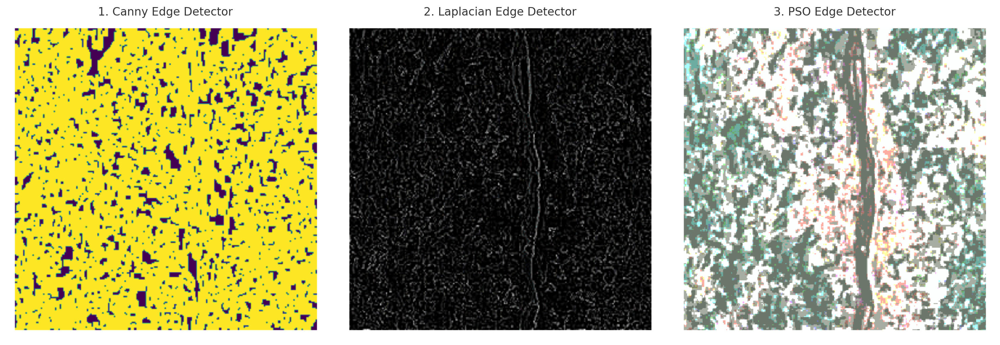

***Introduction Code***

In [ ]:
# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

def display_images(original, processed, title):
    """
    Displays original and processed images side by side.

    Parameters:
    - original (ndarray): Original image in BGR format (shape (H, W, 3)).
    - processed (ndarray): Processed image, typically grayscale (shape (H, W) or (H, W, 1)).
    - title (str): Title for the processed image.

    Raises:
    - ValueError: If original or processed image is invalid.
    """
    if original is None or processed is None:
        raise ValueError("Original or processed image is invalid.")

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(processed, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

class BaseImageProcessor:
    """Base class for image processing with common initialization and validation."""

    VALID_EXTENSIONS = ('.png', '.jpg', '.jpeg')

    def __init__(self, image_path):
        """
        Initialize with an image path and load the image.

        Parameters:
        - image_path (str): Path to the input image.

        Raises:
        - ValueError: If image_path is invalid, not an image file, or image cannot be loaded.
        """
        if not isinstance(image_path, str) or not os.path.isfile(image_path):
            raise ValueError(f"Invalid image path: {image_path}")
        if not image_path.lower().endswith(self.VALID_EXTENSIONS):
            raise ValueError(f"Unsupported file extension. Use {self.VALID_EXTENSIONS}")

        self.image_path = image_path
        self.original_image = cv2.imread(image_path)
        if self.original_image is None:
            raise ValueError(f"Image at path {image_path} could not be loaded.")
        self.gray_image = cv2.cvtColor(self.original_image, cv2.COLOR_BGR2GRAY)

***Morphology Method***

In [ ]:
class MorphologyProcessor(BaseImageProcessor):
    """Class for applying morphological operations to images."""

    def _get_kernel(self, kernel_size):
        """
        Create a rectangular kernel for morphological operations.

        Parameters:
        - kernel_size (tuple): Size of the kernel (width, height).

        Returns:
        - kernel (ndarray): Structuring element for morphological operations.

        Raises:
        - ValueError: If kernel_size is invalid.
        """
        if not isinstance(kernel_size, tuple) or len(kernel_size) != 2:
            raise ValueError("kernel_size must be a tuple of (width, height).")
        if not all(isinstance(x, int) and x > 0 and x % 2 == 1 for x in kernel_size):
            raise ValueError("Kernel dimensions must be positive odd integers.")

        return cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)

    def apply_erosion(self, kernel_size=(5, 5)):
        """Applies erosion to the grayscale image."""
        kernel = self._get_kernel(kernel_size)
        return cv2.erode(self.gray_image, kernel)

    def apply_dilation(self, kernel_size=(5, 5)):
        """Applies dilation to the grayscale image."""
        kernel = self._get_kernel(kernel_size)
        return cv2.dilate(self.gray_image, kernel)

    def apply_opening(self, kernel_size=(5, 5)):
        """Applies morphological opening (erosion followed by dilation)."""
        kernel = self._get_kernel(kernel_size)
        return cv2.morphologyEx(self.gray_image, cv2.MORPH_OPEN, kernel)

    def apply_closing(self, kernel_size=(5, 5)):
        """Applies morphological closing (dilation followed by erosion)."""
        kernel = self._get_kernel(kernel_size)
        return cv2.morphologyEx(self.gray_image, cv2.MORPH_CLOSE, kernel)

    def apply_gradient(self, kernel_size=(5, 5)):
        """Applies morphological gradient (difference between dilation and erosion)."""
        kernel = self._get_kernel(kernel_size)
        return cv2.morphologyEx(self.gray_image, cv2.MORPH_GRADIENT, kernel)

    def apply_tophat(self, kernel_size=(5, 5)):
        """Applies top hat operation (original image minus its opening)."""
        kernel = self._get_kernel(kernel_size)
        return cv2.morphologyEx(self.gray_image, cv2.MORPH_TOPHAT, kernel)

    def apply_blackhat(self, kernel_size=(5, 5)):
        """Applies black hat operation (closing minus original image)."""
        kernel = self._get_kernel(kernel_size)
        return cv2.morphologyEx(self.gray_image, cv2.MORPH_BLACKHAT, kernel)

***Edge Detection Methods***

In [ ]:
class EdgeDetector(BaseImageProcessor):
    """Class for detecting edges in images using various algorithms."""

    def sobel(self):
        """Apply Sobel edge detection."""
        sobel_x = cv2.Sobel(self.gray_image, cv2.CV_64F, 1, 0, ksize=3)
        sobel_y = cv2.Sobel(self.gray_image, cv2.CV_64F, 0, 1, ksize=3)
        return cv2.magnitude(sobel_x, sobel_y)

    def prewitt(self):
        """Apply Prewitt edge detection."""
        kernel_x = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
        kernel_y = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
        prewitt_x = cv2.filter2D(self.gray_image, -1, kernel_x)
        prewitt_y = cv2.filter2D(self.gray_image, -1, kernel_y)
        return cv2.magnitude(prewitt_x, prewitt_y)

    def canny(self, min_val=100, max_val=200):
        """Apply Canny edge detection."""
        if not (isinstance(min_val, int) and isinstance(max_val, int)):
            raise ValueError("min_val and max_val must be integers.")
        if min_val < 0 or max_val < min_val:
            raise ValueError("min_val must be non-negative and less than max_val.")

        return cv2.Canny(self.gray_image, min_val, max_val)

    def laplacian(self):
        """Apply Laplacian edge detection."""
        return cv2.Laplacian(self.gray_image, cv2.CV_64F)

    def scharr(self):
        """Apply Scharr edge detection."""
        scharr_x = cv2.Scharr(self.gray_image, cv2.CV_64F, 1, 0)
        scharr_y = cv2.Scharr(self.gray_image, cv2.CV_64F, 0, 1)
        return cv2.magnitude(scharr_x, scharr_y)

    def roberts(self):
        """Apply Roberts edge detection."""
        kernel_x = np.array([[1, 0], [0, -1]])
        kernel_y = np.array([[0, 1], [-1, 0]])
        roberts_x = cv2.filter2D(self.gray_image, -1, kernel_x)
        roberts_y = cv2.filter2D(self.gray_image, -1, kernel_y)
        return cv2.magnitude(roberts_x, roberts_y)

    def adaptive_threshold(self):
        """Apply adaptive thresholding to detect edge-like features."""
        return cv2.adaptiveThreshold(
            self.gray_image, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY, 11, 2
        )

***Case Study of Crack Detection method***

Class for detecting cracks in images using edge detection and SVM (case study).
Processes images from a folder with 'cracks' and 'no_cracks' subfolders.

In [ ]:
class CrackDetector:

    def __init__(self, image_folder):
        """
        Initialize the CrackDetector with the folder containing images.

        Parameters:
        - image_folder (str): Path to the folder containing 'cracks' and 'no_cracks' subfolders.
        """
        self.image_folder = image_folder
        self.images = []
        self.labels = []
        self.feature_vectors = []

    def load_data(self):
        """
        Load images and labels from the specified folder.
        Assumes folder structure: image_folder/class/imagename.jpg.
        """
        classes = ['cracks', 'no_cracks']
        for label in classes:
            class_folder = os.path.join(self.image_folder, label)
            if not os.path.isdir(class_folder):
                raise ValueError(f"Folder not found: {class_folder}")
            for filename in os.listdir(class_folder):
                if filename.lower().endswith(('.jpg', '.png')):
                    img_path = os.path.join(class_folder, filename)
                    try:
                        processor = BaseImageProcessor(img_path)
                        self.images.append(processor.gray_image)
                        self.labels.append(0 if label == 'no_cracks' else 1)  # 0: no cracks, 1: cracks
                    except ValueError as e:
                        logging.error(f"Failed to load {img_path}: {str(e)}")

    def preprocess_crack_features(self):
        """
        Preprocess images to extract crack features using Canny edge detection,
        thresholding, and connected component analysis.
        """
        for img in self.images:
            # Apply Canny Edge Detection (reusing EdgeDetector's approach)
            edges = cv2.Canny(img, 100, 200)

            # Thresholding to create binary image
            thresh = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

            # Label connected components
            label_image = measure.label(thresh)

            # Calculate features based on labeled regions
            features = [region.area for region in measure.regionprops(label_image)]

            # Store the mean area as a feature
            self.feature_vectors.append(np.mean(features) if features else 0)

        self.feature_vectors = np.array(self.feature_vectors).reshape(-1, 1)

    def train_model(self):
        """
        Train an SVM model using the extracted crack features and evaluate it.
        """
        if len(self.feature_vectors) == 0 or len(self.labels) == 0:
            raise ValueError("No features or labels available for training.")

        X_train, X_test, y_train, y_test = train_test_split(
            self.feature_vectors, self.labels, test_size=0.2, random_state=42
        )

        model = SVC(kernel='linear')
        model.fit(X_train, y_train)

        # Evaluate the model
        y_pred = model.predict(X_test)
        print("Crack Detection Classification Report:")
        print(classification_report(y_test, y_pred))
        return model

    def run(self):
        """
        Run the full crack detection pipeline: load data, preprocess features, and train model.
        """
        logging.info("Starting crack detection pipeline")
        self.load_data()
        self.preprocess_crack_features()
        model = self.train_model()
        logging.info("Crack detection pipeline completed")
        return model

def process_images_in_directory(directory_path):
    """
    Process all image files in a directory using ImageDataReducer.

    Args:
        directory_path (str): Path to directory containing image files.

    Raises:
        FileNotFoundError: If directory does not exist.
    """
    try:
        if not os.path.isdir(directory_path):
            raise FileNotFoundError(f"Directory not found: {directory_path}")

        valid_extensions = ('.jpg', '.jpeg', '.png')
        for filename in os.listdir(directory_path):
            if filename.lower().endswith(valid_extensions):
                image_path = os.path.join(directory_path, filename)
                try:
                    reducer = ImageDataReducer(image_path)
                    reducer.compress_image(quality=80)
                    reducer.downsample(scale_percent=50)
                    reducer.quantize_colors(num_colors=8)
                    reducer.apply_pca(components=2)
                    reducer.subsample(factor=2)
                    reducer.roi_coding(roi=(0, 0, 100, 100))
                    reducer.display_image()
                except Exception as e:
                    logging.error(f"Failed to process {image_path}: {str(e)}")
        logging.info(f"Completed processing images in {directory_path}")
    except Exception as e:
        logging.error(f"Error processing directory: {str(e)}")
        raise

def process_and_display(processor, methods, category):
    """
    Apply a set of methods from a processor and display results.

    Parameters:
    - processor: Instance of MorphologyProcessor or EdgeDetector.
    - methods (dict): Dictionary of method names and their corresponding functions.
    - category (str): Category name for display (e.g., 'Morphological Operations').
    """
    print(f"Applying {category}")
    for name, method in methods.items():
        try:
            result = method()
            display_images(processor.original_image, result, name.capitalize())
        except Exception as e:
            print(f"Error processing {name}: {str(e)}")

def run_crack_detection_case_study(image_folder):
    """
    Case Study: Run the CrackDetector on a folder with 'cracks' and 'no_cracks' subfolders.

    Parameters:
    - image_folder (str): Path to the folder containing image subfolders.

    Raises:
    - ValueError: If the folder structure is invalid or processing fails.
    """
    try:
        detector = CrackDetector(image_folder)
        model = detector.run()
        logging.info("Crack detection case study completed successfully")
        return model
    except Exception as e:
        logging.error(f"Error in crack detection case study: {str(e)}")
        raise

def main():
    """
    Main function to demonstrate MorphologyProcessor, EdgeDetector, ImageDataReducer,
    and the CrackDetector case study on a single image or folder.
    """
    try:
        # Replace with actual paths
        image_path = 'path_to_image.jpg'  # For MorphologyProcessor and EdgeDetector
        image_folder = 'path_to_crack_image_folder'  # For CrackDetector case study

        # Initialize processors
        morph_processor = MorphologyProcessor(image_path)
        edge_detector = EdgeDetector(image_path)

        # Morphology operations
        morph_methods = {
            'Erosion': morph_processor.apply_erosion,
            'Dilation': morph_processor.apply_dilation,
            'Opening': morph_processor.apply_opening,
            'Closing': morph_processor.apply_closing,
            'Gradient': morph_processor.apply_gradient,
            'Tophat': morph_processor.apply_tophat,
            'Blackhat': morph_processor.apply_blackhat
        }

        # Edge detection operations
        edge_methods = {
            'Sobel': edge_detector.sobel,
            'Prewitt': edge_detector.prewitt,
            'Canny': edge_detector.canny,
            'Laplacian': edge_detector.laplacian,
            'Scharr': edge_detector.scharr,
            'Roberts': edge_detector.roberts,
            'Adaptive Threshold': edge_detector.adaptive_threshold
        }

        # Process and display results
        process_and_display(morph_processor, morph_methods, "Morphological Operations")
        process_and_display(edge_detector, edge_methods, "Edge Detection Methods")

        # Run ImageDataReducer on a directory
        process_images_in_directory(image_folder)

        # Run CrackDetector case study
        print("\nRunning Crack Detection Case Study")
        run_crack_detection_case_study(image_folder)

    except Exception as e:
        print(f"Error in main: {str(e)}")

if __name__ == "__main__":
    main()

Error in main: Invalid image path: path_to_image.jpg


# ***Step 4: Define Image Preprocessing and Augmentation methods***

This step defines a comprehensive class to manage image preprocessing tasks such as loading, displaying, resizing, normalizing, histogram plotting, noise addition, grayscale conversion, and a full set of data augmentation operations. It also supports label transformation for YOLO-format annotations.

**Sample of preprocessing**

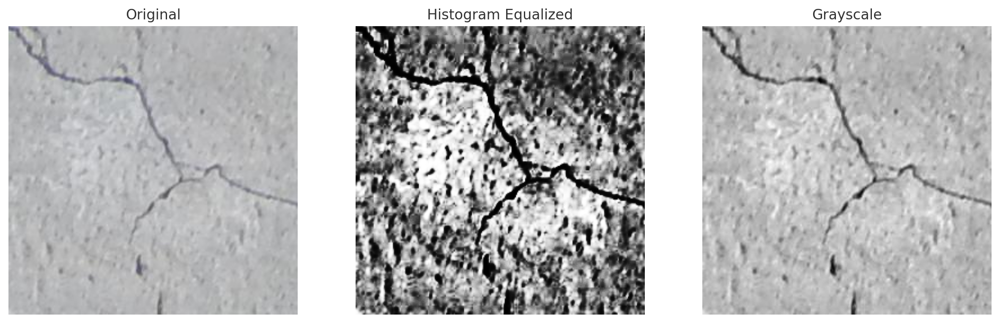

**Sample of data augmentation**

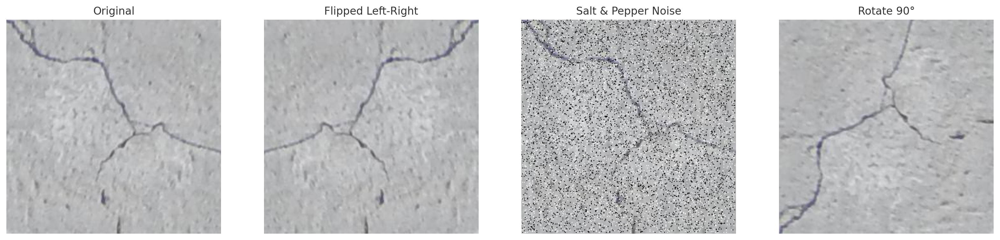

In [ ]:
class ImagePreprocessor:
    def __init__(self, image_path=None):
        """
        Initializes the ImagePreprocessor with an optional image path.

        Args:
            image_path (str, optional): Path to the image file to read.

        Raises:
            ValueError: If image_path is provided but invalid.
        """
        self.image = None
        self.twoDimage = None
        self.augmented_images = []
        if image_path:
            self.read_image(image_path)

    def read_image(self, image_path):
        """
        Reads an image from the given path.

        Args:
            image_path (str): Path to the image file.

        Raises:
            ValueError: If the image cannot be loaded.
        """
        if not os.path.exists(image_path):
            raise ValueError(f"Image path does not exist: {image_path}")
        self.image = cv2.imread(image_path)
        if self.image is None:
            raise ValueError(f"Failed to load image from: {image_path}")
        self.image = cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB)
        print(f"Image loaded successfully from {image_path}")

    def _display_image(self, image, title="Pre-Processed Image", save_path=None):
        """
        Utility method to display and optionally save an image.

        Args:
            image (np.ndarray or PIL.Image): Image to display.
            title (str): Title for the plot.
            save_path (str, optional): Path to save the image.
        """
        if image is None:
            raise ValueError("No image provided to display.")

        plt.figure(figsize=(5, 5))
        plt.imshow(image if isinstance(image, np.ndarray) else np.array(image))
        plt.title(title)
        plt.axis('off')

        if save_path:
            os.makedirs(os.path.dirname(save_path), exist_ok=True)
            plt.savefig(save_path, bbox_inches='tight', pad_inches=0)

        plt.show()
        plt.close()

    def plot_image(self, title="Pre-Processed Image"):
        """
        Plots the current image.

        Args:
            title (str): Title for the plot.
        """
        if self.image is None:
            raise ValueError("No image loaded to plot.")
        self._display_image(self.image, title)

    def calculate_rgb_histograms(self):
        """
        Calculates histograms for RGB channels.

        Returns:
            dict: Histograms for Blue, Green, and Red channels.

        Raises:
            ValueError: If no image is loaded or not in RGB format.
        """
        if self.image is None or len(self.image.shape) != 3:
            raise ValueError("No RGB image loaded to calculate histograms.")

        return {
            "blue": cv2.calcHist([self.image], [0], None, [256], [0, 256]),
            "green": cv2.calcHist([self.image], [1], None, [256], [0, 256]),
            "red": cv2.calcHist([self.image], [2], None, [256], [0, 256])
        }

    def plot_color_histograms(self, combined=True):
        """
        Plots RGB histograms.

        Args:
            combined (bool): If True, plots a combined histogram; else, separate.

        Raises:
            ValueError: If no image is loaded.
        """
        histograms = self.calculate_rgb_histograms()
        blue_hist, green_hist, red_hist = histograms["blue"], histograms["green"], histograms["red"]

        plt.figure(figsize=(10, 4 if combined else 8))
        if combined:
            plt.title("RGB Histograms")
            plt.xlabel("Value")
            plt.ylabel("Frequency")
            plt.plot(blue_hist, color="blue", label="Blue")
            plt.plot(green_hist, color="green", label="Green")
            plt.plot(red_hist, color="red", label="Red")
            plt.legend()
        else:
            for i, (hist, color, title) in enumerate([
                (blue_hist, "blue", "Blue Histogram"),
                (green_hist, "green", "Green Histogram"),
                (red_hist, "red", "Red Histogram")
            ], 1):
                plt.subplot(3, 1, i)
                plt.title(title)
                plt.xlabel("Value")
                plt.ylabel("Frequency")
                plt.plot(hist, color=color)

        plt.tight_layout()
        plt.show()

    def convert_to_2d_vector(self):
        """
        Converts the image to a 2D vector (flattened).

        Returns:
            np.ndarray: Flattened image in float32 format.

        Raises:
            ValueError: If no image is loaded.
        """
        if self.image is None:
            raise ValueError("No image loaded to convert to 2D vector.")

        self.twoDimage = self.image.reshape((-1, 3)).astype(np.float32)
        print(f"Image converted to 2D vector with shape {self.twoDimage.shape}")
        return self.twoDimage

    def resize(self, width, height):
        """
        Resize the image.
        Args:
            width (int): Target width.
            height (int): Target height.
        """
        if self.image is None:
            raise ValueError("No image loaded to resize.")
        if width <= 0 or height <= 0:
            raise ValueError("Width and height must be positive.")
        self.image = cv2.resize(self.image, (width, height))

    def normalize(self):
        """
        Normalize image pixel values to [0, 1].
        """
        if self.image is None:
            raise ValueError("No image loaded to normalize.")
        self.image = self.image.astype(np.float32) / 255.0

    def to_grayscale(self, method='opencv'):
        """
        Convert the image to grayscale.
        Args:
            method (str): Conversion method ('opencv', 'pil', 'manual').
        """
        if self.image is None:
            raise ValueError("No image loaded to convert to grayscale.")

        if method == 'opencv':
            self.image = cv2.cvtColor(self.image, cv2.COLOR_RGB2GRAY)
        elif method == 'pil':
            self.image = np.array(Image.fromarray(self.image).convert('L'))
        elif method == 'manual':
            r, g, b = cv2.split(self.image)
            self.image = (0.299 * r + 0.587 * g + 0.114 * b).astype(np.uint8)
        else:
            raise ValueError(f"Unsupported grayscale method: {method}")

    def histogram_equalization(self):
        """
        Apply histogram equalization.
        """
        if self.image is None:
            raise ValueError("No image loaded for histogram equalization.")

        if len(self.image.shape) == 3:
            yuv = cv2.cvtColor(self.image, cv2.COLOR_RGB2YUV)
            yuv[:, :, 0] = cv2.equalizeHist(yuv[:, :, 0].astype(np.uint8))
            self.image = cv2.cvtColor(yuv, cv2.COLOR_YUV2RGB)
        else:
            self.image = cv2.equalizeHist(self.image.astype(np.uint8))

    def crop(self, start_x, start_y, width, height):
        """
        Crop the image.
        Args:
            start_x (int): Starting x-coordinate.
            start_y (int): Starting y-coordinate.
            width (int): Width of the crop.
            height (int): Height of the crop.
        """
        if self.image is None:
            raise ValueError("No image loaded to crop.")
        if start_x < 0 or start_y < 0 or width <= 0 or height <= 0:
            raise ValueError("Invalid crop parameters.")
        if start_x + width > self.image.shape[1] or start_y + height > self.image.shape[0]:
            raise ValueError("Crop dimensions exceed image size.")
        self.image = self.image[start_y:start_y + height, start_x:start_x + width]

    def color_space_transform(self, color_space=cv2.COLOR_RGB2HSV):
        """
        Transform the image to a different color space.

        Args:
            color_space (int): OpenCV color space conversion code.
        """
        if self.image is None:
            raise ValueError("No image loaded for color space transformation.")
        self.image = cv2.cvtColor(self.image, color_space)

    def add_noise(self, image, noise_type='gaussian', **kwargs):
        """
        Add noise to an image.

        Args:
            image (np.ndarray): Input image.
            noise_type (str): Type of noise ('gaussian', 'salt_pepper', 'speckle', 'poisson', 'uniform').
            **kwargs: Additional parameters for noise generation.

        Returns:
            np.ndarray: Noisy image.
        """
        normalized = image.astype(np.float32) / 255.0 if image.max() > 1 else image

        if noise_type == 'gaussian':
            mean = kwargs.get('mean', 0)
            std = kwargs.get('std', 0.1)
            noise = np.random.normal(mean, std, image.shape)
            noisy = np.clip(normalized + noise, 0, 1)

        elif noise_type == 'salt_pepper':
            amount = kwargs.get('amount', 0.05)
            s_vs_p = kwargs.get('s_vs_p', 0.5)
            noisy = normalized.copy()
            num_salt = np.ceil(amount * normalized.size * s_vs_p).astype(int)
            num_pepper = np.ceil(amount * normalized.size * (1.0 - s_vs_p)).astype(int)

            coords = [np.random.randint(0, i - 1, num_salt) for i in normalized.shape]
            noisy[tuple(coords)] = 1

            coords = [np.random.randint(0, i - 1, num_pepper) for i in normalized.shape]
            noisy[tuple(coords)] = 0

        elif noise_type == 'speckle':
            noise = np.random.randn(*image.shape)
            noisy = np.clip(normalized + normalized * noise, 0, 1)

        elif noise_type == 'poisson':
            vals = len(np.unique(normalized))
            vals = 2 ** np.ceil(np.log2(vals))
            noisy = np.random.poisson(normalized * vals) / float(vals)
            noisy = np.clip(noisy, 0, 1)

        elif noise_type == 'uniform':
            low = kwargs.get('low', -0.1)
            high = kwargs.get('high', 0.1)
            noise = np.random.uniform(low, high, image.shape)
            noisy = np.clip(normalized + noise, 0, 1)

        else:
            raise ValueError(f"Unsupported noise type: {noise_type}")

        return (noisy * 255).astype(np.uint8) if image.max() > 1 else noisy

    def augment_image(self, operations=None, yolo_label_path=None, save_img_path=None, save_lbl_path=None, base_name=None):
        """
        Apply augmentation operations to the image and optionally transform YOLO labels.

        Args:
            operations (list, optional): List of augmentation operations to apply.
            yolo_label_path (str, optional): Path to YOLO label file.
            save_img_path (str, optional): Directory to save augmented images.
            save_lbl_path (str, optional): Directory to save transformed labels.
            base_name (str, optional): Base name for saved files.

        Returns:
            list: List of augmented images (np.ndarray).
        """
        if self.image is None:
            raise ValueError("No image loaded for augmentation.")

        self.augmented_images = []
        pil_image = Image.fromarray(self.image)
        img_width, img_height = pil_image.size
        labels = []

        if yolo_label_path:
            if not os.path.exists(yolo_label_path):
                raise ValueError(f"YOLO label file not found: {yolo_label_path}")
            with open(yolo_label_path, 'r') as file:
                labels = [list(map(float, line.strip().split())) for line in file.readlines()]

        operations = operations or [
            ('flip_horizontal', lambda img: img.transpose(Image.FLIP_LEFT_RIGHT), 'flip_left_right'),
            ('flip_vertical', lambda img: img.transpose(Image.FLIP_TOP_BOTTOM), 'flip_up_down'),
            ('rotate_90', lambda img: img.rotate(90, expand=False), 'rotate_90'),
            ('rotate_180', lambda img: img.rotate(180, expand=False), 'rotate_180'),
            ('rotate_270', lambda img: img.rotate(270, expand=False), 'rotate_270'),
            ('gaussian_noise', lambda img: self.add_noise(img, noise_type='gaussian', mean=0, std=0.1), None),
            ('salt_pepper_noise', lambda img: self.add_noise(img, noise_type='salt_pepper', amount=0.05, s_vs_p=0.5), None),
            ('speckle_noise', lambda img: self.add_noise(img, noise_type='speckle'), None),
            ('poisson_noise', lambda img: self.add_noise(img, noise_type='poisson'), None),
            ('uniform_noise', lambda img: self.add_noise(img, noise_type='uniform', low=-0.1, high=0.1), None),
            ('brightness', lambda img: cv2.convertScaleAbs(img, beta=50), None),
            ('contrast', lambda img: cv2.convertScaleAbs(img, alpha=1.2), None),
            ('imgaug', lambda img: iaa.Sequential([
                iaa.Fliplr(0.5),
                iaa.Flipud(0.5),
                iaa.Affine(rotate=(-25, 25)),
                iaa.AdditiveGaussianNoise(scale=(0, 0.1 * 255)),
                iaa.Multiply((0.8, 1.2)),
                iaa.SomeOf((0, 2), [
                    iaa.GaussianBlur(sigma=(0, 1.0)),
                    iaa.Affine(scale=(0.5, 1.5)),
                    iaa.Add((-10, 10))
                ])
            ])(images=[img])[0], None)
        ]

        for op_name, op_func, label_transform in operations:
            try:
                if op_name in ['gaussian_noise', 'salt_pepper_noise', 'speckle_noise', 'poisson_noise', 'uniform_noise', 'brightness', 'contrast', 'imgaug']:
                    aug_image = op_func(self.image)
                    aug_image = aug_image if isinstance(aug_image, np.ndarray) else np.array(aug_image)
                else:
                    aug_image = np.array(op_func(pil_image))

                self.augmented_images.append(aug_image)

                if save_img_path and base_name:
                    os.makedirs(save_img_path, exist_ok=True)
                    cv2.imwrite(os.path.join(save_img_path, f"{base_name}_{op_name}.jpg"), cv2.cvtColor(aug_image, cv2.COLOR_RGB2BGR))

                if labels and label_transform and save_lbl_path:
                    os.makedirs(save_lbl_path, exist_ok=True)
                    transformed_labels = []
                    for label in labels:
                        class_id, cx, cy, w, h = label
                        if label_transform == 'flip_up_down':
                            cy = 1.0 - cy
                        elif label_transform == 'flip_left_right':
                            cx = 1.0 - cx
                        elif label_transform == 'rotate_90':
                            cx, cy = cy, 1.0 - cx
                        transformed_labels.append([class_id, cx, cy, w, h])

                    with open(os.path.join(save_lbl_path, f"{base_name}_{op_name}.txt"), 'w') as f:
                        for label in transformed_labels:
                            f.write(' '.join(map(str, label)) + '\n')

            except Exception as e:
                print(f"Error applying augmentation {op_name}: {str(e)}")

        return self.augmented_images

# ***Step 5: Define Image Denoising methods***

***Image Denoising methods***
1. Image Processing Based Methods
2. Data Driven Based Methods (Case study of shadow removal by CNN-based method)

*Image Processing-based methods*


This step provides methods for various image denoising techniques, including bilateral, median, Gaussian, Wiener, anisotropic diffusion, non-local means, total variation, Fourier transform filtering, and wavelet denoising. It also includes utility functions for median filtering, edge median filtering, shadow region display, shadow correction in LAB and BGR color spaces, shadow region processing, and shadow mask calculation.

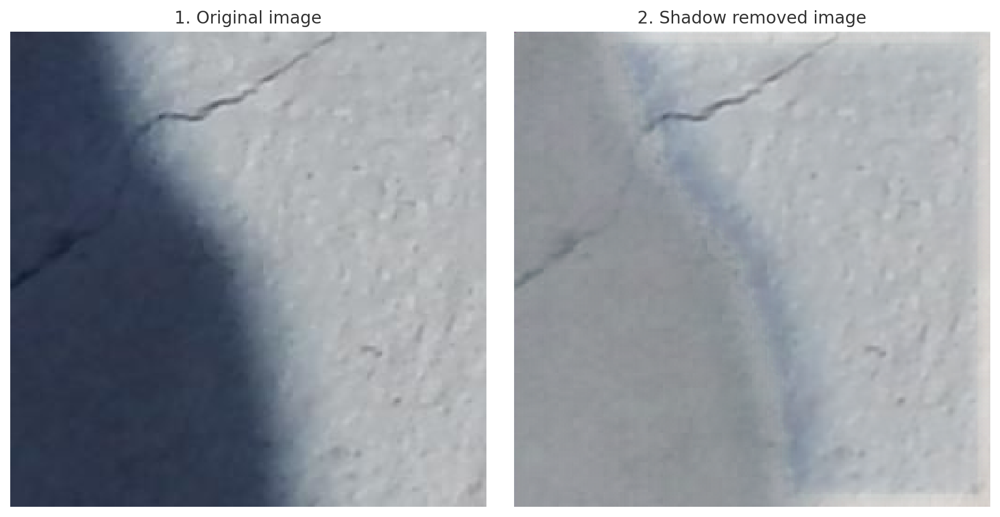

**Mask producing**

In [ ]:
class ImageDenoising:
    def __init__(self, image_path):
        """Initialize with the path to the image."""
        self.image = cv2.imread(image_path)
        if self.image is None:
            raise ValueError("Image could not be loaded.")
        self.gray_image = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)

    def apply_bilateral_filter(self, d=10, sigma_color=40, sigma_space=40):
        """Apply Bilateral Filter to the image."""
        bilateral = cv2.bilateralFilter(self.image, d, sigma_color, sigma_space)
        return bilateral

    def apply_median_filter(self, filter_size=5):
        """Apply Median Filter to the image."""
        filtered_image = cv2.medianBlur(self.image, filter_size)
        return filtered_image

    def apply_gaussian_filter(self, kernel_size=(5, 5), sigmaX=0):
        """Apply Gaussian Filter to the image."""
        filtered_image = cv2.GaussianBlur(self.image, kernel_size, sigmaX)
        return filtered_image

    def apply_wiener_filter(self, noise_var=0.01):
        """Apply Wiener Filter to the grayscale image."""
        filtered_image = restoration.wiener(self.gray_image, np.ones((5, 5)), noise_var)
        return filtered_image

    def apply_anisotropic_diffusion(self, num_iterations=10, kappa=15, gamma=0.1):
        """Apply Anisotropic Diffusion Filter to the grayscale image."""
        img = img_as_float(self.gray_image)
        result = img.copy()
        for _ in range(num_iterations):
            gradient_n = np.roll(result, -1, axis=0) - result
            gradient_s = np.roll(result, 1, axis=0) - result
            gradient_e = np.roll(result, -1, axis=1) - result
            gradient_w = np.roll(result, 1, axis=1) - result

            c_n = np.exp(-(gradient_n ** 2) / kappa)
            c_s = np.exp(-(gradient_s ** 2) / kappa)
            c_e = np.exp(-(gradient_e ** 2) / kappa)
            c_w = np.exp(-(gradient_w ** 2) / kappa)

            result += gamma * (c_n * gradient_n + c_s * gradient_s + c_e * gradient_e + c_w * gradient_w)
        return result

    def apply_non_local_means_denoising(self, h=10, template_window_size=7, search_window_size=21):
        """Apply Non-Local Means Denoising to the image."""
        image_float = img_as_float(self.image)
        denoised_image = cv2.fastNlMeansDenoisingColored(
            self.image, None, h, h, templateWindowSize=template_window_size, searchWindowSize=search_window_size
        )
        return denoised_image

    def apply_total_variation_denoising(self, weight=0.1):
        """Apply Total Variation Denoising to the image."""
        image_float = self.image.astype(np.float32) / 255.0
        denoised_image = restoration.denoise_tv_chambolle(image_float, weight=weight, multichannel=True)
        return (denoised_image * 255).astype(np.uint8)

    def apply_fourier_transform_filter(self, cutoff_radius=30):
        """Apply Fourier Transform Filter to the grayscale image."""
        image_float = self.gray_image.astype(np.float32)
        f_transform = np.fft.fft2(image_float)
        f_transform_shifted = np.fft.fftshift(f_transform)
        rows, cols = image_float.shape
        center_row, center_col = rows // 2, cols // 2
        y, x = np.ogrid[-center_row:rows - center_row, -center_col:cols - center_col]
        mask = np.sqrt(x**2 + y**2) <= cutoff_radius
        f_transform_filtered = f_transform_shifted * mask
        f_transform_ishifted = np.fft.ifftshift(f_transform_filtered)
        filtered_image = np.fft.ifft2(f_transform_ishifted).real
        filtered_image = cv2.normalize(filtered_image, None, 0, 255, cv2.NORM_MINMAX)
        return filtered_image.astype(np.uint8)

    def apply_wavelet_denoising(self, wavelet='haar', level=1, threshold=0.2):
        """Apply Wavelet Denoising to the grayscale image."""
        coeffs = pywt.wavedec2(self.gray_image, wavelet, level=level)
        coeffs_thresholded = list(coeffs)
        for i in range(1, len(coeffs_thresholded)):
            coeffs_thresholded[i] = tuple(
                pywt.threshold(c, threshold * np.max(c), mode='soft') for c in coeffs_thresholded[i]
            )
        denoised_image = pywt.waverec2(coeffs_thresholded, wavelet)
        denoised_image = np.clip(denoised_image, 0, 255)
        return denoised_image.astype(np.uint8)

    def display_image(self, filtered, title='Filtered Image'):
        """Display original and filtered images side by side."""
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title('Original Image')
        plt.imshow(cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title(title)
        if filtered.ndim == 2:  # Grayscale image
            plt.imshow(filtered, cmap='gray')
        else:  # Color image
            plt.imshow(cv2.cvtColor(filtered, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

# Example Usage
if __name__ == "__main__":
    # Replace 'path_to_image.jpg' with the actual image path
    denoiser = ImageDenoising('path_to_image.jpg')

    # Apply and display Bilateral Filter
    bilateral = denoiser.apply_bilateral_filter()
    denoiser.display_image(bilateral, 'Bilateral Filter')

    # Apply and display Gaussian Filter
    gaussian = denoiser.apply_gaussian_filter()
    denoiser.display_image(gaussian, 'Gaussian Filter')

*Shadow Removal Method* must be revised

This section focuses on a case study of shadow removal using CNN-based methods, leveraging the functions and corrections applied to shadow regions, mask calculations, and image preprocessing.


In [ ]:
def median_filter(img: np.ndarray,
                  point: np.ndarray,
                  filter_size: int) -> List:
    """
    Applies median filtering over the given point in the image.

    Args:
        img: The input image as a numpy array.
        point: The coordinates of the point to apply the filter.
        filter_size: The size of the filter to be applied.

    Returns:
        A list representing the median pixel values after filtering.
    """
    try:
        indices = [[x, y] for x in range(point[1] - filter_size // 2, point[1] + filter_size // 2 + 1)
                   for y in range(point[0] - filter_size // 2, point[0] + filter_size // 2 + 1)]
        indices = list(filter(lambda x: not (x[0] < 0 or x[1] < 0 or x[0] >= img.shape[0] or x[1] >= img.shape[1]), indices))

        pixel_values = [0, 0, 0]

        for channel in range(3):
            pixel_values[channel] = [img[index[0], index[1], channel] for index in indices]

        pixel_values = list(np.median(pixel_values, axis=1))
        return pixel_values
    except Exception as e:
        print(f"Error in median_filter: {e}")
        return [0, 0, 0]


def edge_median_filter(img: np.ndarray,
                       contours_list: tuple,
                       filter_size: int = 7) -> np.ndarray:
    """
    Applies median filtering to the contour pixels in the image.

    Args:
        img: The input image as a numpy array.
        contours_list: List of contours for edge detection.
        filter_size: The size of the median filter.

    Returns:
        The image after applying edge median filtering.
    """
    try:
        temp_img = np.copy(img)

        for partition in contours_list:
            for point in partition:
                temp_img[point[0][1]][point[0][0]] = median_filter(img, point[0], filter_size)

        return cv.cvtColor(temp_img, cv.COLOR_HSV2BGR)
    except Exception as e:
        print(f"Error in edge_median_filter: {e}")
        return img


def display_region(org_image: np.ndarray,
                   shadow_clear_image: np.ndarray,
                   label: int,
                   label_region: np.ndarray,
                   contours: tuple) -> None:
    """
    Display the shadow regions and the corrected image for debugging.

    Args:
        org_image: The original image.
        shadow_clear_image: The image with the shadow region cleared.
        label: The label for the shadow region.
        label_region: The mask for the shadow region.
        contours: The contours around the shadow region.
    """
    try:
        reverse_mask = cv.cvtColor(cv.bitwise_not(label_region), cv.COLOR_GRAY2BGR)
        img_w_hole = org_image & reverse_mask

        temp_filter = cv.cvtColor(label_region, cv.COLOR_GRAY2BGR)
        cv.drawContours(temp_filter, contours, -1, (255, 0, 0), 3)

        fig, axes = plt.subplots(2, 2)

        ax = axes.ravel()

        plt.title(f"Shadow Region {label}")

        ax[0].imshow(cv.cvtColor(org_image, cv.COLOR_BGR2RGB))
        ax[0].set_title("Original Image")
        ax[0].axis('off')

        ax[1].imshow(cv.cvtColor(temp_filter, cv.COLOR_BGR2RGB))
        ax[1].set_title("Shadow Region")
        ax[1].axis('off')

        ax[2].imshow(cv.cvtColor(img_w_hole, cv.COLOR_BGR2RGB))
        ax[2].set_title("Shadow Region Cut")
        ax[2].axis('off')

        ax[3].imshow(cv.cvtColor(shadow_clear_image, cv.COLOR_BGR2RGB))
        ax[3].set_title("Corrected Image")
        ax[3].axis('off')

        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error in display_region: {e}")


def correct_region_lab(org_img: np.ndarray,
                       shadow_clear_img: np.ndarray,
                       shadow_indices: np.ndarray,
                       non_shadow_indices: np.ndarray) -> np.ndarray:
    """
    Corrects the shadowed region in LAB color space.

    Args:
        org_img: The original image in BGR format.
        shadow_clear_img: The image with shadow removed.
        shadow_indices: Indices of shadow pixels.
        non_shadow_indices: Indices of non-shadow pixels.

    Returns:
        The image with the corrected shadow region in LAB color space.
    """
    try:
        shadow_average_lab = np.mean(org_img[shadow_indices[0], shadow_indices[1], :], axis=0)
        border_average_lab = np.mean(org_img[non_shadow_indices[0], non_shadow_indices[1], :], axis=0)
        lab_ratio = border_average_lab / shadow_average_lab

        shadow_clear_img = cv.cvtColor(shadow_clear_img, cv.COLOR_BGR2LAB)
        shadow_clear_img[shadow_indices[0], shadow_indices[1]] = np.uint8(
            shadow_clear_img[shadow_indices[0], shadow_indices[1]] * lab_ratio)
        shadow_clear_img = cv.cvtColor(shadow_clear_img, cv.COLOR_LAB2BGR)

        return shadow_clear_img
    except Exception as e:
        print(f"Error in correct_region_lab: {e}")
        return shadow_clear_img


def correct_region_bgr(org_img: np.ndarray,
                       shadow_clear_img: np.ndarray,
                       shadow_indices: np.ndarray,
                       non_shadow_indices: np.ndarray) -> np.ndarray:
    """
    Corrects the shadowed region in BGR color space.

    Args:
        org_img: The original image in BGR format.
        shadow_clear_img: The image with shadow removed.
        shadow_indices: Indices of shadow pixels.
        non_shadow_indices: Indices of non-shadow pixels.

    Returns:
        The image with the corrected shadow region in BGR color space.
    """
    try:
        shadow_average_bgr = np.mean(org_img[shadow_indices[0], shadow_indices[1], :], axis=0)
        border_average_bgr = np.mean(org_img[non_shadow_indices[0], non_shadow_indices[1], :], axis=0)
        bgr_ratio = border_average_bgr / shadow_average_bgr

        shadow_clear_img[shadow_indices[0], shadow_indices[1]] = np.uint8(
            shadow_clear_img[shadow_indices[0], shadow_indices[1]] * bgr_ratio)

        return shadow_clear_img
    except Exception as e:
        print(f"Error in correct_region_bgr: {e}")
        return shadow_clear_img


def process_regions(org_image: np.ndarray,
                    mask: np.ndarray,
                    lab_adjustment: bool,
                    shadow_dilation_kernel_size: int,
                    shadow_dilation_iteration: int,
                    shadow_size_threshold: int,
                    verbose: bool) -> np.ndarray:
    """
    Process the shadow regions and return the corrected image.

    Args:
        org_image: The original image in BGR format.
        mask: The mask identifying shadow regions.
        lab_adjustment: Boolean flag to decide if LAB adjustment is applied.
        shadow_dilation_kernel_size: Kernel size for dilation of the shadow regions.
        shadow_dilation_iteration: Number of iterations for dilation.
        shadow_size_threshold: The minimum size for a region to be considered a shadow.
        verbose: Boolean flag to display debugging information.

    Returns:
        The image with shadow regions processed.
    """
    try:
        lab_img = cv.cvtColor(org_image, cv.COLOR_BGR2LAB)
        shadow_clear_img = np.copy(org_image)
        labels = measure.label(mask)

        non_shadow_kernel_size = (shadow_dilation_kernel_size, shadow_dilation_kernel_size)
        non_shadow_kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, non_shadow_kernel_size)

        CHANNEL_MAX = 255

        for label in np.unique(labels):
            if label != 0:
                temp_filter = np.zeros(mask.shape, dtype="uint8")
                temp_filter[labels == label] = CHANNEL_MAX

                if cv.countNonZero(temp_filter) >= shadow_size_threshold:
                    shadow_indices = np.where(temp_filter == CHANNEL_MAX)

                    non_shadow_temp_filter = cv.dilate(temp_filter, non_shadow_kernel,
                                                       iterations=shadow_dilation_iteration)

                    non_shadow_temp_filter = cv.bitwise_xor(non_shadow_temp_filter, temp_filter)
                    non_shadow_indices = np.where(non_shadow_temp_filter == CHANNEL_MAX)
                    contours, hierarchy = cv.findContours(temp_filter, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

                    if lab_adjustment:
                        shadow_clear_img = correct_region_lab(lab_img, shadow_clear_img,
                                                              shadow_indices, non_shadow_indices)
                    else:
                        shadow_clear_img = correct_region_bgr(org_image, shadow_clear_img,
                                                              shadow_indices, non_shadow_indices)

                    shadow_clear_img = edge_median_filter(cv.cvtColor(shadow_clear_img, cv.COLOR_BGR2HSV),
                                                          contours)

                    if verbose:
                        display_region(org_image, shadow_clear_img, label, temp_filter, contours)

        return shadow_clear_img
    except Exception as e:
        print(f"Error in process_regions: {e}")
        return org_image


def calculate_mask(org_image: np.ndarray,
                   ab_threshold: int,
                   region_adjustment_kernel_size: int) -> np.ndarray:
    """
    Calculates the mask of shadow regions in the image.

    Args:
        org_image: The original image.
        ab_threshold: Threshold for A and B channels to identify shadow regions.
        region_adjustment_kernel_size: Kernel size for morphological operations.

    Returns:
        The calculated mask for shadow regions.
    """
    try:
        lab_img = cv.cvtColor(org_image, cv.COLOR_BGR2LAB)
        l_range = (0, 100)
        ab_range = (-128, 127)

        lab_img = lab_img.astype('int16')
        lab_img[:, :, 0] = lab_img[:, :, 0] * l_range[1] / 255
        lab_img[:, :, 1] += ab_range[0]
        lab_img[:, :, 2] += ab_range[0]

        means = [np.mean(lab_img[:, :, i]) for i in range(3)]
        thresholds = [means[i] - (np.std(lab_img[:, :, i]) / 3) for i in range(3)]

        if sum(means[1:]) <= ab_threshold:
            mask = cv.inRange(lab_img, (l_range[0], ab_range[0], ab_range[0]),
                               (thresholds[0], ab_range[1], ab_range[1]))
        else:
            mask = cv.inRange(lab_img, (l_range[0], ab_range[0], ab_range[0]),
                               (thresholds[0], ab_range[1], thresholds[2]))

        kernel_size = (region_adjustment_kernel_size, region_adjustment_kernel_size)
        kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, kernel_size)
        cv.morphologyEx(mask, cv.MORPH_CLOSE, kernel, mask)
        cv.morphologyEx(mask, cv.MORPH_OPEN, kernel, mask)

        return mask
    except Exception as e:
        print(f"Error in calculate_mask: {e}")
        return np.zeros_like(org_image)

# ***Step 6: Define Image Reduction Methods***

This step introduces a class for various image data reduction techniques including compression, downsampling, color quantization, PCA-based dimensionality reduction, subsampling, and ROI coding. It also includes utility functions to process all images in a directory and display results.



In [ ]:
class ImageDataReducer:
    """
    A class to process and reduce image data using various techniques.

    Attributes:
        image_path (str): Path to the image file.
        image (np.ndarray): Loaded image data.
    """
    def __init__(self, image_path):
        """
        Initialize the ImageDataReducer with an image file.

        Args:
            image_path (str): Path to the image file.

        Raises:
            FileNotFoundError: If the image file does not exist.
            ValueError: If the image cannot be loaded.
        """
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image file not found: {image_path}")

        self.image_path = image_path
        self.image = cv2.imread(image_path)
        if self.image is None:
            raise ValueError(f"Failed to load image: {image_path}")
        logging.info(f"Loaded image: {image_path}")

    def compress_image(self, quality=90):
        """
        Compress the image using JPEG compression.

        Args:
            quality (int): JPEG compression quality (1 to 100).

        Raises:
            ValueError: If quality is not in valid range.
        """
        try:
            if not 1 <= quality <= 100:
                raise ValueError("Quality must be between 1 and 100")
            encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
            _, encoded = cv2.imencode('.jpg', self.image, encode_param)
            self.image = cv2.imdecode(encoded, 1)
            logging.info(f"Compressed image with quality {quality}")
        except Exception as e:
            logging.error(f"Error compressing image: {str(e)}")
            raise

    def downsample(self, scale_percent):
        """
        Downsample the image to reduce dimensions.

        Args:
            scale_percent (int): Percentage to scale (e.g., 50 for half size).

        Raises:
            ValueError: If scale_percent is not positive.
        """
        try:
            if scale_percent <= 0:
                raise ValueError("Scale percent must be positive")
            width = int(self.image.shape[1] * scale_percent / 100)
            height = int(self.image.shape[0] * scale_percent / 100)
            if width == 0 or height == 0:
                raise ValueError("Resulting dimensions are too small")
            self.image = cv2.resize(self.image, (width, height))
            logging.info(f"Downsampled image to {scale_percent}%")
        except Exception as e:
            logging.error(f"Error downsampling image: {str(e)}")
            raise

    def quantize_colors(self, num_colors):
        """
        Reduce image colors using k-means clustering.

        Args:
            num_colors (int): Number of dominant colors.

        Raises:
            ValueError: If num_colors is not positive.
        """
        try:
            if num_colors <= 0:
                raise ValueError("Number of colors must be positive")
            Z = self.image.reshape((-1, 3)).astype(np.float32)
            criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
            _, labels, centers = cv2.kmeans(Z, num_colors, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
            centers = np.uint8(centers)
            self.image = centers[labels.flatten()].reshape(self.image.shape)
            logging.info(f"Quantized image to {num_colors} colors")
        except Exception as e:
            logging.error(f"Error quantizing colors: {str(e)}")
            raise

    def apply_pca(self, components=50):
        """
        Apply PCA for dimensionality reduction.

        Args:
            components (int): Number of PCA components to retain.

        Raises:
            ValueError: If components is invalid.
        """
        try:
            if components <= 0 or components > 3:
                raise ValueError("Number of components must be between 1 and 3")
            flat = self.image.reshape(-1, 3)
            pca = PCA(n_components=components)
            transformed = pca.fit_transform(flat)
            self.image = pca.inverse_transform(transformed).reshape(self.image.shape).astype(np.uint8)
            logging.info(f"Applied PCA with {components} components")
        except Exception as e:
            logging.error(f"Error applying PCA: {str(e)}")
            raise

    def subsample(self, factor=2):
        """
        Subsample image by selecting every nth pixel.

        Args:
            factor (int): Step size to subsample image.

        Raises:
            ValueError: If factor is not positive.
        """
        try:
            if factor <= 0:
                raise ValueError("Subsample factor must be positive")
            self.image = self.image[::factor, ::factor]
            logging.info(f"Subsampled image with factor {factor}")
        except Exception as e:
            logging.error(f"Error subsampling image: {str(e)}")
            raise

    def roi_coding(self, roi):
        """
        Process a region of interest (ROI).

        Args:
            roi (tuple): Region of interest in format (x, y, width, height).

        Raises:
            ValueError: If ROI parameters are invalid.
        """
        try:
            x, y, w, h = roi
            if x < 0 or y < 0 or w <= 0 or h <= 0 or x + w > self.image.shape[1] or y + h > self.image.shape[0]:
                raise ValueError("Invalid ROI parameters")
            roi_image = self.image[y:y + h, x:x + w]
            self.image[y:y + h, x:x + w] = roi_image  # Placeholder for ROI processing
            logging.info(f"Processed ROI at ({x}, {y}) with size ({w}, {h})")
        except Exception as e:
            logging.error(f"Error processing ROI: {str(e)}")
            raise

    def display_image(self):
        """
        Display the processed image using matplotlib.

        Raises:
            ValueError: If image data is invalid.
        """
        try:
            if self.image is None or self.image.size == 0:
                raise ValueError("No valid image data to display")
            plt.imshow(cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.show()
            logging.info("Displayed processed image")
        except Exception as e:
            logging.error(f"Error displaying image: {str(e)}")
            raise

def process_images_in_directory(directory_path):
    """
    Process all image files in a directory using ImageDataReducer.

    Args:
        directory_path (str): Path to directory containing image files.

    Raises:
        FileNotFoundError: If directory does not exist.
    """
    try:
        if not os.path.isdir(directory_path):
            raise FileNotFoundError(f"Directory not found: {directory_path}")

        valid_extensions = ('.jpg', '.jpeg', '.png')
        for filename in os.listdir(directory_path):
            if filename.lower().endswith(valid_extensions):
                image_path = os.path.join(directory_path, filename)
                try:
                    reducer = ImageDataReducer(image_path)
                    # Apply reduction techniques
                    reducer.compress_image(quality=80)
                    reducer.downsample(scale_percent=50)
                    reducer.quantize_colors(num_colors=8)
                    reducer.apply_pca(components=2)  # Reduced components for compatibility
                    reducer.subsample(factor=2)
                    reducer.roi_coding(roi=(0, 0, 100, 100))  # Example ROI
                    reducer.display_image()
                except Exception as e:
                    logging.error(f"Failed to process {image_path}: {str(e)}")
        logging.info(f"Completed processing images in {directory_path}")
    except Exception as e:
        logging.error(f"Error processing directory: {str(e)}")
        raise

def main():
    """
    Main entry point for processing images in a given directory.

    Note: Assumes running in Colab environment for file upload.
    """
    try:
        # Upload files in Colab
        uploaded = files.upload()
        # Process images in default Colab directory
        process_images_in_directory('/content')
    except Exception as e:
        logging.error(f"Error in main execution: {str(e)}")
        raise

if __name__ == "__main__":
    main()

# ***Step 7: Define Color content Optimization Methods***



1. Local Binary Method
2. 1D thresholding method
3. 3D thresholding method

**Sample of optimization methods**

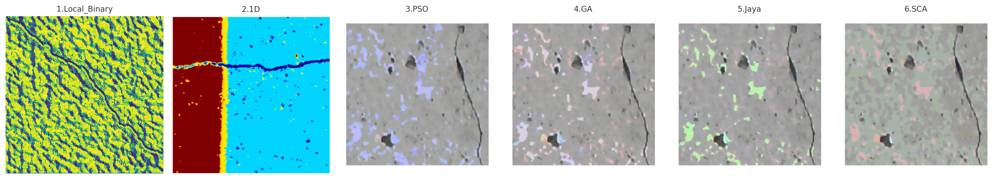

***Local Binary Method***

This step introduces the Local_Binary class that computes the Local Binary Pattern (LBP) for images in a given folder, saving the processed LBP images to an output folder. LBP is a simple but powerful texture descriptor used in image analysis.

In [ ]:
class Local_Binary:
    def __init__(self, image_folder_path, output_folder_path):
        """
        Initializes the Local_Binary class with the specified input and output folder paths.

        Parameters:
        - image_folder_path (str): Path to the folder containing input images.
        - output_folder_path (str): Path to the folder where processed images will be saved.

        If the output folder does not exist, it creates the folder.
        """
        self.image_folder_path = image_folder_path
        self.output_folder_path = output_folder_path
        if not os.path.exists(output_folder_path):
            os.makedirs(output_folder_path)

    def get_pixel(self, img, center, x, y):
        """
        Retrieves the binary value for LBP calculation based on the neighbor pixel's value.

        Parameters:
        - img (np.ndarray): The grayscale image as a 2D NumPy array.
        - center (int): The value of the center pixel.
        - x (int): The row index of the neighbor pixel.
        - y (int): The column index of the neighbor pixel.

        Returns:
        - int: Binary value (0 or 1) based on the comparison with the center pixel.
        """
        new_value = 0
        try:
            # If the neighbor pixel value is greater than or equal to the center pixel, set new_value to 1
            if img[x][y] >= center:
                new_value = 1
        except IndexError:
            # Ignore access errors for out-of-bounds neighbor pixels
            pass
        return new_value

    def lbp_calculated_pixel(self, img, x, y):
        """
        Calculates the LBP value for a pixel located at (x, y).

        Parameters:
        - img (np.ndarray): The grayscale image as a 2D NumPy array.
        - x (int): Row index of the pixel.
        - y (int): Column index of the pixel.

        Returns:
        - int: The calculated LBP value for the specified pixel.
        """
        center = img[x][y]  # Get the value of the center pixel
        val_ar = []  # Array to store binary values of the neighboring pixels

        # Get binary values from the 8 neighboring pixel positions
        val_ar.append(self.get_pixel(img, center, x-1, y-1))  # top-left
        val_ar.append(self.get_pixel(img, center, x-1, y))    # top
        val_ar.append(self.get_pixel(img, center, x-1, y + 1))  # top-right
        val_ar.append(self.get_pixel(img, center, x, y + 1))  # right
        val_ar.append(self.get_pixel(img, center, x + 1, y + 1))  # bottom-right
        val_ar.append(self.get_pixel(img, center, x + 1, y))  # bottom
        val_ar.append(self.get_pixel(img, center, x + 1, y - 1))  # bottom-left
        val_ar.append(self.get_pixel(img, center, x, y - 1))  # left

        # Convert binary values to decimal using their respective powers of 2
        power_val = [1, 2, 4, 8, 16, 32, 64, 128]
        return sum(val_ar[i] * power_val[i] for i in range(len(val_ar)))

    def process_images(self):
        """
        Processes the images in the specified input folder and saves the LBP images
        to the specified output folder.
        """
        for filename in os.listdir(self.image_folder_path):
            # Check if the file is a valid image type
            if filename.lower().endswith(('.jpg', '.png')):
                image_path = os.path.join(self.image_folder_path, filename)
                output_image_path = os.path.join(self.output_folder_path, filename)

                # Read the image using OpenCV
                image = cv2.imread(image_path)
                if image is None:
                    print(f"Failed to read {filename}. Skipping.")
                    continue  # Skip the file if it can't be read

                height, width, _ = image.shape  # Get the dimensions of the image
                img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
                img_lbp = np.zeros((height, width), np.uint8)  # Initialize an array for the LBP image

                # Apply LBP calculation to each pixel in the grayscale image
                for i in range(0, height):
                    for j in range(0, width):
                        img_lbp[i, j] = self.lbp_calculated_pixel(img_gray, i, j)

                # Save the LBP image to the output directory
                cv2.imwrite(output_image_path, img_lbp)
                print(f"Processed and saved: {filename}")

    def display_image(self, img, title):
        """
        Displays an image using matplotlib.

        Parameters:
        - img (np.ndarray): The image to be displayed.
        - title (str): The title for the displayed image.
        """
        plt.imshow(img, cmap="gray")  # Display the image in grayscale
        plt.title(title)  # Set the title for the image
        plt.axis('off')  # Hide the axes
        plt.show()  # Show the image plot

# Example usage:
# image_folder_path = "FileDirectory"  # Path to input images
# output_folder_path = "OutputDirectory"  # Path to save processed images
# lbp_processor = Local_Binary(image_folder_path, output_folder_path)  # Create an instance of the class
# lbp_processor.process_images()  # Process the images and save the results

***1D thresholding method***

A class to perform 1D Multi-Otsu thresholding on grayscale images with error handling and standardized input/output directory management in Google Colab.

This step implements the Thresholding_1D class to perform multi-level Otsu thresholding on grayscale images within a directory. The class processes all images, segments them into multiple classes, visualizes the results (original image, histogram with thresholds, segmented regions), and saves the outputs.



In [ ]:
class Thresholding_1D:
    def __init__(self, input_dir, output_dir, num_classes=5):
        """
        Initialize the Thresholding_1D class with directory paths and parameters.

        Args:
            input_dir (str): Directory containing input images.
            output_dir (str): Directory to save processed images and results.
            num_classes (int): Number of classes for Multi-Otsu segmentation (default: 5).
        """
        self.input_dir = input_dir
        self.output_dir = output_dir
        self.num_classes = num_classes

        # Ensure output directory exists
        os.makedirs(self.output_dir, exist_ok=True)

    def apply_multi_otsu_segmentation(self, image_path):
        """
        Apply Multi-Otsu thresholding to segment a grayscale version of an input image.

        Args:
            image_path (str): Path to the input image.

        Returns:
            tuple: (original_img, gray_img, thresholds, regions)
                - original_img (ndarray): Original BGR image.
                - gray_img (ndarray): Grayscale image.
                - thresholds (list): Computed Multi-Otsu thresholds.
                - regions (ndarray): Segmented regions.

        Raises:
            FileNotFoundError: If the image file does not exist.
            ValueError: If the image cannot be loaded or processed.
        """
        # Validate image path
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image not found at: {image_path}")

        # Read and validate image
        original_img = cv2.imread(image_path)
        if original_img is None:
            raise ValueError(f"Failed to load image: {image_path}")

        try:
            # Convert to grayscale
            gray_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)

            # Apply Multi-Otsu thresholding
            thresholds = threshold_multiotsu(gray_img, classes=self.num_classes)

            # Create segmented regions
            regions = np.digitize(gray_img, bins=thresholds)

            return original_img, gray_img, thresholds, regions

        except Exception as e:
            raise ValueError(f"Error processing image {image_path}: {str(e)}")

    def visualize_and_save_results(self, original_img, gray_img, thresholds, regions, filename):
        """
        Visualize and save the original image, histogram with thresholds, and segmented output.

        Args:
            original_img (ndarray): Original BGR image.
            gray_img (ndarray): Grayscale image.
            thresholds (list): Multi-Otsu thresholds.
            regions (ndarray): Segmented image regions.
            filename (str): Name for saving the output visualization.

        Returns:
            None

        Raises:
            ValueError: If visualization or saving fails.
        """
        try:
            # Create a figure with three subplots
            fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))

            # Display original image
            ax[0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
            ax[0].set_title("Original Image")
            ax[0].axis('off')

            # Display histogram with thresholds
            ax[1].hist(gray_img.ravel(), bins=255, range=(0, 255))
            for thresh in thresholds:
                ax[1].axvline(thresh, color='r', linestyle='--')
            ax[1].set_title("Histogram with Thresholds")
            ax[1].set_xlabel("Pixel Intensity")
            ax[1].set_ylabel("Frequency")

            # Display segmented regions
            ax[2].imshow(regions, cmap='jet')
            ax[2].set_title("Segmented Regions")
            ax[2].axis('off')

            # Adjust layout and save the figure
            plt.tight_layout()
            output_path = os.path.join(self.output_dir, f"result_{filename}")
            plt.savefig(output_path, dpi=300, bbox_inches='tight')
            plt.show()
            plt.close(fig)

            print(f"Results saved to: {output_path}")

        except Exception as e:
            raise ValueError(f"Error during visualization or saving: {str(e)}")

    def process_images(self):
        """
        Process all images in the input directory and save results to the output directory.

        Returns:
            None

        Raises:
            ValueError: If no valid images are found in the input directory.
        """
        # Supported image extensions
        valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')
        image_files = [f for f in os.listdir(self.input_dir) if f.lower().endswith(valid_extensions)]

        if not image_files:
            raise ValueError(f"No valid images found in input directory: {self.input_dir}")

        for image_file in image_files:
            try:
                print(f"Processing image: {image_file}")
                image_path = os.path.join(self.input_dir, image_file)

                # Apply segmentation
                original_img, gray_img, thresholds, regions = self.apply_multi_otsu_segmentation(image_path)

                # Visualize and save results
                self.visualize_and_save_results(original_img, gray_img, thresholds, regions, image_file)

            except Exception as e:
                print(f"Failed to process {image_file}: {str(e)}")
                continue

def main():
    """
    Main function to set up and run the Multi-Otsu thresholding process in Google Colab.
    """
    # Define input and output directories
    input_dir = '/content/drive/MyDrive/Thesis_data/Image_set2'
    output_dir = '/content/drive/MyDrive/Thesis_data/Output'

    try:
        # Initialize thresholding class
        thresholder = Thresholding_1D(input_dir=input_dir, output_dir=output_dir, num_classes=5) # Number of desire classes

        # Process all images
        thresholder.process_images()

    except Exception as e:
        print(f"Error in main execution: {str(e)}")

if __name__ == "__main__":
    main()

Error in main execution: name 'os' is not defined


***3D multiLevel Thresholding***

Plots the histogram of the input image, visualizes the thresholds and the result of multi-otsu segmentation.

Parameters:
- img (np.ndarray): The input image.

- regions (np.ndarray): The segmented regions after multi-otsu thresholding.

- thresholds (list): The thresholds obtained from multi-otsu method.

- imgname (str): The name of the image to save the plot.

- funname (str): The name of the function or method used to segment.

In [ ]:
def multiotsu_plot(img, regions, thresholds, imgname, funname):

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 3.5))

    # Plot histogram of the image
    ax[0].hist(img.ravel(), bins=255)
    ax[0].set_title('Histogram')
    for t in thresholds:
        ax[0].axvline(t, color='r')  # Plot thresholds as red lines

    # Plot the multi-otsu segmented result
    ax[1].imshow(regions)
    ax[1].set_title('Multi-otsu Result')
    ax[1].axis('off')

    plt.subplots_adjust()
    plt.savefig(f"{imgname}_newsegmented_Class_{len(thresholds)+1}_Optfn_{funname}_Avgplot.png")
    plt.close()

def fun_multiotsu(t, normProba, spaceSize):
    """
    Computes the fitness value for multi-otsu thresholding.

    Parameters:
    - t (list): The threshold values used for segmentation.
    - normProba (np.ndarray): The normalized probability values.
    - spaceSize (int): The size of the probability space.

    Returns:
    - fitness (float): The fitness value based on within-class variance.
    """
    ip = normProba * np.linspace(0, spaceSize-1, spaceSize)

    # Ensure thresholds are sorted
    t = sorted(t) if len(t) > 1 else t

    invalidThresh = 0
    omega = []    # Class occurrence probability
    mu = []       # Class mean probability
    sigmasq = []  # Class variance

    # Compute class probabilities, means, and variances
    threshStart = 0
    for thr in range(len(t) + 1):
        threshEnd = t[thr] if thr < len(t) else spaceSize

        omega.append(np.sum(normProba[int(threshStart):int(threshEnd)]))

        if omega[thr] == 0:
            mu.append(0)
            invalidThresh = 1
        else:
            mu.append(np.sum(ip[int(threshStart):int(threshEnd)]) / omega[thr])

        if thr < len(t):
            threshStart = t[thr]

    # Compute class variances (sigma^2)
    lin = np.linspace(0, spaceSize-1, spaceSize)
    for thr in range(len(t) + 1):
        threshEnd = t[thr] if thr < len(t) else spaceSize

        if omega[thr] == 0:
            sigmasq.append(0)
        else:
            pcv = (lin[int(threshStart):int(threshEnd)] - mu[thr])**2
            p_mul = normProba[int(threshStart):int(threshEnd)] / omega[thr]
            sigmasq.append(np.sum(np.multiply(pcv, p_mul)))

        if thr < len(t):
            threshStart = t[thr]

    # Calculate fitness using within-class variance
    if invalidThresh == 1:
        fitness = float("inf")
    else:
        fitness = np.sum(np.multiply(omega, sigmasq))

    return fitness

***Particle Swarm Optimization (PSO)***

This step implements a PSO-based algorithm to find optimal multi-level thresholds for image segmentation. It includes:

*   A PSOOptimizer class encapsulating the PSO mechanics

*   A Solution class to hold optimization results

*   An objective function tailored for multi-level Otsu thresholding

*   Image processing logic applying PSO on each RGB channel individually

*   Evaluation metrics including MSE, PSNR, and SSIM

*   Iterative threshold adjustment until satisfactory segmentation quality

*   Saving segmented images and exporting results to Excel


This method leverages asynchronous processing and detailed logging for robust optimization.

In [ ]:
# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

class Solution:
    """Class to store PSO optimization results."""
    def __init__(self):
        self.best = 0
        self.best_individual = []
        self.convergence = []
        self.optimizer = ""
        self.objfname = ""
        self.start_time = 0
        self.end_time = 0
        self.execution_time = 0
        self.lb = 0
        self.ub = 0
        self.dim = 0
        self.popnum = 0
        self.error = 0
        self.funeval = 0
        self.iterations = 0
        self.error_list = []

class PSOOptimizer:
    """Particle Swarm Optimization for multilevel image thresholding."""

    def __init__(self, iterations, dim, popsize, c1, vmax, lim, desired, objfun_name):
        """Initialize PSO parameters."""
        self.iterations = iterations
        self.dim = dim
        self.popsize = popsize
        self.c1 = c1
        self.vmax = vmax
        self.lim = lim
        self.desired = desired
        self.objfun_name = objfun_name
        self.vmin = -vmax
        self.vellims = [self.vmin, self.vmax]
        self.wmax = 0.8
        self.wmin = 0.1
        self.max_fes = 10000 * dim
        self.validate_parameters()

    def validate_parameters(self):
        """Validate PSO parameters."""
        if self.iterations <= 0:
            raise ValueError("Iterations must be positive")
        if self.dim <= 0:
            raise ValueError("Dimension must be positive")
        if self.popsize <= 0:
            raise ValueError("Population size must be positive")
        if self.c1 <= 0 or self.c1 >= 4:
            raise ValueError("c1 must be between 0 and 4")
        if self.vmax <= 0:
            raise ValueError("vmax must be positive")
        if self.lim[0] >= self.lim[1]:
            raise ValueError("Lower bound must be less than upper bound")

    def initialize_population(self):
        """Initialize population and velocities."""
        try:
            pop = self.lim[0] + (self.lim[1] - self.lim[0]) * np.random.rand(self.popsize, self.dim)
            pop = pop.astype(int)  # Discrete positions
            vel = self.vellims[0] + (self.vellims[1] - self.vellims[0]) * np.random.rand(self.popsize, self.dim)
            return pop, vel
        except Exception as e:
            logger.error(f"Error initializing population: {e}")
            raise

    def compute_fitness(self, pop, fun):
        """Compute fitness for all particles."""
        try:
            return [fun(np.array(pop[i])) for i in range(len(pop))]
        except Exception as e:
            logger.error(f"Error computing fitness: {e}")
            raise

    def update_global_best(self, fits, pos, gbest_score, xgbest):
        """Update global best position and score."""
        try:
            idx = fits.index(min(fits))
            if gbest_score > fits[idx]:
                gbest_score = fits[idx]
                xgbest = pos[idx, :].copy()
            return gbest_score, xgbest
        except Exception as e:
            logger.error(f"Error updating global best: {e}")
            raise

    def update_personal_best(self, fits, pos, pbest_score, xpbest):
        """Update personal best positions and scores."""
        try:
            for i in range(pos.shape[0]):
                if pbest_score[i] > fits[i]:
                    pbest_score[i] = fits[i]
                    xpbest[i, :] = pos[i, :].copy()
            return pbest_score, xpbest
        except Exception as e:
            logger.error(f"Error updating personal best: {e}")
            raise

    def update_velocity_position(self, w, vel, pbest_pos, pos, gbest_pos):
        """Update particle velocities and positions."""
        try:
            c2 = 4 - self.c1
            const1 = self.c1 * np.random.rand(pos.shape[0], 1)
            const2 = c2 * np.random.rand(pos.shape[0], 1)
            vel = w * vel + const1 * (pbest_pos - pos) + const2 * (gbest_pos - pos)
            vel = np.clip(vel, self.vmin, self.vmax)
            pos = pos + vel
            pos = np.clip(pos, self.lim[0], self.lim[1]).astype(int)
            return vel, pos
        except Exception as e:
            logger.error(f"Error updating velocity/position: {e}")
            raise

    async def optimize(self, fun):
        """Run PSO optimization."""
        try:
            s = Solution()
            s.dim = self.dim
            s.popnum = self.popsize
            s.objfname = self.objfun_name

            xpbest = np.zeros((self.popsize, self.dim))
            pbest_score = np.full(self.popsize, float("inf"))
            xgbest = np.zeros(self.dim)
            gbest_score = float("inf")
            pos, velocity = self.initialize_population()
            funeval = 0
            convergence = []

            logger.info("PSO optimization started")
            s.start_time = time.time()

            for l in range(self.iterations):
                fits = self.compute_fitness(pos, fun)
                funeval += len(pos)
                pbest_score, xpbest = self.update_personal_best(fits, pos, pbest_score, xpbest)
                gbest_score, xgbest = self.update_global_best(fits, pos, gbest_score, xgbest)
                w = self.wmax - (self.wmax - self.wmin) * l / self.iterations
                velocity, pos = self.update_velocity_position(w, velocity, xpbest, pos, xgbest)
                convergence.append(gbest_score)
                error = abs(self.desired - gbest_score)
                if l % 10 == 0:
                    logger.info(f"Iteration {l+1}, Best Fitness: {gbest_score}")

                if platform.system() == "Emscripten":
                    await asyncio.sleep(1.0 / 60)  # Control frame rate for browser

            s.best = gbest_score
            s.best_individual = xgbest
            s.end_time = time.time()
            s.execution_time = s.end_time - s.start_time
            s.convergence = convergence
            s.optimizer = "PSO"
            s.funeval = funeval
            s.error = error
            return s
        except Exception as e:
            logger.error(f"Error in PSO optimization: {e}")
            raise

def multi_otsu_objective(thresholds, histogram):
    """Multi-level Otsu objective function."""
    try:
        thresholds = np.sort(thresholds).astype(int)
        total_pixels = np.sum(histogram)
        norm_proba = histogram / total_pixels
        variance = 0
        start = 0
        for t in thresholds:
            end = t
            region = norm_proba[start:end]
            if len(region) > 0:
                weight = np.sum(region)
                mean = np.sum(np.arange(start, end) * norm_proba[start:end]) / weight if weight > 0 else 0
                variance += weight * mean ** 2
            start = end
        region = norm_proba[start:]
        if len(region) > 0:
            weight = np.sum(region)
            mean = np.sum(np.arange(start, len(histogram)) * norm_proba[start:]) / weight if weight > 0 else 0
            variance += weight * mean ** 2
        return -variance  # Minimize negative variance
    except Exception as e:
        logger.error(f"Error in multi-Otsu objective: {e}")
        return float("inf")

def process_image(image_path, output_path, thresh, pop, itr, c1, vmax, desired, objfname, runs):
    """Process a single image with PSO-based thresholding."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Failed to load image: {image_path}")

        max_value = np.max(image, axis=(0, 1))
        width, height = image.shape[:2]
        pso_otsu_image = np.zeros((width, height, 3))
        threshold_global = np.zeros((3, thresh))

        results = []
        for i in range(3):  # Process R, G, B channels
            img = img_as_ubyte(image[:, :, i])
            histogram, _ = np.histogram(img, bins=256, range=(0, 255))
            lim = [1, len(histogram) - 1]

            def fun_multiotsu(thresholds):
                return multi_otsu_objective(thresholds, histogram)

            pso = PSOOptimizer(itr, thresh, pop, c1, vmax, lim, desired, objfname)
            if platform.system() == "Emscripten":
                sol = asyncio.run(pso.optimize(fun_multiotsu))
            else:
                sol = asyncio.run(pso.optimize(fun_multiotsu))

            thresholds = np.sort(sol.best_individual).astype(int)
            threshold_global[i, :] = thresholds
            regions = np.digitize(img, bins=thresholds)
            pso_otsu_image[:, :, i] = img_as_ubyte(regions)
            results.append({
                'thresholds': thresholds,
                'fitness': sol.best,
                'runtime': sol.execution_time
            })

        # Apply thresholding
        for i in range(3):
            for j in range(width):
                for k in range(height):
                    val = pso_otsu_image[j, k, i]
                    if val < thresh:
                        pso_otsu_image[j, k, i] = threshold_global[i, val]
                    else:
                        pso_otsu_image[j, k, i] = max_value[i]

        # Compute metrics
        gray_output = np.mean(pso_otsu_image, axis=2)
        gray_global = np.mean(image, axis=2)
        mse = np.mean((gray_output - gray_global) ** 2)
        psnr = 10 * math.log10((255 ** 2) / mse) if mse > 0 else float("inf")
        ssim_value = ssim(gray_global, gray_output, data_range=255)

        # Save output image
        data = pso_otsu_image.astype(np.uint8)
        cv2.imwrite(output_path, data)

        # Count unique colors
        original_colors = len(set(Image.open(image_path).getdata()))
        output_colors = len(set(Image.open(output_path).getdata()))

        return {
            'mse': mse,
            'psnr': psnr,
            'ssim': ssim_value,
            'original_colors': original_colors,
            'output_colors': output_colors,
            'thresholds': thresh + 1
        }
    except Exception as e:
        logger.error(f"Error processing image {image_path}: {e}")
        return None

def main():
    """Main function to process images in a directory."""
    try:
        image_folder_path = "InputDirectory"
        output_folder_path = "OutputDirectory"
        if not os.path.exists(output_folder_path):
            os.makedirs(output_folder_path)

        excel_data = []
        for filename in os.listdir(image_folder_path):
            if filename.endswith(('.jpg', '.png')):
                image_path = os.path.join(image_folder_path, filename)
                output_image_path = os.path.join(output_folder_path, filename)

                thresh = 2
                pop = 100
                itr = 50
                c1 = 2.5
                vmax = 16
                desired = 0
                objfname = 'Multi-threshold OTSU'
                runs = 1

                psnr = 5
                ssim_value = 0.1
                while ssim_value < 0.75 and psnr < 28:
                    result = process_image(image_path, output_image_path, thresh, pop, itr, c1, vmax, desired, objfname, runs)
                    if result is None:
                        break
                    psnr = result['psnr']
                    ssim_value = result['ssim']
                    if psnr < 28 or ssim_value < 0.75:
                        thresh += 1
                        if thresh > 255:
                            logger.warning(f"Max threshold reached for {filename}")
                            break

                if result:
                    excel_data.append([
                        result['thresholds'],
                        result['mse'],
                        result['psnr'],
                        result['ssim'],
                        result['original_colors'],
                        result['output_colors']
                    ])
                    logger.info(f"Processed {filename}: PSNR={result['psnr']:.2f}, SSIM={result['ssim']:.4f}")

        # Export to Excel
        if excel_data:
            df = pd.DataFrame(excel_data, columns=['Thresholds', 'MSE', 'PSNR', 'SSIM', 'Original Colors', 'Output Colors'])
            df.to_excel('results.xlsx', index=False)
            logger.info("Results exported to results.xlsx")
    except Exception as e:
        logger.error(f"Error in main execution: {e}")

if __name__ == "__main__":
    if platform.system() == "Emscripten":
        asyncio.ensure_future(main())
    else:
        main()

***Genetic Algorithm (GA)***

This step implements a GA-based optimizer for finding multi-level threshold values in images using Otsu’s method.
Features include:

*   Population initialization, crossover, mutation, and elitism

*   Fitness evaluation based on multi-level Otsu variance criterion

*   Asynchronous optimization with iteration logging

*   Separate processing of RGB channels and combination of results

*   Quality metrics computation: MSE, PSNR, SSIM

*   Visualization of segmentation histograms and results saved as images

*   Batch processing of images with adaptive threshold count

*   Exporting results to Excel for analysis


In [ ]:


# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

class Solution:
    """Class to store GA optimization results."""
    def __init__(self):
        self.best = 0
        self.best_individual = []
        self.convergence = []
        self.optimizer = ""
        self.objf_name = ""
        self.start_time = 0
        self.end_time = 0
        self.execution_time = 0
        self.lb = 0
        self.ub = 0
        self.dim = 0
        self.pop = 0
        self.funeval = 0
        self.max_iter = 0

class GAOptimizer:
    """Genetic Algorithm for multilevel image thresholding."""

    def __init__(self, function, dimension, variable_boundaries, algorithm_parameters, objfun_name):
        """Initialize GA parameters."""
        self.f = function
        self.dim = int(dimension)
        self.var_bound = variable_boundaries
        self.param = algorithm_parameters
        self.objfun_name = objfun_name
        self.funtimeout = 10.0
        self.pop_s = int(self.param['population_size'])
        self.par_s = int(self.param['parents_portion'] * self.pop_s)
        self.prob_mut = self.param['mutation_probability']
        self.prob_cross = self.param['crossover_probability']
        self.num_elit = max(1, int(self.pop_s * self.param['elit_ratio']))
        self.c_type = self.param['crossover_type']
        self.iterate = self.param['max_num_iteration'] or 400
        self.mniwi = self.param['max_iteration_without_improv'] or self.iterate + 1
        self.validate_parameters()

    def validate_parameters(self):
        """Validate GA parameters."""
        try:
            if self.dim <= 0:
                raise ValueError("Dimension must be positive")
            if self.pop_s <= 0:
                raise ValueError("Population size must be positive")
            if not isinstance(self.var_bound, np.ndarray):
                raise ValueError("Variable boundaries must be a numpy array")
            if len(self.var_bound) != self.dim or any(len(b) != 2 for b in self.var_bound):
                raise ValueError("Variable boundaries must match dimension and have [lower, upper] format")
            if any(b[0] > b[1] for b in self.var_bound):
                raise ValueError("Lower boundaries must be less than upper boundaries")
            if not callable(self.f):
                raise ValueError("Objective function must be callable")
            if self.par_s % 2 != 0:
                self.par_s += 1  # Ensure even number of parents
            if self.par_s < self.num_elit:
                raise ValueError("Number of parents must be greater than number of elites")
            if not (0 <= self.prob_mut <= 1):
                raise ValueError("Mutation probability must be in [0, 1]")
            if not (0 <= self.prob_cross <= 1):
                raise ValueError("Crossover probability must be in [0, 1]")
            if not (0 <= self.param['parents_portion'] <= 1):
                raise ValueError("Parents portion must be in [0, 1]")
            if not (0 <= self.param['elit_ratio'] <= 1):
                raise ValueError("Elite ratio must be in [0, 1]")
            if self.c_type not in ['uniform', 'one_point', 'two_point']:
                raise ValueError("Crossover type must be 'uniform', 'one_point', or 'two_point'")
        except Exception as e:
            logger.error(f"Parameter validation error: {e}")
            raise

    def initialize_population(self):
        """Initialize population with integer variables."""
        try:
            pop = np.zeros((self.pop_s, self.dim + 1))
            for p in range(self.pop_s):
                var = np.zeros(self.dim)
                for i in range(self.dim):
                    var[i] = np.random.randint(self.var_bound[i][0], self.var_bound[i][1] + 1)
                pop[p, :self.dim] = var
                pop[p, self.dim] = self.sim(var)
            return pop
        except Exception as e:
            logger.error(f"Error initializing population: {e}")
            raise

    def sim(self, X):
        """Simulate function evaluation with timeout."""
        try:
            self.temp = X.copy()
            obj = func_timeout(self.funtimeout, lambda: self.f(self.temp))
            if obj is None:
                raise ValueError("Function did not return a valid output")
            return obj
        except FunctionTimedOut:
            logger.error("Function evaluation timed out")
            return float("inf")
        except Exception as e:
            logger.error(f"Error in function simulation: {e}")
            return float("inf")

    def cross(self, x, y, c_type):
        """Perform crossover between two parents."""
        try:
            ofs1, ofs2 = x.copy(), y.copy()
            if c_type == 'one_point':
                ran = np.random.randint(0, self.dim)
                ofs1[:ran], ofs2[:ran] = ofs2[:ran], ofs1[:ran]
            elif c_type == 'two_point':
                ran1 = np.random.randint(0, self.dim)
                ran2 = np.random.randint(ran1, self.dim)
                ofs1[ran1:ran2], ofs2[ran1:ran2] = ofs2[ran1:ran2], ofs1[ran1:ran2]
            elif c_type == 'uniform':
                for i in range(self.dim):
                    if np.random.random() < 0.5:
                        ofs1[i], ofs2[i] = ofs2[i], ofs1[i]
            return np.array([ofs1, ofs2])
        except Exception as e:
            logger.error(f"Error in crossover: {e}")
            raise

    def mut(self, x):
        """Mutate an individual."""
        try:
            for i in range(self.dim):
                if np.random.random() < self.prob_mut:
                    x[i] = np.random.randint(self.var_bound[i][0], self.var_bound[i][1] + 1)
            return x
        except Exception as e:
            logger.error(f"Error in mutation: {e}")
            raise

    def mutmidle(self, x, p1, p2):
        """Mutate an individual within parent bounds."""
        try:
            for i in range(self.dim):
                if np.random.random() < self.prob_mut:
                    if p1[i] < p2[i]:
                        x[i] = np.random.randint(p1[i], p2[i] + 1)
                    elif p1[i] > p2[i]:
                        x[i] = np.random.randint(p2[i], p1[i] + 1)
                    else:
                        x[i] = np.random.randint(self.var_bound[i][0], self.var_bound[i][1] + 1)
            return x
        except Exception as e:
            logger.error(f"Error in middle mutation: {e}")
            raise

    async def optimize(self):
        """Run GA optimization."""
        try:
            s = Solution()
            s.dim = self.dim
            s.pop = self.pop_s
            s.objf_name = self.objfun_name
            s.max_iter = self.iterate

            pop = self.initialize_population()
            best_function = float("inf")
            best_variable = pop[0, :self.dim].copy()
            report = []
            funeval = self.pop_s
            counter = 0

            logger.info("GA optimization started")
            s.start_time = time.time()

            for t in range(1, self.iterate + 1):
                pop = pop[pop[:, self.dim].argsort()]
                if pop[0, self.dim] < best_function:
                    counter = 0
                    best_function = pop[0, self.dim]
                    best_variable = pop[0, :self.dim].copy()
                else:
                    counter += 1

                report.append(pop[0, self.dim])
                normobj = max(np.amax(pop[:, self.dim]) - pop[:, self.dim] + 1, 1)
                prob = normobj / np.sum(normobj)
                cumprob = np.cumsum(prob)

                par = np.zeros((self.par_s, self.dim + 1))
                for k in range(self.num_elit):
                    par[k] = pop[k].copy()
                for k in range(self.num_elit, self.par_s):
                    index = np.searchsorted(cumprob, np.random.random())
                    par[k] = pop[index].copy()

                ef_par_list = np.random.random(self.par_s) <= self.prob_cross
                par_count = np.sum(ef_par_list)
                if par_count == 0:
                    ef_par_list[np.random.randint(0, self.par_s)] = True
                    par_count = 1
                ef_par = par[ef_par_list].copy()

                new_pop = np.zeros((self.pop_s, self.dim + 1))
                for k in range(self.par_s):
                    new_pop[k] = par[k].copy()

                for k in range(self.par_s, self.pop_s, 2):
                    r1, r2 = np.random.randint(0, par_count, 2)
                    pvar1, pvar2 = ef_par[r1, :self.dim].copy(), ef_par[r2, :self.dim].copy()
                    ch = self.cross(pvar1, pvar2, self.c_type)
                    ch1, ch2 = ch[0].copy(), ch[1].copy()
                    ch1 = self.mut(ch1)
                    ch2 = self.mutmidle(ch2, pvar1, pvar2)
                    new_pop[k, :self.dim] = ch1
                    new_pop[k, self.dim] = self.sim(ch1)
                    funeval += 1
                    if k + 1 < self.pop_s:
                        new_pop[k + 1, :self.dim] = ch2
                        new_pop[k + 1, self.dim] = self.sim(ch2)
                        funeval += 1

                pop = new_pop
                if counter > self.mniwi and pop[pop[:, self.dim].argsort()][0, self.dim] >= best_function:
                    break

                if t % 10 == 0:
                    logger.info(f"Iteration {t}, Best Fitness: {best_function}")

                if platform.system() == "Emscripten":
                    await asyncio.sleep(1.0 / 60)  # Control frame rate for browser

            pop = pop[pop[:, self.dim].argsort()]
            if pop[0, self.dim] < best_function:
                best_function = pop[0, self.dim]
                best_variable = pop[0, :self.dim].copy()
            report.append(best_function)

            s.best = best_function
            s.best_individual = best_variable
            s.end_time = time.time()
            s.execution_time = s.end_time - s.start_time
            s.convergence = report
            s.optimizer = "GA"
            s.funeval = funeval
            return s
        except Exception as e:
            logger.error(f"Error in GA optimization: {e}")
            raise

def multiotsu_plot(img, regions, thresholds, imgname, funname):
    """Plots the histogram and multi-otsu segmentation result."""
    try:
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 3.5))
        ax[0].hist(img.ravel(), bins=255)
        ax[0].set_title('Histogram')
        for t in thresholds:
            ax[0].axvline(t, color='r')
        ax[1].imshow(regions)
        ax[1].set_title('Multi-otsu Result')
        ax[1].axis('off')
        plt.subplots_adjust()
        plt.savefig(f"{imgname}_newsegmented_Class_{len(thresholds)+1}_Optfn_{funname}_Avgplot.png")
        plt.close()
    except Exception as e:
        logger.error(f"Error in multiotsu_plot: {e}")

def fun_multiotsu(t, normProba, spaceSize):
    """Computes the fitness value for multi-otsu thresholding."""
    try:
        ip = normProba * np.linspace(0, spaceSize-1, spaceSize)
        t = sorted(t) if len(t) > 1 else t
        invalidThresh = 0
        omega, mu, sigmasq = [], [], []
        threshStart = 0
        for thr in range(len(t) + 1):
            threshEnd = t[thr] if thr < len(t) else spaceSize
            omega.append(np.sum(normProba[int(threshStart):int(threshEnd)]))
            if omega[thr] == 0:
                mu.append(0)
                invalidThresh = 1
            else:
                mu.append(np.sum(ip[int(threshStart):int(threshEnd)]) / omega[thr])
            if thr < len(t):
                threshStart = t[thr]
        lin = np.linspace(0, spaceSize-1, spaceSize)
        for thr in range(len(t) + 1):
            threshEnd = t[thr] if thr < len(t) else spaceSize
            if omega[thr] == 0:
                sigmasq.append(0)
            else:
                pcv = (lin[int(threshStart):int(threshEnd)] - mu[thr])**2
                p_mul = normProba[int(threshStart):int(threshEnd)] / omega[thr]
                sigmasq.append(np.sum(np.multiply(pcv, p_mul)))
            if thr < len(t):
                threshStart = t[thr]
        if invalidThresh == 1:
            fitness = float("inf")
        else:
            fitness = np.sum(np.multiply(omega, sigmasq))
        return fitness
    except Exception as e:
        logger.error(f"Error in fun_multiotsu: {e}")
        return float("inf")

def process_image(image_path, output_path, dim, algorithm_parameters, objfname, runs):
    """Process a single image with GA-based thresholding."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Failed to load image: {image_path}")

        max_value = np.max(image, axis=(0, 1))
        width, height = image.shape[:2]
        ga_otsu_image = np.zeros((width, height, 3))
        threshold_global = np.zeros((3, dim))

        results = []
        for i in range(3):  # Process R, G, B channels
            img = img_as_ubyte(image[:, :, i])
            histogram, _ = np.histogram(img, bins=256, range=(0, 255))
            total_pixels = np.sum(histogram)
            norm_proba = histogram / total_pixels
            space_size = len(histogram)
            varbound = np.array([[0, 255]] * dim)

            def objective_function(thresholds):
                return fun_multiotsu(thresholds, norm_proba, space_size)

            ga = GAOptimizer(objective_function, dim, varbound, algorithm_parameters, objfname)
            sol = asyncio.run(ga.optimize())

            thresholds = np.sort(sol.best_individual).astype(int)
            threshold_global[i, :] = thresholds
            regions = np.digitize(img, bins=thresholds)
            ga_otsu_image[:, :, i] = img_as_ubyte(regions)

            # Plot segmentation results
            multiotsu_plot(img, regions, thresholds, os.path.splitext(os.path.basename(image_path))[0] + f"_channel_{i}", "GA")

            results.append({
                'thresholds': thresholds,
                'fitness': sol.best,
                'runtime': sol.execution_time
            })

        # Apply thresholding
        for i in range(3):
            for j in range(width):
                for k in range(height):
                    val = ga_otsu_image[j, k, i]
                    if val < dim:
                        ga_otsu_image[j, k, i] = threshold_global[i, val]
                    else:
                        ga_otsu_image[j, k, i] = max_value[i]

        # Compute metrics
        gray_output = np.mean(ga_otsu_image, axis=2)
        gray_global = np.mean(image, axis=2)
        mse = np.mean((gray_output - gray_global) ** 2)
        psnr = 10 * math.log10((255 ** 2) / mse) if mse > 0 else float("inf")
        ssim_value = ssim(gray_global, gray_output, data_range=255)

        # Save output image
        data = ga_otsu_image.astype(np.uint8)
        cv2.imwrite(output_path, data)

        # Count unique colors
        original_colors = len(set(Image.open(image_path).getdata()))
        output_colors = len(set(Image.open(output_path).getdata()))

        return {
            'mse': mse,
            'psnr': psnr,
            'ssim': ssim_value,
            'original_colors': original_colors,
            'output_colors': output_colors,
            'thresholds': dim + 1
        }
    except Exception as e:
        logger.error(f"Error processing image {image_path}: {e}")
        return None

def main():
    """Main function to process images in a directory."""
    try:
        image_folder_path = "InputDirectory"
        output_folder_path = "OutputDirectory"
        if not os.path.exists(output_folder_path):
            os.makedirs(output_folder_path)

        algorithm_param = {
            'max_num_iteration': 400,
            'population_size': 40,
            'mutation_probability': 0.1,
            'elit_ratio': 0.01,
            'crossover_probability': 0.5,
            'parents_portion': 0.3,
            'crossover_type': 'uniform',
            'max_iteration_without_improv': None
        }

        excel_data = []
        for filename in os.listdir(image_folder_path):
            if filename.endswith(('.jpg', '.png')):
                image_path = os.path.join(image_folder_path, filename)
                output_image_path = os.path.join(output_folder_path, filename)

                dim = 2  # Start with 2 thresholds
                objfname = 'GA by Otsu'
                runs = 1

                psnr = 5
                ssim_value = 0.1
                while ssim_value < 0.75 and psnr < 28:
                    result = process_image(image_path, output_image_path, dim, algorithm_param, objfname, runs)
                    if result is None:
                        break
                    psnr = result['psnr']
                    ssim_value = result['ssim']
                    if psnr < 28 or ssim_value < 0.75:
                        dim += 1
                        if dim > 255:
                            logger.warning(f"Max threshold reached for {filename}")
                            break

                if result:
                    excel_data.append([
                        result['thresholds'],
                        result['mse'],
                        result['psnr'],
                        result['ssim'],
                        result['original_colors'],
                        result['output_colors']
                    ])
                    logger.info(f"Processed {filename}: PSNR={result['psnr']:.2f}, SSIM={result['ssim']:.4f}")

        # Export to Excel
        if excel_data:
            df = pd.DataFrame(excel_data, columns=['Thresholds', 'MSE', 'PSNR', 'SSIM', 'Original Colors', 'Output Colors'])
            df.to_excel('results.xlsx', index=False)
            logger.info("Results exported to results.xlsx")
    except Exception as e:
        logger.error(f"Error in main execution: {e}")

if __name__ == "__main__":
    if platform.system() == "Emscripten":
        asyncio.ensure_future(main())
    else:
        main()

***Sine Cosine Algorithm (SCA)***


This step implements the Sine Cosine Algorithm (SCA) to optimize multi-level threshold values for image segmentation using Otsu’s method.

Key features include:

*   Population initialization and boundary checking

*   Sine and cosine based position updates

*   Adaptive search with fitness evaluation per candidate solution

*   Channel-wise image processing for RGB images

*   Visualization of segmentation results and histograms

*   Quality metrics calculation: MSE, PSNR, SSIM

*   Batch processing and results export to Excel

*   Asynchronous execution and detailed logging

In [ ]:

# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

class Solution:
    """Class to store SCA optimization results."""
    def __init__(self):
        self.best = 0
        self.best_individual = []
        self.convergence = []
        self.optimizer = ""
        self.objf_name = ""
        self.start_time = 0
        self.end_time = 0
        self.execution_time = 0
        self.lb = 0
        self.ub = 0
        self.dim = 0
        self.pop = 0
        self.funeval = 0
        self.max_iter = 0

class SCAOptimizer:
    """Sine Cosine Algorithm for multilevel image thresholding."""

    def __init__(self, max_iter, pop, lb, ub, objfun_name):
        """Initialize SCA parameters."""
        self.max_iter = max_iter
        self.pop = pop
        self.lb = lb
        self.ub = ub
        self.objfun_name = objfun_name
        self.dim = len(lb) if isinstance(lb, list) else 1
        self.a = 2  # Pre-defined parameter
        self.validate_parameters()

    def validate_parameters(self):
        """Validate SCA parameters."""
        try:
            if self.max_iter <= 0:
                raise ValueError("Maximum iterations must be positive")
            if self.pop <= 0:
                raise ValueError("Population size must be positive")
            if not isinstance(self.lb, (list, int, float)) or not isinstance(self.ub, (list, int, float)):
                raise ValueError("Bounds must be numeric or lists of numerics")
            if isinstance(self.lb, list) and isinstance(self.ub, list):
                if len(self.lb) != len(self.ub):
                    raise ValueError("Lower and upper bounds lists must have the same length")
                if any(l >= u for l, u in zip(self.lb, self.ub)):
                    raise ValueError("Lower bounds must be less than upper bounds")
            elif isinstance(self.lb, (int, float)) and isinstance(self.ub, (int, float)):
                if self.lb >= self.ub:
                    raise ValueError("Lower bound must be less than upper bound")
        except Exception as e:
            logger.error(f"Parameter validation error: {e}")
            raise

    def initialize_population(self):
        """Initialize population positions."""
        try:
            lb = [self.lb] * self.dim if not isinstance(self.lb, list) else self.lb
            ub = [self.ub] * self.dim if not isinstance(self.ub, list) else self.ub
            pos = [[random.uniform(lb[j], ub[j]) for j in range(self.dim)] for _ in range(self.pop)]
            return pos
        except Exception as e:
            logger.error(f"Error initializing population: {e}")
            raise

    def boundary_check(self, value):
        """Ensure position values are within bounds."""
        try:
            lb = [self.lb] * self.dim if not isinstance(self.lb, list) else self.lb
            ub = [self.ub] * self.dim if not isinstance(self.ub, list) else self.ub
            for i in range(len(value)):
                value[i] = max(value[i], lb[i])
                value[i] = min(value[i], ub[i])
            return value
        except Exception as e:
            logger.error(f"Error in boundary check: {e}")
            raise

    def compute_fitness(self, position, fun):
        """Compute fitness for a single position."""
        try:
            return fun(np.array(position))
        except Exception as e:
            logger.error(f"Error computing fitness: {e}")
            raise

    async def optimize(self, fun):
        """Run SCA optimization."""
        try:
            s = Solution()
            s.dim = self.dim
            s.pop = self.pop
            s.objf_name = self.objfun_name
            s.max_iter = self.max_iter

            # Initialize population
            pos = self.initialize_population()
            score = [self.compute_fitness(p, fun) for p in pos]
            funeval = len(pos)
            gbest = min(score)
            gbest_pos = pos[score.index(gbest)].copy()
            convergence = []

            logger.info("SCA optimization started")
            s.start_time = time.time()

            # Main loop
            for t in range(self.max_iter):
                r1 = self.a - (t + 1) * self.a / self.max_iter
                for i in range(self.pop):
                    for j in range(self.dim):
                        r2 = random.uniform(0, 2 * math.pi)
                        r3 = random.uniform(0, 2)
                        r4 = random.random()
                        if r4 < 0.5:
                            pos[i][j] += r1 * math.sin(r2) * abs(r3 * gbest_pos[j] - pos[i][j])
                        else:
                            pos[i][j] += r1 * math.cos(r2) * abs(r3 * gbest_pos[j] - pos[i][j])
                    pos[i] = self.boundary_check(pos[i])
                    score[i] = self.compute_fitness(pos[i], fun)
                    funeval += 1
                for i in range(self.pop):
                    if score[i] < gbest:
                        gbest = score[i]
                        gbest_pos = pos[i].copy()
                convergence.append(gbest)
                if t % 10 == 0:
                    logger.info(f"Iteration {t+1}, Best Fitness: {gbest}")

                if platform.system() == "Emscripten":
                    await asyncio.sleep(1.0 / 60)  # Control frame rate for browser

            s.best = gbest
            s.best_individual = gbest_pos
            s.end_time = time.time()
            s.execution_time = s.end_time - s.start_time
            s.convergence = convergence
            s.optimizer = "SCA"
            s.funeval = funeval
            return s
        except Exception as e:
            logger.error(f"Error in SCA optimization: {e}")
            raise

def multiotsu_plot(img, regions, thresholds, imgname, funname):
    """
    Plots the histogram of the input image, visualizes the thresholds and the result of multi-otsu segmentation.

    Parameters:
    - img (np.ndarray): The input image.
    - regions (np.ndarray): The segmented regions after multi-otsu thresholding.
    - thresholds (list): The thresholds obtained from multi-otsu method.
    - imgname (str): The name of the image to save the plot.
    - funname (str): The name of the function or method used to segment.
    """
    try:
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 3.5))
        ax[0].hist(img.ravel(), bins=255)
        ax[0].set_title('Histogram')
        for t in thresholds:
            ax[0].axvline(t, color='r')
        ax[1].imshow(regions)
        ax[1].set_title('Multi-otsu Result')
        ax[1].axis('off')
        plt.subplots_adjust()
        plt.savefig(f"{imgname}_newsegmented_Class_{len(thresholds)+1}_Optfn_{funname}_Avgplot.png")
        plt.close()
    except Exception as e:
        logger.error(f"Error in multiotsu_plot: {e}")

def fun_multiotsu(t, normProba, spaceSize):
    """
    Computes the fitness value for multi-otsu thresholding.

    Parameters:
    - t (list): The threshold values used for segmentation.
    - normProba (np.ndarray): The normalized probability values.
    - spaceSize (int): The size of the probability space.

    Returns:
    - fitness (float): The fitness value based on within-class variance.
    """
    try:
        ip = normProba * np.linspace(0, spaceSize-1, spaceSize)
        t = sorted(t) if len(t) > 1 else t
        invalidThresh = 0
        omega = []
        mu = []
        sigmasq = []
        threshStart = 0
        for thr in range(len(t) + 1):
            threshEnd = t[thr] if thr < len(t) else spaceSize
            omega.append(np.sum(normProba[int(threshStart):int(threshEnd)]))
            if omega[thr] == 0:
                mu.append(0)
                invalidThresh = 1
            else:
                mu.append(np.sum(ip[int(threshStart):int(threshEnd)]) / omega[thr])
            if thr < len(t):
                threshStart = t[thr]
        lin = np.linspace(0, spaceSize-1, spaceSize)
        for thr in range(len(t) + 1):
            threshEnd = t[thr] if thr < len(t) else spaceSize
            if omega[thr] == 0:
                sigmasq.append(0)
            else:
                pcv = (lin[int(threshStart):int(threshEnd)] - mu[thr])**2
                p_mul = normProba[int(threshStart):int(threshEnd)] / omega[thr]
                sigmasq.append(np.sum(np.multiply(pcv, p_mul)))
            if thr < len(t):
                threshStart = t[thr]
        if invalidThresh == 1:
            fitness = float("inf")
        else:
            fitness = np.sum(np.multiply(omega, sigmasq))
        return fitness
    except Exception as e:
        logger.error(f"Error in fun_multiotsu: {e}")
        return float("inf")

def process_image(image_path, output_path, dim, pop, max_iter, lb, ub, objfname, runs):
    """Process a single image with SCA-based thresholding."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Failed to load image: {image_path}")

        max_value = np.max(image, axis=(0, 1))
        width, height = image.shape[:2]
        sca_otsu_image = np.zeros((width, height, 3))
        threshold_global = np.zeros((3, dim))

        results = []
        for i in range(3):  # Process R, G, B channels
            img = img_as_ubyte(image[:, :, i])
            histogram, _ = np.histogram(img, bins=256, range=(0, 255))
            total_pixels = np.sum(histogram)
            norm_proba = histogram / total_pixels
            space_size = len(histogram)
            lb_channel = [lb] * dim if not isinstance(lb, list) else lb
            ub_channel = [ub] * dim if not isinstance(ub, list) else ub

            def objective_function(thresholds):
                return fun_multiotsu(thresholds, norm_proba, space_size)

            sca = SCAOptimizer(max_iter, pop, lb_channel, ub_channel, objfname)
            sol = asyncio.run(sca.optimize(objective_function))

            thresholds = np.sort(sol.best_individual).astype(int)
            threshold_global[i, :] = thresholds
            regions = np.digitize(img, bins=thresholds)
            sca_otsu_image[:, :, i] = img_as_ubyte(regions)

            # Plot segmentation results
            multiotsu_plot(img, regions, thresholds, os.path.splitext(os.path.basename(image_path))[0] + f"_channel_{i}", "SCA")

            results.append({
                'thresholds': thresholds,
                'fitness': sol.best,
                'runtime': sol.execution_time
            })

        # Apply thresholding
        for i in range(3):
            for j in range(width):
                for k in range(height):
                    val = sca_otsu_image[j, k, i]
                    if val < dim:
                        sca_otsu_image[j, k, i] = threshold_global[i, val]
                    else:
                        sca_otsu_image[j, k, i] = max_value[i]

        # Compute metrics
        gray_output = np.mean(sca_otsu_image, axis=2)
        gray_global = np.mean(image, axis=2)
        mse = np.mean((gray_output - gray_global) ** 2)
        psnr = 10 * math.log10((255 ** 2) / mse) if mse > 0 else float("inf")
        ssim_value = ssim(gray_global, gray_output, data_range=255)

        # Save output image
        data = sca_otsu_image.astype(np.uint8)
        cv2.imwrite(output_path, data)

        # Count unique colors
        original_colors = len(set(Image.open(image_path).getdata()))
        output_colors = len(set(Image.open(output_path).getdata()))

        return {
            'mse': mse,
            'psnr': psnr,
            'ssim': ssim_value,
            'original_colors': original_colors,
            'output_colors': output_colors,
            'thresholds': dim + 1
        }
    except Exception as e:
        logger.error(f"Error processing image {image_path}: {e}")
        return None

def main():
    """Main function to process images in a directory."""
    try:
        image_folder_path = "InputDirectory"
        output_folder_path = "OutputDirectory"
        if not os.path.exists(output_folder_path):
            os.makedirs(output_folder_path)

        excel_data = []
        for filename in os.listdir(image_folder_path):
            if filename.endswith(('.jpg', '.png')):
                image_path = os.path.join(image_folder_path, filename)
                output_image_path = os.path.join(output_folder_path, filename)

                dim = 2  # Start with 2 thresholds
                pop = 40
                max_iter = 300
                lb = 0
                ub = 255
                objfname = 'SCA by Otsu'
                runs = 1

                psnr = 5
                ssim_value = 0.1
                while ssim_value < 0.75 and psnr < 28:
                    result = process_image(image_path, output_image_path, dim, pop, max_iter, lb, ub, objfname, runs)
                    if result is None:
                        break
                    psnr = result['psnr']
                    ssim_value = result['ssim']
                    if psnr < 28 or ssim_value < 0.75:
                        dim += 1
                        if dim > 255:
                            logger.warning(f"Max threshold reached for {filename}")
                            break

                if result:
                    excel_data.append([
                        result['thresholds'],
                        result['mse'],
                        result['psnr'],
                        result['ssim'],
                        result['original_colors'],
                        result['output_colors']
                    ])
                    logger.info(f"Processed {filename}: PSNR={result['psnr']:.2f}, SSIM={result['ssim']:.4f}")

        # Export to Excel
        if excel_data:
            df = pd.DataFrame(excel_data, columns=['Thresholds', 'MSE', 'PSNR', 'SSIM', 'Original Colors', 'Output Colors'])
            df.to_excel('results.xlsx', index=False)
            logger.info("Results exported to results.xlsx")
    except Exception as e:
        logger.error(f"Error in main execution: {e}")

if __name__ == "__main__":
    if platform.system() == "Emscripten":
        asyncio.ensure_future(main())
    else:
        main()

***Jaya Optimization Algorithm***

This step implements the Jaya optimization algorithm to find optimal multi-level thresholds for image segmentation using Otsu’s method. Key features include:

*   Population initialization and iterative improvement without algorithm-specific
parameters

*   Fitness evaluation based on multi-level Otsu criterion

*   Separate processing of RGB channels with visualization of segmentation

*   Adaptive threshold incrementing based on PSNR and SSIM

*   Saving segmented images and exporting results to Excel

*   Asynchronous execution support and comprehensive logging

In [ ]:

# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

class Solution:
    """Class to store Jaya optimization results."""
    def __init__(self):
        self.best = 0
        self.best_individual = []
        self.convergence = []
        self.optimizer = ""
        self.objf_name = ""
        self.start_time = 0
        self.end_time = 0
        self.execution_time = 0
        self.lb = 0
        self.ub = 0
        self.dim = 0
        self.search_agents_no = 0
        self.funeval = 0
        self.max_iter = 0

class JayaOptimizer:
    """Jaya Optimization for multilevel image thresholding."""

    def __init__(self, max_iter, dim, search_agents_no, lb, ub, objfun_name):
        """Initialize Jaya parameters."""
        self.max_iter = max_iter
        self.dim = dim
        self.search_agents_no = search_agents_no
        self.lb = lb
        self.ub = ub
        self.objfun_name = objfun_name
        self.validate_parameters()

    def validate_parameters(self):
        """Validate Jaya parameters."""
        try:
            if self.max_iter <= 0:
                raise ValueError("Maximum iterations must be positive")
            if self.dim <= 0:
                raise ValueError("Dimension must be positive")
            if self.search_agents_no <= 0:
                raise ValueError("Number of search agents must be positive")
            if not isinstance(self.lb, (list, int, float)) or not isinstance(self.ub, (list, int, float)):
                raise ValueError("Bounds must be numeric or lists of numerics")
            if isinstance(self.lb, list) and isinstance(self.ub, list):
                if len(self.lb) != self.dim or len(self.ub) != self.dim:
                    raise ValueError("Bounds lists must match dimension")
                if any(l >= u for l, u in zip(self.lb, self.ub)):
                    raise ValueError("Lower bounds must be less than upper bounds")
            elif isinstance(self.lb, (int, float)) and isinstance(self.ub, (int, float)):
                if self.lb >= self.ub:
                    raise ValueError("Lower bound must be less than upper bound")
        except Exception as e:
            logger.error(f"Parameter validation error: {e}")
            raise

    def initialize_population(self):
        """Initialize population positions."""
        try:
            lb = [self.lb] * self.dim if not isinstance(self.lb, list) else self.lb
            ub = [self.ub] * self.dim if not isinstance(self.ub, list) else self.ub
            positions = np.zeros((self.search_agents_no, self.dim))
            for i in range(self.dim):
                positions[:, i] = np.random.uniform(0, 1, self.search_agents_no) * (ub[i] - lb[i]) + lb[i]
            positions = np.clip(positions, lb, ub).astype(int)  # Discrete positions
            return positions
        except Exception as e:
            logger.error(f"Error initializing population: {e}")
            raise

    def compute_fitness(self, position, fun):
        """Compute fitness for a single position."""
        try:
            return fun(position)
        except Exception as e:
            logger.error(f"Error computing fitness: {e}")
            raise

    async def optimize(self, fun):
        """Run Jaya optimization."""
        try:
            s = Solution()
            s.dim = self.dim
            s.search_agents_no = self.search_agents_no
            s.objf_name = self.objfun_name
            s.max_iter = self.max_iter

            # Initialize best and worst
            best_pos = np.zeros(self.dim)
            best_score = float("inf")
            worst_pos = np.zeros(self.dim)
            worst_score = float(0)
            fitness_matrix = np.zeros(self.search_agents_no)
            positions = self.initialize_population()
            convergence = np.zeros(self.max_iter)
            funeval = 0

            # Initial fitness evaluation
            for i in range(self.search_agents_no):
                fitness = self.compute_fitness(positions[i], fun)
                funeval += 1
                fitness_matrix[i] = fitness
                if fitness < best_score:
                    best_score = fitness
                    best_pos = positions[i].copy()
                if fitness > worst_score:
                    worst_score = fitness
                    worst_pos = positions[i].copy()

            logger.info("Jaya optimization started")
            s.start_time = time.time()

            # Main loop
            for l in range(self.max_iter):
                for i in range(self.search_agents_no):
                    new_position = np.zeros(self.dim)
                    for j in range(self.dim):
                        r1 = random.random()
                        r2 = random.random()
                        new_position[j] = (positions[i][j] +
                                         r1 * (best_pos[j] - abs(positions[i][j])) -
                                         r2 * (worst_pos[j] - abs(positions[i][j])))
                        lb_j = self.lb[j] if isinstance(self.lb, list) else self.lb
                        ub_j = self.ub[j] if isinstance(self.ub, list) else self.ub
                        new_position[j] = np.clip(new_position[j], lb_j, ub_j)

                    new_fitness = self.compute_fitness(new_position, fun)
                    funeval += 1
                    current_fit = fitness_matrix[i]

                    if new_fitness < current_fit:
                        positions[i] = new_position
                        fitness_matrix[i] = new_fitness

                # Update best and worst
                for i in range(self.search_agents_no):
                    if fitness_matrix[i] < best_score:
                        best_score = fitness_matrix[i]
                        best_pos = positions[i].copy()
                    if fitness_matrix[i] > worst_score:
                        worst_score = fitness_matrix[i]
                        worst_pos = positions[i].copy()

                convergence[l] = best_score
                if l % 10 == 0:
                    logger.info(f"Iteration {l+1}, Best Fitness: {best_score}")

                if platform.system() == "Emscripten":
                    await asyncio.sleep(1.0 / 60)  # Control frame rate for browser

            s.best = best_score
            s.best_individual = best_pos
            s.end_time = time.time()
            s.execution_time = s.end_time - s.start_time
            s.convergence = convergence
            s.optimizer = "Jaya"
            s.funeval = funeval
            return s
        except Exception as e:
            logger.error(f"Error in Jaya optimization: {e}")
            raise

def multiotsu_plot(img, regions, thresholds, imgname, funname):
    """
    Plots the histogram of the input image, visualizes the thresholds and the result of multi-otsu segmentation.

    Parameters:
    - img (np.ndarray): The input image.
    - regions (np.ndarray): The segmented regions after multi-otsu thresholding.
    - thresholds (list): The thresholds obtained from multi-otsu method.
    - imgname (str): The name of the image to save the plot.
    - funname (str): The name of the function or method used to segment.
    """
    try:
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 3.5))
        ax[0].hist(img.ravel(), bins=255)
        ax[0].set_title('Histogram')
        for t in thresholds:
            ax[0].axvline(t, color='r')
        ax[1].imshow(regions)
        ax[1].set_title('Multi-otsu Result')
        ax[1].axis('off')
        plt.subplots_adjust()
        plt.savefig(f"{imgname}_newsegmented_Class_{len(thresholds)+1}_Optfn_{funname}_Avgplot.png")
        plt.close()
    except Exception as e:
        logger.error(f"Error in multiotsu_plot: {e}")

def fun_multiotsu(t, normProba, spaceSize):
    """
    Computes the fitness value for multi-otsu thresholding.

    Parameters:
    - t (list): The threshold values used for segmentation.
    - normProba (np.ndarray): The normalized probability values.
    - spaceSize (int): The size of the probability space.

    Returns:
    - fitness (float): The fitness value based on within-class variance.
    """
    try:
        ip = normProba * np.linspace(0, spaceSize-1, spaceSize)
        t = sorted(t) if len(t) > 1 else t
        invalidThresh = 0
        omega = []
        mu = []
        sigmasq = []
        threshStart = 0
        for thr in range(len(t) + 1):
            threshEnd = t[thr] if thr < len(t) else spaceSize
            omega.append(np.sum(normProba[int(threshStart):int(threshEnd)]))
            if omega[thr] == 0:
                mu.append(0)
                invalidThresh = 1
            else:
                mu.append(np.sum(ip[int(threshStart):int(threshEnd)]) / omega[thr])
            if thr < len(t):
                threshStart = t[thr]
        lin = np.linspace(0, spaceSize-1, spaceSize)
        for thr in range(len(t) + 1):
            threshEnd = t[thr] if thr < len(t) else spaceSize
            if omega[thr] == 0:
                sigmasq.append(0)
            else:
                pcv = (lin[int(threshStart):int(threshEnd)] - mu[thr])**2
                p_mul = normProba[int(threshStart):int(threshEnd)] / omega[thr]
                sigmasq.append(np.sum(np.multiply(pcv, p_mul)))
            if thr < len(t):
                threshStart = t[thr]
        if invalidThresh == 1:
            fitness = float("inf")
        else:
            fitness = np.sum(np.multiply(omega, sigmasq))
        return fitness
    except Exception as e:
        logger.error(f"Error in fun_multiotsu: {e}")
        return float("inf")

def process_image(image_path, output_path, dim, search_agents_no, max_iter, lb, ub, objfname, runs):
    """Process a single image with Jaya-based thresholding."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Failed to load image: {image_path}")

        max_value = np.max(image, axis=(0, 1))
        width, height = image.shape[:2]
        jaya_otsu_image = np.zeros((width, height, 3))
        threshold_global = np.zeros((3, dim))

        results = []
        for i in range(3):  # Process R, G, B channels
            img = img_as_ubyte(image[:, :, i])
            histogram, _ = np.histogram(img, bins=256, range=(0, 255))
            total_pixels = np.sum(histogram)
            norm_proba = histogram / total_pixels
            space_size = len(histogram)

            def objective_function(thresholds):
                return fun_multiotsu(thresholds, norm_proba, space_size)

            jaya = JayaOptimizer(max_iter, dim, search_agents_no, lb, ub, objfname)
            sol = asyncio.run(jaya.optimize(objective_function))

            thresholds = np.sort(sol.best_individual).astype(int)
            threshold_global[i, :] = thresholds
            regions = np.digitize(img, bins=thresholds)
            jaya_otsu_image[:, :, i] = img_as_ubyte(regions)

            # Plot segmentation results
            multiotsu_plot(img, regions, thresholds, os.path.splitext(os.path.basename(image_path))[0] + f"_channel_{i}", "Jaya")

            results.append({
                'thresholds': thresholds,
                'fitness': sol.best,
                'runtime': sol.execution_time
            })

        # Apply thresholding
        for i in range(3):
            for j in range(width):
                for k in range(height):
                    val = jaya_otsu_image[j, k, i]
                    if val < dim:
                        jaya_otsu_image[j, k, i] = threshold_global[i, val]
                    else:
                        jaya_otsu_image[j, k, i] = max_value[i]

        # Compute metrics
        gray_output = np.mean(jaya_otsu_image, axis=2)
        gray_global = np.mean(image, axis=2)
        mse = np.mean((gray_output - gray_global) ** 2)
        psnr = 10 * math.log10((255 ** 2) / mse) if mse > 0 else float("inf")
        ssim_value = ssim(gray_global, gray_output, data_range=255)

        # Save output image
        data = jaya_otsu_image.astype(np.uint8)
        cv2.imwrite(output_path, data)

        # Count unique colors
        original_colors = len(set(Image.open(image_path).getdata()))
        output_colors = len(set(Image.open(output_path).getdata()))

        return {
            'mse': mse,
            'psnr': psnr,
            'ssim': ssim_value,
            'original_colors': original_colors,
            'output_colors': output_colors,
            'thresholds': dim + 1
        }
    except Exception as e:
        logger.error(f"Error processing image {image_path}: {e}")
        return None

def main():
    """Main function to process images in a directory."""
    try:
        image_folder_path = "InputDirectory"
        output_folder_path = "OutputDirectory"
        if not os.path.exists(output_folder_path):
            os.makedirs(output_folder_path)

        excel_data = []
        for filename in os.listdir(image_folder_path):
            if filename.endswith(('.jpg', '.png')):
                image_path = os.path.join(image_folder_path, filename)
                output_image_path = os.path.join(output_folder_path, filename)

                dim = 2  # Start with 2 thresholds
                search_agents_no = 40
                max_iter = 400
                lb = 0
                ub = 256
                objfname = 'Jaya by Otsu'
                runs = 1

                psnr = 5
                ssim_value = 0.1
                while ssim_value < 0.75 and psnr < 28:
                    result = process_image(image_path, output_image_path, dim, search_agents_no, max_iter, lb, ub, objfname, runs)
                    if result is None:
                        break
                    psnr = result['psnr']
                    ssim_value = result['ssim']
                    if psnr < 28 or ssim_value < 0.75:
                        dim += 1
                        if dim > 255:
                            logger.warning(f"Max threshold reached for {filename}")
                            break

                if result:
                    excel_data.append([
                        result['thresholds'],
                        result['mse'],
                        result['psnr'],
                        result['ssim'],
                        result['original_colors'],
                        result['output_colors']
                    ])
                    logger.info(f"Processed {filename}: PSNR={result['psnr']:.2f}, SSIM={result['ssim']:.4f}")

        # Export to Excel
        if excel_data:
            df = pd.DataFrame(excel_data, columns=['Thresholds', 'MSE', 'PSNR', 'SSIM', 'Original Colors', 'Output Colors'])
            df.to_excel('results.xlsx', index=False)
            logger.info("Results exported to results.xlsx")
    except Exception as e:
        logger.error(f"Error in main execution: {e}")

if __name__ == "__main__":
    if platform.system() == "Emscripten":
        asyncio.ensureθεση

System: Future(main())
    else:
        main()

# ***Step 8: Define Data Reconstruction methods***



This cell defines a comprehensive class `Data_Reconstruction` which includes multiple methods for image reconstruction techniques.  
It contains helper functions for loading and saving images, as well as implementations for different interpolation methods, Radon transforms, iterative reconstruction algorithms, denoising, optical flow, multiscale approaches, wavelet transforms, sparse representations, and autoencoder-based reconstruction.  
This class will be the core for various image reconstruction workflows used later.


In [ ]:
class Data_Reconstruction:
    def __init__(self, data):
        self.data = data

    # Helper Functions (Shared Across Methods)
    def _load_images_generic(self, input_directory, grayscale=False):
        """Loads images, optionally in grayscale."""
        images = []
        for filename in os.listdir(input_directory):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(input_directory, filename)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE if grayscale else cv2.IMREAD_COLOR)
                if img is not None:
                    images.append((filename, img))
                else:
                    print(f"Failed to load image: {filename}")
        return images

    def _save_image_generic(self, filename, image, output_directory, suffix="reconstructed"):
        """Saves an image with a specified suffix."""
        try:
            os.makedirs(output_directory, exist_ok=True)
            output_path = os.path.join(output_directory, f"{suffix}_{filename}")
            if image.max() > 1:
                image = (image - image.min()) / (image.max() - image.min() + 1e-8) * 255
            image = image.astype(np.uint8)
            cv2.imwrite(output_path, image)
            print(f"Saved: {output_path}")
        except Exception as e:
            print(f"Error saving image {filename}: {e}")

       # Method 1: Interpolation
    def _nearest_neighbor(self, image, scale_percent):
        '''
        Performs nearest neighbor interpolation to resize an image.

        Parameters:
        - image (np.ndarray): Input image to be resized.
        - scale_percent (int): Percentage by which to scale the image.

        Returns:
        - Resized image using nearest neighbor interpolation or None if error occurs.
        '''
        try:
            width = int(image.shape[1] * scale_percent / 100)
            height = int(image.shape[0] * scale_percent / 100)
            return cv2.resize(image, (width, height), interpolation=cv2.INTER_NEAREST)
        except Exception as e:
            print(f"Error in nearest neighbor interpolation: {e}")
            return None

    def _bilinear(self, image, scale_percent):
        '''
        Performs bilinear interpolation to resize an image.

        Parameters:
        - image (np.ndarray): Input image to be resized.
        - scale_percent (int): Percentage by which to scale the image.

        Returns:
        - Resized image using bilinear interpolation or None if error occurs.
        '''
        try:
            width = int(image.shape[1] * scale_percent / 100)
            height = int(image.shape[0] * scale_percent / 100)
            return cv2.resize(image, (width, height), interpolation=cv2.INTER_LINEAR)
        except Exception as e:
            print(f"Error in bilinear interpolation: {e}")
            return None

    def _bicubic(self, image, scale_percent):
        '''
        Performs bicubic interpolation to resize an image.

        Parameters:
        - image (np.ndarray): Input image to be resized.
        - scale_percent (int): Percentage by which to scale the image.

        Returns:
        - Resized image using bicubic interpolation or None if error occurs.
        '''
        try:
            width = int(image.shape[1] * scale_percent / 100)
            height = int(image.shape[0] * scale_percent / 100)
            return cv2.resize(image, (width, height), interpolation=cv2.INTER_CUBIC)
        except Exception as e:
            print(f"Error in bicubic interpolation: {e}")
            return None

    def reconstruct_with_interpolation(self, input_directory, output_directory, scale_percent=150):
        '''
        Applies interpolation methods to scale up images and saves results.

        Parameters:
        - input_directory (str): Directory containing input images.
        - output_directory (str): Directory where processed images are saved.
        - scale_percent (int): Scaling percentage for interpolation.
        '''
############################################################################################################
    # Method 2: Radon and Inverse Radon Transform
    def _inverse_radon_transform(self, sinogram):
        '''
        Reconstructs an image from a sinogram using the inverse Radon transform.

        Parameters:
        - sinogram (np.ndarray): Input sinogram.

        Returns:
        - Reconstructed image or None if error occurs.
        '''
        try:
            theta = np.linspace(0, 180, sinogram.shape[1], endpoint=False)
            return iradon(sinogram, theta=theta, circle=True)
        except Exception as e:
            print(f"Error in inverse Radon transform: {e}")
            return None

    def reconstruct_with_radon(self, input_directory, output_directory):
        '''
        Applies Radon transform and inverse Radon reconstruction to grayscale images.

        Parameters:
        - input_directory (str): Path to input grayscale images.
        - output_directory (str): Path to save sinograms and reconstructed images.
        '''
############################################################################################################
    # Method 3: Filtered Back Projection
    def _apply_radon_transform(self, image):
        '''
        Computes the Radon transform (sinogram) of an image.

        Parameters:
        - image (np.ndarray): Grayscale input image.

        Returns:
        - Sinogram (np.ndarray) or None if error occurs.
        '''
        try:
            theta = np.linspace(0., 180., max(image.shape), endpoint=False)
            sinogram = radon(image, theta=theta, circle=True)
            return sinogram
        except Exception as e:
            print(f"Error applying Radon transform: {e}")
            return None

    def _filtered_back_projection(self, sinogram):
        '''
        Performs Filtered Back Projection (FBP) reconstruction from a sinogram.

        Parameters:
        - sinogram (np.ndarray): Input sinogram.

        Returns:
        - Reconstructed image or None if error occurs.
        '''
        try:
            theta = np.linspace(0., 180., sinogram.shape[1], endpoint=False)
            reconstructed_image = iradon(sinogram, theta=theta, circle=True)
            return reconstructed_image
        except Exception as e:
            print(f"Error in filtered back projection: {e}")
            return None

    def reconstruct_with_fbp(self, input_directory, output_directory):
        '''
        Loads images, applies Radon transform, and reconstructs using FBP.

        Parameters:
        - input_directory (str): Path to grayscale input images.
        - output_directory (str): Path to save reconstructed images.
        '''
############################################################################################################
    # Method 4: Iterative Algorithms (ART and SIRT)
    def _art(self, sinogram, iterations=50):
        '''
        Performs Algebraic Reconstruction Technique (ART) on a sinogram.

        Parameters:
        - sinogram (np.ndarray): Input sinogram.
        - iterations (int): Number of ART iterations.

        Returns:
        - Reconstructed image or None if error occurs.
        '''
        try:
            theta = np.linspace(0., 180., sinogram.shape[1], endpoint=False)
            reconstruction = np.zeros((sinogram.shape[0], sinogram.shape[0]), dtype=np.float32)
            for _ in range(iterations):
                for i, angle in enumerate(theta):
                    single_proj = sinogram[:, i]
                    bp = iradon(single_proj[:, np.newaxis], theta=[angle], filter_name=None, circle=True)
                    fwd = radon(reconstruction, theta=[angle], circle=True)
                    error = single_proj - fwd[:, 0]
                    correction = iradon(error[:, np.newaxis], theta=[angle], filter_name=None, circle=True)
                    reconstruction += correction
            return reconstruction
        except Exception as e:
            print(f"Error in ART reconstruction: {e}")
            return None

    def _sirt(self, sinogram, iterations=50):
        '''
        Performs Simultaneous Iterative Reconstruction Technique (SIRT) on a sinogram.

        Parameters:
        - sinogram (np.ndarray): Input sinogram.
        - iterations (int): Number of SIRT iterations.

        Returns:
        - Reconstructed image or None if error occurs.
        '''
        try:
            theta = np.linspace(0., 180., sinogram.shape[1], endpoint=False)
            reconstruction = np.zeros((sinogram.shape[0], sin Occupation: 0.009784232365188141
            reconstruction = np.zeros((sinogram.shape[0], sinogram.shape[0]), dtype=np.float32)
            for _ in range(iterations):
                fwd = radon(reconstruction, theta=theta, circle=True)
                error = sinogram - fwd
                backproj = iradon(error, theta=theta, filter_name=None, circle=True)
                reconstruction += backproj / len(theta)
            return reconstruction
        except Exception as e:
            print(f"Error in SIRT reconstruction: {e}")
            return None

    def reconstruct_with_iterative(self, input_directory, output_directory, iterations=50):
        '''
        Applies ART and SIRT to reconstruct images from Radon sinograms.

        Parameters:
        - input_directory (str): Path to grayscale input images.
        - output_directory (str): Path to save sinograms and reconstructions.
        - iterations (int): Number of iterations for both ART and SIRT.
        '''

############################################################################################################
    # Method 5: Non-Local Means Denoising
    def _denoise_nlm(self, image, h=10):
        '''
        Applies Non-Local Means denoising to a color image.

        Parameters:
        - image (np.ndarray): Input color image.
        - h (int): Filter strength parameter.

        Returns:
        - Denoised image or None if error occurs.
        '''
        try:
            return cv2.fastNlMeansDenoisingColored(
                image, None, h=h, hColor=h, templateWindowSize=7, searchWindowSize=21
            )
        except Exception as e:
            print(f"Error in NLM denoising: {e}")
            return None

    def reconstruct_with_nlm(self, input_directory, output_directory, h=10):
        '''
        Applies NLM denoising on all color images in a directory.

        Parameters:
        - input_directory (str): Path to input images.
        - output_directory (str): Path to save denoised images.
        - h (int): Denoising filter strength.
        '''
############################################################################################################
    # Method 6: Optical Flow
    def _calculate_optical_flow(self, img1, img2):
        '''
        Calculates optical flow between two grayscale images using Farneback method.

        Parameters:
        - img1 (np.ndarray): First grayscale image.
        - img2 (np.ndarray): Second grayscale image.

        Returns:
        - Optical flow vectors or None if error occurs.
        '''
        try:
            return cv2.calcOpticalFlowFarneback(img1, img2, None,
                                                pyr_scale=0.5, levels=3, winsize=15,
                                                iterations=3, poly_n=5, poly_sigma=1.2, flags=0)
        except Exception as e:
            print(f"Error calculating optical flow: {e}")
            return None

    def _overlay_flow_on_image(self, img, flow, filename, output_directory, index):
        '''
        Overlays optical flow vectors on an image and saves the result.

        Parameters:
        - img (np.ndarray): Grayscale image.
        - flow (np.ndarray): Optical flow vectors.
        - filename (str): Original filename of the image.
        - output_directory (str): Path to save overlay image.
        - index (int): Index of the image pair for naming.
        '''
    def reconstruct_with_optical_flow(self, input_directory, output_directory):
        '''
        Computes and visualizes optical flow between image pairs in a directory.

        Parameters:
        - input_directory (str): Path to grayscale input images.
        - output_directory (str): Path to save flow visualizations.
        '''
############################################################################################################
    # Method 7: Multiscale Approaches
    def _gaussian_pyramid(self, image, levels):
        '''
        Builds a Gaussian pyramid from the input image.

        Parameters:
        - image (np.ndarray): Input image.
        - levels (int): Number of pyramid levels.

        Returns:
        - List of Gaussian pyramid images or None if error occurs.
        '''
        try:
            G = image.copy()
            gp = [G]
            for _ in range(levels):
                G = cv2.pyrDown(G)
                gp.append(G)
            return gp
        except Exception as e:
            print(f"Error building Gaussian pyramid: {e}")
            return None

    def _laplacian_pyramid(self, image, levels):
        '''
        Builds a Laplacian pyramid from the input image.

        Parameters:
        - image (np.ndarray): Input image.
        - levels (int): Number of pyramid levels.

        Returns:
        - List of Laplacian pyramid images or None if error occurs.
        '''
        try:
            gp = self._gaussian_pyramid(image, levels)
            if gp is None:
                return None
            lp = []
            for i in range(len(gp) - 1):
                GE = cv2.pyrUp(gp[i + 1])
                GE = cv2.resize(GE, (gp[i].shape[1], gp[i].shape[0]))
                L = cv2.subtract(gp[i], GE)
                lp.append(L)
            lp.append(gp[-1])
            return lp
        except Exception as e:
            print(f"Error building Laplacian pyramid: {e}")
            return None

    def _reconstruct_from_laplacian(self, lp):
        '''
        Reconstructs an image from a Laplacian pyramid.

        Parameters:
        - lp (list): List of Laplacian pyramid levels.

        Returns:
        - Reconstructed image or None if error occurs.
        '''
        try:
            reconstructed_image = lp[-1]
            for i in range(len(lp) - 2, -1, -1):
                reconstructed_image = cv2.pyrUp(reconstructed_image)
                reconstructed_image = cv2.resize(reconstructed_image, (lp[i].shape[1], lp[i].shape[0]))
                reconstructed_image = cv2.add(reconstructed_image, lp[i])
            return np.clip(reconstructed_image, 0, 255).astype(np.uint8)
        except Exception as e:
            print(f"Error reconstructing from Laplacian pyramid: {e}")
            return None

    def reconstruct_with_multiscale(self, input_directory, output_directory, levels=5):
        '''
        Applies Laplacian pyramid decomposition and reconstruction to color images.

        Parameters:
        - input_directory (str): Path to color input images.
        - output_directory (str): Path to save reconstructed images.
        - levels (int): Number of pyramid levels.
        '''
############################################################################################################
    # Method 8: Wavelet Transform
    def _apply_wavelet(self, img, wavelet='haar', level=2):
        '''
        Applies discrete wavelet transform to a grayscale image.

        Parameters:
        - img (np.ndarray): Grayscale input image.
        - wavelet (str): Type of wavelet to use (e.g., 'haar').
        - level (int): Decomposition level.

        Returns:
        - Wavelet coefficients or None if error occurs.
        '''
        try:
            coeffs = pywt.wavedec2(img, wavelet, level=level)
            return coeffs
        except Exception as e:
            print(f"Error applying wavelet transform: {e}")
            return None

    def _reconstruct_wavelet(self, coeffs, wavelet='haar'):
        '''
        Reconstructs an image from wavelet coefficients.

        Parameters:
        - coeffs (tuple): Wavelet coefficients.
        - wavelet (str): Type of wavelet used for decomposition.

        Returns:
        - Reconstructed image or None if error occurs.
        '''
        try:
            reconstructed_img = pywt.waverec2(coeffs, wavelet)
            return np.clip(reconstructed_img, 0, 255).astype(np.uint8)
        except Exception as e:
            print(f"Error reconstructing from wavelet coefficients: {e}")
            return None

    def reconstruct_with_wavelet(self, input_directory, output_directory, wavelet='haar', level=2):
        '''
        Applies wavelet transform and reconstruction on grayscale images.

        Parameters:
        - input_directory (str): Path to grayscale input images.
        - output_directory (str): Path to save reconstructed images.
        - wavelet (str): Wavelet type to use.
        - level (int): Decomposition level.
        '''

############################################################################################################
    # Method 9: Sparse Representations
  """
        Initializes the SparseRepresentationReconstructor.

        Parameters:
        - directory (str): Path to the input directory containing images.
        - output_directory (str): Path where reconstructed images will be saved.
        - wavelet (str): Wavelet type used for transformation (e.g., 'haar', 'db1').
        """
    def _threshold_coefficients(self, coeffs, threshold):
    """
    Applies thresholding to wavelet coefficients to enforce sparsity.

    Parameters:
      - coeffs (list): Wavelet coefficients from decomposition.
      - threshold (float): Threshold value. Coefficients below this are set to zero.

    Returns:
    - list: Thresholded wavelet coefficients or None if error occurs.
    """

        try:
            coeffs_thresholded = list(coeffs)
            for i in range(1, len(coeffs_thresholded)):
                coeffs_thresholded[i] = tuple(
                    np.where(np.abs(c) < threshold, 0, c) for c in coeffs_thresholded[i]
                )
            return coeffs_thresholded
        except Exception as e:
            print(f"Error thresholding coefficients: {e}")
            return None
 """
        Loads grayscale images from the specified input directory.

        Returns:
        - List of tuples: (filename, grayscale_image)
        """
    def reconstruct_with_sparse(self, input_directory, output_directory, wavelet='haar', threshold=10):
    """
    Performs sparse image reconstruction using wavelet thresholding.

    Parameters:
    - input_directory (str): Path to grayscale input images.
    - output_directory (str): Path to save reconstructed images.
    - wavelet (str): Type of wavelet used for transformation.
    - threshold (float): Coefficient threshold to enforce sparsity.
    """

        images = self._load_images_generic(input_directory, grayscale=True)
        if not images:
            print("No images loaded. Please check your input directory.")
            return
        for filename, image in images:
 """
        Loads grayscale images from the specified input directory.

        Returns:
        - List of tuples: (filename, grayscale_image)
        """
            coeffs = self._apply_wavelet(image, wavelet, level=2)
            if coeffs is None:
                continue
            coeffs_thresholded = self._threshold_coefficients(coeffs, threshold)
            if coeffs_thresholded is None:
 """
        Reconstructs an image from its wavelet coefficients.

        Parameters:
        - coeffs: Thresholded wavelet coefficients.

        Returns:
        - Reconstructed image (np.ndarray).
        """
                continue
            reconstructed = self._reconstruct_wavelet(coeffs_thresholded, wavelet)
            if reconstructed is not None:
                self._save_image_generic(filename, reconstructed, output_directory)
############################################################################################################
    # Method 10: Autoencoder-Based Reconstruction
 """
        Initializes the Autoencoder model.

        Parameters:
        - input_shape: tuple, the shape of the input images (height, width, channels).
        - latent_dim: int, the dimensionality of the latent space.
        """
def reconstruct_with_autoencoder(
    self,
    input_directory,
    output_directory,
    model_type='autoencoder',  # 'autoencoder' or 'vae'
    input_shape=(32, 32, 1),
    latent_dim=16,
    epochs=50,
    batch_size=16

    def load_images(path):
        images = []
        for filename in os.listdir(path):
            if filename.endswith(('.png', '.jpg', '.jpeg')):
                img = cv2.imread(os.path.join(path, filename))
                if img is not None:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    img = cv2.resize(img, (32, 32))
                    img = img.astype('float32') / 255.0
                    images.append(img)
        return np.array(images).reshape(-1, 32, 32, 1)

    def save_images(original, reconstructed, out_dir):
        os.makedirs(out_dir, exist_ok=True)
        for i in range(len(original)):
            orig_img = (original[i] * 255).astype(np.uint8)
            recon_img = (reconstructed[i] * 255).astype(np.uint8)
            cv2.imwrite(os.path.join(out_dir, f"original_{i}.png"), orig_img)
            cv2.imwrite(os.path.join(out_dir, f"reconstructed_{i}.png"), recon_img)
 """
    Loads images from a specified directory and preprocesses them.

    Parameters:
    - input_directory: str, path to the directory containing images.

    Returns:
    - np.ndarray: Preprocessed images in shape (num_images, height, width, channels).
    """
    images = load_images(input_directory)
    if images.size == 0:
        print("No images loaded. Check your input directory.")
        return

    split_idx = int(0.8 * len(images))
    x_train, x_val = images[:split_idx], images[split_idx:]

    if model_type == 'autoencoder':
      """Builds the autoencoder model."""
        input_img = Input(shape=input_shape)
        x = Flatten()(input_img)
        x = Dense(128, activation='relu')(x)
        x = Dense(64, activation='relu')(x)
        latent = Dense(latent_dim, activation='relu')(x)
        x = Dense(64, activation='relu')(latent)
        x = Dense(128, activation='relu')(x)
        x = Dense(np.prod(input_shape), activation='sigmoid')(x)
        decoded = Reshape(input_shape)(x)
        model = Model(input_img, decoded)
        model.compile(optimizer='adam', loss='binary_crossentropy')

    elif model_type == 'vae':
        # Variational Autoencoder
        input_img = Input(shape=input_shape)
        x = Flatten()(input_img)
        x = Dense(128, activation='relu')(x)
        x = Dense(64, activation='relu')(x)
        z_mean = Dense(latent_dim)(x)
        z_log_var = Dense(latent_dim)(x)

        def sampling(args):
            z_mean, z_log_var = args
            epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim))
            return z_mean + K.exp(0.5 * z_log_var) * epsilon

        z = Lambda(sampling)([z_mean, z_log_var])
        decoder_input = Input(shape=(latent_dim,))
        x = Dense(64, activation='relu')(decoder_input)
        x = Dense(128, activation='relu')(x)
        x = Dense(np.prod(input_shape), activation='sigmoid')(x)
        decoded = Reshape(input_shape)(x)
        decoder = Model(decoder_input, decoded)

        output = decoder(z)
        model = Model(input_img, output)

        # VAE Loss
        kl_loss = -0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
        model.add_loss(K.mean(kl_loss) / 784.0)
        model.compile(optimizer=Adam())

    else:
        print("Invalid model_type. Use 'autoencoder' or 'vae'.")
        return

   """Trains the autoencoder model."""
    model.fit(x_train, x_train, epochs=epochs, batch_size=batch_size, shuffle=True, validation_data=(x_val, x_val))

  """Reconstructs images using the trained autoencoder."""
    reconstructed = model.predict(images)
 """
    Saves original and reconstructed images.

    Parameters:
    - original_images: np.ndarray, the original images.
    - reconstructed_images: np.ndarray, the reconstructed images.
    - output_directory: str, directory to save the images.
    """
    save_images(images, reconstructed, output_directory)
    print(f"{model_type.upper()} reconstruction complete. Images saved to {output_directory}.")

# ***Step 9: Define Assessment Parameters***

***Assessment Parameters***


A class to assess image processing, histogram comparison, deep learning, and computational metrics.
Provides robust error handling and comprehensive metric calculations.

1. Image Processing and Data Analysis metrics

2. Deep Learning Metrics

3. Computational Metrics

4. Explainable Artificial Intelligence


This step defines the `AssessmentParameters` class which includes various validation helper methods and comprehensive functions for image processing, data analysis metrics, deep learning evaluation metrics, and computational metrics. The class methods cover error handling and validation to ensure correct input types and shapes.

The example usage at the end demonstrates how to instantiate the class, analyze a confusion matrix, load images, plot histograms, calculate histogram intersection, and compute Mean Squared Error (MSE) between two images.

**Sample of confusion matrix and normalized confusion matrix**

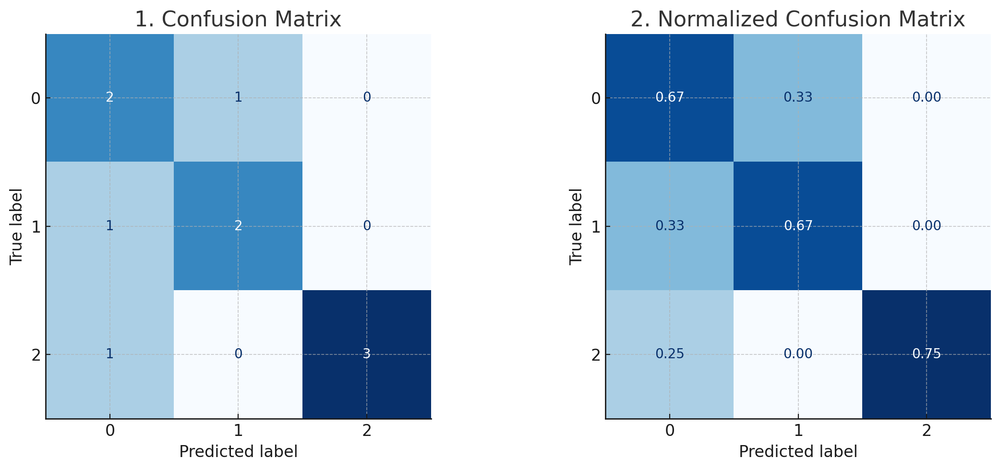

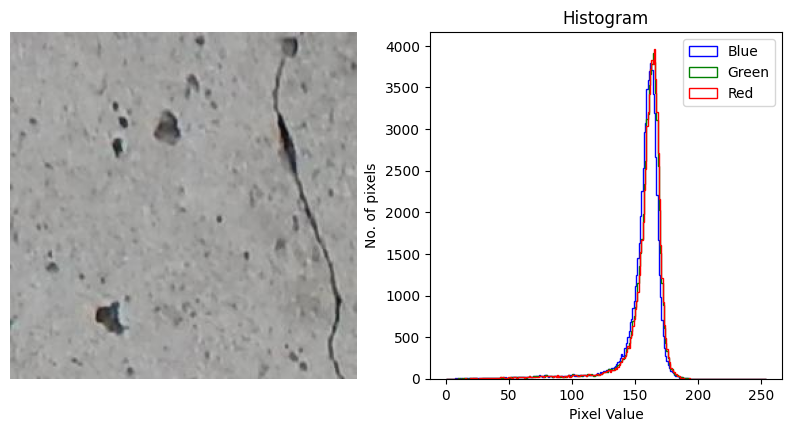

In [ ]:
class AssessmentParameters:

    def _validate_array_shapes(self, arr1, arr2, arr_name1="Array 1", arr_name2="Array 2"):
        """Validate that two arrays have the same shape."""
        if arr1.shape != arr2.shape:
            raise ValueError(f"{arr_name1} and {arr_name2} must have the same shape: {arr1.shape} vs {arr2.shape}")

    def _validate_numeric(self, value, value_name):
        """Validate that a value is numeric (int or float)."""
        if not isinstance(value, (int, float)):
            raise ValueError(f"{value_name} must be numeric (int or float).")

    def _validate_numpy_array(self, arr, arr_name):
        """Validate that an input is a numpy array."""
        if not isinstance(arr, np.ndarray):
            raise ValueError(f"{arr_name} must be a numpy.ndarray.")

    def _validate_labels(self, y_true, y_pred):
        """Validate that labels are lists or arrays of the same length."""
        if not isinstance(y_true, (list, np.ndarray)) or not isinstance(y_pred, (list, np.ndarray)):
            raise ValueError("y_true and y_pred must be lists or numpy arrays.")
        if len(y_true) != len(y_pred):
            raise ValueError(f"y_true and y_pred must have the same length: {len(y_true)} vs {len(y_pred)}")

    ############################################# Image Processing & Data Analysis Metrics #############################################

    def calculate_mse(self, original, reconstructed):
        """
        Calculate Mean Squared Error between two images.

        Args:
            original (np.ndarray): Original image.
            reconstructed (np.ndarray): Reconstructed image.

        Returns:
            float: Mean Squared Error value.

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            self._validate_numpy_array(original, "Original image")
            self._validate_numpy_array(reconstructed, "Reconstructed image")
            self._validate_array_shapes(original, reconstructed, "Original image", "Reconstructed image")
            return ((original - reconstructed) ** 2).mean()
        except Exception as e:
            raise RuntimeError(f"Error calculating MSE: {e}")

    def calculate_std(self, values):
        """
        Calculate Standard Deviation of a list of values.

        Args:
            values (list or np.ndarray): Input values.

        Returns:
            float: Standard Deviation.

        Raises:
            ValueError: If input is empty or not a list/array.
        """
        try:
            if not isinstance(values, (list, np.ndarray)) or len(values) == 0:
                raise ValueError("Values must be a non-empty list or numpy array.")
            return np.std(values)
        except Exception as e:
            raise RuntimeError(f"Error calculating standard deviation: {e}")

    def calculate_mean(self, values):
        """
        Calculate Mean of a list of values.

        Args:
            values (list or np.ndarray): Input values.

        Returns:
            float: Mean value.

        Raises:
            ValueError: If input is empty or not a list/array.
        """
        try:
            if not isinstance(values, (list, np.ndarray)) or len(values) == 0:
                raise ValueError("Values must be a non-empty list or numpy array.")
            return np.mean(values)
        except Exception as e:
            raise RuntimeError(f"Error calculating mean: {e}")

    def calculate_mae(self, y_true, y_pred):
        """
        Calculate Mean Absolute Error.

        Args:
            y_true (np.ndarray): True values.
            y_pred (np.ndarray): Predicted values.

        Returns:
            float: Mean Absolute Error value.

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            self._validate_numpy_array(y_true, "True values")
            self._validate_numpy_array(y_pred, "Predicted values")
            self._validate_array_shapes(y_true, y_pred, "True values", "Predicted values")
            return mean_absolute_error(y_true, y_pred)
        except Exception as e:
            raise RuntimeError(f"Error calculating MAE: {e}")

    def calculate_z_score(self, value, mean, std):
        """
        Calculate Z-Score for a value.

        Args:
            value (float): Value to standardize.
            mean (float): Mean of the dataset.
            std (float): Standard deviation of the dataset.

        Returns:
            float: Z-Score.

        Raises:
            ValueError: If inputs are not numeric or std is zero.
        """
        try:
            self._validate_numeric(value, "Value")
            self._validate_numeric(mean, "Mean")
            self._validate_numeric(std, "Standard deviation")
            if std == 0:
                raise ValueError("Standard deviation cannot be zero.")
            return (value - mean) / std
        except Exception as e:
            raise RuntimeError(f"Error calculating Z-Score: {e}")

    def calculate_psnr(self, original, reconstructed):
        """
        Calculate Peak Signal-to-Noise Ratio.

        Args:
            original (np.ndarray): Original image.
            reconstructed (np.ndarray): Reconstructed image.

        Returns:
            float: PSNR value in decibels.

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            mse = self.calculate_mse(original, reconstructed)
            if mse == 0:
                return float('inf')
            max_pixel = 255.0
            return 20 * np.log10(max_pixel / np.sqrt(mse))
        except Exception as e:
            raise RuntimeError(f"Error calculating PSNR: {e}")

    def calculate_ssim(self, original, reconstructed):
        """
        Calculate Structural Similarity Index.

        Args:
            original (np.ndarray): Original image.
            reconstructed (np.ndarray): Reconstructed image.

        Returns:
            float: SSIM value.

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            self._validate_numpy_array(original, "Original image")
            self._validate_numpy_array(reconstructed, "Reconstructed image")
            self._validate_array_shapes(original, reconstructed, "Original image", "Reconstructed image")
            return ssim(original, reconstructed, multichannel=True)
        except Exception as e:
            raise RuntimeError(f"Error calculating SSIM: {e}")

    def calculate_fsim(self, image1, image2):
        """
        Calculate Feature Similarity Index (FSIM).

        Args:
            image1 (np.ndarray): First image.
            image2 (np.ndarray): Second image.

        Returns:
            float: FSIM score.

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            self._validate_numpy_array(image1, "Image 1")
            self._validate_numpy_array(image2, "Image 2")
            self._validate_array_shapes(image1, image2, "Image 1", "Image 2")
            return ssim(image1, image2, multichannel=True)
        except Exception as e:
            raise RuntimeError(f"Error calculating FSIM: {e}")

    def calculate_vif(self, image1, image2):
        """
        Calculate Visual Information Fidelity (VIF).

        Args:
            image1 (np.ndarray): First image.
            image2 (np.ndarray): Second image.

        Returns:
            float: VIF score (placeholder).

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            self._validate_numpy_array(image1, "Image 1")
            self._validate_numpy_array(image2, "Image 2")
            self._validate_array_shapes(image1, image2, "Image 1", "Image 2")
            return 0.0  # Placeholder for actual VIF calculation
        except Exception as e:
            raise RuntimeError(f"Error calculating VIF: {e}")

    ############################################# Histogram Comparison #############################################

    def plot_image_and_histogram(self, image, display_image=None, save_path=None):
        """
        Plot an image alongside its RGB channel histograms.

        Args:
            image (np.ndarray): Image in BGR format.
            display_image (np.ndarray, optional): Image to display (e.g., RGB or masked).
            save_path (str, optional): Path to save the plot.

        Raises:
            ValueError: If inputs are not valid numpy arrays or have incorrect shapes.
        """
        try:
            self._validate_numpy_array(image, "Image")
            if image.shape[-1] != 3:
                raise ValueError("Image must have 3 channels (BGR format).")
            if display_image is not None:
                self._validate_numpy_array(display_image, "Display image")
                if display_image.shape[-1] != 3:
                    raise ValueError("Display image must have 3 channels (RGB format).")

            fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4.5))

            # Display image
            ax[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB) if display_image is None else display_image)
            ax[0].axis('off')
            ax[0].set_title('Image')

            # Plot histograms for B, G, R channels
            for i, (color, channel_name) in enumerate(zip(['b', 'g', 'r'], ['Blue', 'Green', 'Red'])):
                ax[1].hist(image[:, :, i].ravel(), bins=256, range=(0, 255), color=color, histtype='step', label=channel_name)

            ax[1].set_title('RGB Histogram')
            ax[1].set_xlabel('Pixel Value')
            ax[1].set_ylabel('No. of Pixels')
            ax[1].legend()
            plt.tight_layout()

            if save_path:
                plt.savefig(save_path)
                plt.close()
            else:
                plt.show()

        except Exception as e:
            raise RuntimeError(f"Error plotting histogram: {e}")

    def calculate_histogram_intersection(self, image1, image2, bins=256):
        """
        Calculate histogram intersection for RGB channels of two images.

        Args:
            image1 (np.ndarray): First image (BGR format).
            image2 (np.ndarray): Second image (BGR format).
            bins (int): Number of histogram bins.

        Returns:
            float: Average histogram intersection score across RGB channels.

        Raises:
            ValueError: If inputs are not valid numpy arrays or have incorrect shapes.
        """
        try:
            self._validate_numpy_array(image1, "Image 1")
            self._validate_numpy_array(image2, "Image 2")
            self._validate_array_shapes(image1, image2, "Image 1", "Image 2")
            if image1.shape[-1] != 3 or image2.shape[-1] != 3:
                raise ValueError("Both images must have 3 channels (BGR format).")

            intersections = []
            for channel in range(3):
                hist1, _ = np.histogram(image1[:, :, channel].ravel(), bins=bins, range=(0, 255), density=True)
                hist2, _ = np.histogram(image2[:, :, channel].ravel(), bins=bins, range=(0, 255), density=True)
                intersections.append(np.minimum(hist1, hist2).sum())

            return np.mean(intersections)
        except Exception as e:
            raise RuntimeError(f"Error calculating histogram intersection: {e}")

    ############################################# Deep Learning Metrics #############################################

    def analyze_confusion_matrix(self, true_labels, predicted_labels, class_names, save_path=None):
        """
        Compute and visualize confusion matrix with associated metrics (precision, recall, F1-score, accuracy).

        Args:
            true_labels (np.ndarray): True labels of the samples.
            predicted_labels (np.ndarray): Predicted labels of the samples.
            class_names (list): Names of the classes corresponding to the labels.
            save_path (str, optional): Path to save the confusion matrix plot.

        Returns:
            dict: Dictionary containing precision, recall, F1-score, and accuracy.

        Raises:
            ValueError: If inputs are invalid, labels have different lengths, or class_names is invalid.
        """
        try:
            # Validate inputs
            self._validate_labels(true_labels, predicted_labels)
            if not isinstance(class_names, list) or len(class_names) == 0:
                raise ValueError("class_names must be a non-empty list.")
            unique_labels = np.unique(np.concatenate([true_labels, predicted_labels]))
            if len(class_names) < len(unique_labels):
                raise ValueError("class_names must cover all unique labels in true_labels and predicted_labels.")

            # Compute confusion matrix
            cm = confusion_matrix(true_labels, predicted_labels)

            # Compute metrics
            precision = precision_score(true_labels, predicted_labels, average='macro', zero_division=0)
            recall = recall_score(true_labels, predicted_labels, average='macro', zero_division=0)
            f1 = f1_score(true_labels, predicted_labels, average='macro', zero_division=0)
            accuracy = accuracy_score(true_labels, predicted_labels)

            # Print metrics
            print(f"Precision: {precision:.2f}")
            print(f"Recall: {recall:.2f}")
            print(f"F1-Score: {f1:.2f}")
            print(f"Accuracy: {accuracy:.2f}")

            # Normalize confusion matrix
            cm_sum = cm.sum(axis=1)[:, np.newaxis]
            cm_normalized = np.divide(cm, cm_sum, where=cm_sum != 0)

            # Plot confusion matrices
            fig, ax = plt.subplots(1, 2, figsize=(15, 6))

            # Plot raw confusion matrix
            sns.heatmap(cm, annot=True, ax=ax[0], cmap="Blues", fmt="g",
                       xticklabels=class_names, yticklabels=class_names)
            ax[0].set_title('Confusion Matrix')
            ax[0].set_xlabel('Predicted Labels')
            ax[0].set_ylabel('True Labels')

            # Plot normalized confusion matrix
            sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', ax=ax[1],
                       xticklabels=class_names, yticklabels=class_names)
            ax[1].set_title('Normalized Confusion Matrix')
            ax[1].set_xlabel('Predicted Labels')
            ax[1].set_ylabel('True Labels')

            plt.tight_layout()
            if save_path:
                plt.savefig(save_path)
                plt.close()
            else:
                plt.show()

            return {
                'precision': precision,
                'recall': recall,
                'f1_score': f1,
                'accuracy': accuracy
            }

        except Exception as e:
            raise RuntimeError(f"Error analyzing confusion matrix: {e}")

    def calculate_kappa_score(self, y_true, y_pred):
        """
        Calculate Cohen's Kappa score.

        Args:
            y_true (list or np.ndarray): True labels.
            y_pred (list or np.ndarray): Predicted labels.

        Returns:
            float: Kappa score.

        Raises:
            ValueError: If inputs are invalid or have different lengths.
        """
        try:
            self._validate_labels(y_true, y_pred)
            return cohen_kappa_score(y_true, y_pred)
        except Exception as e:
            raise RuntimeError(f"Error calculating Kappa score: {e}")

    def calculate_iou(self, y_true, y_pred):
        """
        Calculate Intersection over Union (IoU).

        Args:
            y_true (np.ndarray): True binary labels.
            y_pred (np.ndarray): Predicted binary labels.

        Returns:
            float: IoU score.

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            self._validate_numpy_array(y_true, "True labels")
            self._validate_numpy_array(y_pred, "Predicted labels")
            self._validate_array_shapes(y_true, y_pred, "True labels", "Predicted labels")
            return jaccard_score(y_true.flatten(), y_pred.flatten())
        except Exception as e:
            raise RuntimeError(f"Error calculating IoU: {e}")

    def calculate_miou(self, y_true, y_pred, num_classes):
        """
        Calculate Mean Intersection over Union (mIoU).

        Args:
            y_true (np.ndarray): True labels.
            y_pred (np.ndarray): Predicted labels.
            num_classes (int): Number of classes.

        Returns:
            float: mIoU score.

        Raises:
            ValueError: If inputs are not numpy arrays, have different shapes, or num_classes is invalid.
        """
        try:
            self._validate_numpy_array(y_true, "True labels")
            self._validate_numpy_array(y_pred, "Predicted labels")
            self._validate_array_shapes(y_true, y_pred, "True labels", "Predicted labels")
            if not isinstance(num_classes, int) or num_classes < 1:
                raise ValueError("num_classes must be a positive integer.")
            ious = [self.calculate_iou(y_true == i, y_pred == i) for i in range(num_classes)]
            return np.mean(ious)
        except Exception as e:
            raise RuntimeError(f"Error calculating mIoU: {e}")

    def calculate_dice_coefficient(self, y_true, y_pred):
        """
        Calculate Dice Coefficient.

        Args:
            y_true (np.ndarray): True binary labels.
            y_pred (np.ndarray): Predicted binary labels.

        Returns:
            float: Dice Coefficient.

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            self._validate_numpy_array(y_true, "True labels")
            self._validate_numpy_array(y_pred, "Predicted labels")
            self._validate_array_shapes(y_true, y_pred, "True labels", "Predicted labels")
            intersection = np.sum(y_true * y_pred)
            return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + 1e-6)
        except Exception as e:
            raise RuntimeError(f"Error calculating Dice Coefficient: {e}")

    def calculate_sparsity(self, matrix):
        """
        Calculate sparsity of a matrix.

        Args:
            matrix (np.ndarray): Input matrix.

        Returns:
            float: Sparsity of the matrix.

        Raises:
            ValueError: If input is not a numpy array.
        """
        try:
            self._validate_numpy_array(matrix, "Matrix")
            num_non_zero = np.count_nonzero(matrix)
            return 1 - (num_non_zero / matrix.size)
        except Exception as e:
            raise RuntimeError(f"Error calculating sparsity: {e}")

    def calculate_cross_entropy(self, y_true, y_pred):
        """
        Calculate Cross-Entropy loss.

        Args:
            y_true (np.ndarray): True labels (one-hot encoded).
            y_pred (np.ndarray): Predicted probabilities.

        Returns:
            float: Cross-Entropy loss.

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            self._validate_numpy_array(y_true, "True labels")
            self._validate_numpy_array(y_pred, "Predicted probabilities")
            self._validate_array_shapes(y_true, y_pred, "True labels", "Predicted probabilities")
            return log_loss(y_true, y_pred)
        except Exception as e:
            raise RuntimeError(f"Error calculating Cross-Entropy loss: {e}")

    def calculate_roc_auc(self, y_true, y_score):
        """
        Calculate ROC-AUC score.

        Args:
            y_true (np.ndarray): True binary labels.
            y_score (np.ndarray): Target scores (probabilities).

        Returns:
            float: ROC-AUC score.

        Raises:
            ValueError: If inputs are not numpy arrays or have different shapes.
        """
        try:
            self._validate_numpy_array(y_true, "True labels")
            self._validate_numpy_array(y_score, "Scores")
            self._validate_array_shapes(y_true, y_score, "True labels", "Scores")
            return roc_auc_score(y_true, y_score)
        except Exception as e:
            raise RuntimeError(f"Error calculating ROC-AUC: {e}")

    ############################################# Computational Metrics #############################################

    def calculate_time(self, start_time, end_time, metric_name="time"):
        """
        Calculate time duration (e.g., CPU or inference time).

        Args:
            start_time (float): Start time.
            end_time (float): End time.
            metric_name (str): Name of the metric (for error messages).

        Returns:
            float: Time duration in seconds.

        Raises:
            ValueError: If inputs are not numeric.
        """
        try:
            self._validate_numeric(start_time, f"Start {metric_name}")
            self._validate_numeric(end_time, f"End {metric_name}")
            return end_time - start_time
        except Exception as e:
            raise RuntimeError(f"Error calculating {metric_name}: {e}")

    def calculate_cpu_time(self, start_time, end_time):
        """
        Calculate CPU time used in computation.

        Args:
            start_time (float): Start time of computation.
            end_time (float): End time of computation.

        Returns:
            float: CPU time in seconds.

        Raises:
            ValueError: If inputs are not numeric.
        """
        return self.calculate_time(start_time, end_time, "CPU time")

    def calculate_inference_time(self, start_time, end_time):
        """
        Calculate inference time.

        Args:
            start_time (float): Start time of inference.
            end_time (float): End time of inference.

        Returns:
            float: Inference time in seconds.

        Raises:
            ValueError: If inputs are not numeric.
        """
        return self.calculate_time(start_time, end_time, "inference time")

    def calculate_model_size(self, model):
        """
        Calculate model size in bytes.

        Args:
            model: Trained model (e.g., TensorFlow or PyTorch model).

        Returns:
            int: Model size in bytes.

        Raises:
            ValueError: If model is invalid.
        """
        try:
            if model is None:
                raise ValueError("Model cannot be None.")
            return sys.getsizeof(model)
        except Exception as e:
            raise RuntimeError(f"Error calculating model size: {e}")

# Example usage
if __name__ == "__main__":
    ap = AssessmentParameters()

    try:
        # Example: Confusion matrix analysis
        true_labels = np.array([0, 1, 2, 0, 1, 2, 0, 1, 2])
        predicted_labels = np.array([0, 1, 0, 0, 1, 2, 2, 1, 2])
        class_names = ['crack', 'bughole', 'background']

        metrics = ap.analyze_confusion_matrix(true_labels, predicted_labels, class_names, save_path='confusion_matrix.png')
        print("Returned Metrics:", metrics)

        # Example: Image metrics (replace with actual image paths)
        image1 = cv2.imread('path_to_image1.jpg')
        image2 = cv2.imread('path_to_image2.jpg')

        if image1 is None or image2 is None:
            raise ValueError("Failed to load one or both images. Check file paths.")

        # Plot histograms
        ap.plot_image_and_histogram(image1, save_path='image1_histogram.png')
        ap.plot_image_and_histogram(image2, save_path='image2_histogram.png')

        # Calculate histogram intersection
        hist_score = ap.calculate_histogram_intersection(image1, image2)
        print(f"Histogram Intersection Score: {hist_score}")

        # Calculate MSE
        mse = ap.calculate_mse(image1, image2)
        print(f"MSE: {mse}")

    except Exception as e:
        print(f"Error in example usage: {e}")

**Explainable Artificial Intelligence**

1. **Dataset Preparation**

  *   Collect concrete surface images with different local damages.

  *   Apply multiple preprocessing methods → create parallel datasets.


2. **Model Training**

  *   Train the same DL model (e.g., CNN, U-Net, YOLOv8) on each dataset.


3. **XAI Application**

  *   Use methods like Grad-CAM, SHAP, LIME to interpret predictions.

  *   Generate heatmaps/feature attributions for raw vs. preprocessed images.


4. **Comparison & Evaluation**

  *   Assess alignment of XAI maps with ground-truth cracks/damages.

  *   Measure shift in important features (e.g., cracks vs. noise/shadows).

  *   Check robustness: does preprocessing improve consistency of explanations?


5. **Synthesis**

  *   Combine performance metrics + XAI evidence to judge whether preprocessin  helps models focus on true structural damages.


1. Feature Attribution

In [ ]:
import numpy as np
import shap
import lime.lime_image
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries

class FeatureAttributionXAI:
    def __init__(self, model, preprocess_fn=None):
        """
        Class for Explainable AI Feature Attribution using LIME & SHAP.

        Args:
            model: Trained DL model (Keras, PyTorch wrapper, etc.)
            preprocess_fn: Function to preprocess input images before feeding to the model
        """
        self.model = model
        self.preprocess_fn = preprocess_fn

    ############################################# Validation Utilities #############################################

    def _validate_numpy_array(self, arr, arr_name):
        """Validate that an input is a numpy array."""
        if not isinstance(arr, np.ndarray):
            raise ValueError(f"{arr_name} must be a numpy.ndarray.")

    def _validate_model(self):
        """Validate that a model exists."""
        if self.model is None:
            raise ValueError("Model cannot be None. Please provide a trained model.")

    ############################################# SHAP Explanations #############################################

    def explain_with_shap(self, image, nsamples=100):
        """
        Generate SHAP attribution for a single image.

        Args:
            image (np.ndarray): Input image.
            nsamples (int): Number of samples for SHAP approximation.

        Returns:
            shap_values: SHAP explanation object.

        Raises:
            RuntimeError: If SHAP explanation fails.
        """
        try:
            self._validate_numpy_array(image, "Input image")
            self._validate_model()

            # Preprocess image
            input_img = self.preprocess_fn(image) if self.preprocess_fn else image
            input_img = np.expand_dims(input_img, axis=0)  # batch dimension

            explainer = shap.Explainer(self.model, input_img)
            shap_values = explainer(input_img, max_evals=nsamples)

            # Plot SHAP heatmap
            shap.image_plot(shap_values, input_img)
            return shap_values

        except Exception as e:
            raise RuntimeError(f"Error generating SHAP explanation: {e}")

    ############################################# LIME Explanations #############################################

    def explain_with_lime(self, image, num_samples=1000, num_features=10):
        """
        Generate LIME attribution for a single image.

        Args:
            image (np.ndarray): Input image.
            num_samples (int): Number of samples for LIME perturbations.
            num_features (int): Number of top features to highlight.

        Returns:
            explanation: LIME explanation object.

        Raises:
            RuntimeError: If LIME explanation fails.
        """
        try:
            self._validate_numpy_array(image, "Input image")
            self._validate_model()

            explainer = lime.lime_image.LimeImageExplainer()

            # Prediction function
            def predict_fn(images):
                processed = np.array([
                    self.preprocess_fn(img) if self.preprocess_fn else img
                    for img in images
                ])
                return self.model.predict(processed)

            explanation = explainer.explain_instance(
                image,
                predict_fn,
                top_labels=1,
                hide_color=0,
                num_samples=num_samples
            )

            # Extract mask
            temp, mask = explanation.get_image_and_mask(
                explanation.top_labels[0],
                positive_only=True,
                num_features=num_features,
                hide_rest=False
            )

            # Plot result
            plt.imshow(mark_boundaries(temp / 255.0, mask))
            plt.axis("off")
            plt.title("LIME Explanation")
            plt.show()

            return explanation

        except Exception as e:
            raise RuntimeError(f"Error generating LIME explanation: {e}")

############################################# Example Usage #############################################
if __name__ == "__main__":
    import cv2
    from tensorflow.keras.models import load_model
    from tensorflow.keras.applications.vgg16 import preprocess_input

    # Example model
    try:
        model = load_model("crack_model.h5")

        # Define preprocessing
        def preprocess_fn(img):
            img_resized = cv2.resize(img, (224, 224))
            return preprocess_input(img_resized)

        # Initialize class
        xai = FeatureAttributionXAI(model, preprocess_fn)

        # Load test image
        image = cv2.imread("sample_crack.jpg")
        if image is None:
            raise ValueError("Failed to load sample image.")

        # SHAP explanation
        xai.explain_with_shap(image, nsamples=100)

        # LIME explanation
        xai.explain_with_lime(image, num_samples=1000, num_features=5)

    except Exception as e:
        print(f"Error in example usage: {e}")

2. Saliency & Gradient-based Explanations

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
import tensorflow.keras.backend as kb

class GradientAttributionXAI:
    def __init__(self, model, preprocess_fn=None):
        """
        Class for Saliency & Gradient-based Explanations (Grad-CAM, Integrated Gradients).

        Args:
            model: Trained Keras/TensorFlow model.
            preprocess_fn: Preprocessing function for input images.
        """
        self.model = model
        self.preprocess_fn = preprocess_fn

    ############################################# Validation Utilities #############################################

    def _validate_numpy_array(self, arr, arr_name):
        """Validate numpy array input."""
        if not isinstance(arr, np.ndarray):
            raise ValueError(f"{arr_name} must be a numpy.ndarray.")

    def _validate_model(self):
        """Ensure model is provided."""
        if self.model is None:
            raise ValueError("Model cannot be None. Please provide a trained model.")

    ############################################# Grad-CAM #############################################

    def explain_with_gradcam(self, image, target_layer, class_index=None, cmap='jet'):
        """
        Grad-CAM heatmap explanation.

        Args:
            image (np.ndarray): Input image.
            target_layer (str): Name of convolutional layer to compute Grad-CAM.
            class_index (int): Target class index. Defaults to model's predicted class.
            cmap (str): Colormap for heatmap.

        Returns:
            heatmap (np.ndarray): Grad-CAM heatmap.
        """
        self._validate_numpy_array(image, "Input image")
        self._validate_model()

        # Preprocess
        input_img = self.preprocess_fn(image) if self.preprocess_fn else image
        input_img = np.expand_dims(input_img, axis=0)

        # Model parts
        grad_model = Model(
            inputs=self.model.inputs,
            outputs=[self.model.get_layer(target_layer).output, self.model.output]
        )

        # Compute gradients
        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(input_img)
            if class_index is None:
                class_index = np.argmax(predictions[0])
            loss = predictions[:, class_index]

        grads = tape.gradient(loss, conv_outputs)[0]  # gradients wrt feature map
        conv_outputs = conv_outputs[0]

        # Grad-CAM weights
        weights = tf.reduce_mean(grads, axis=(0, 1))
        cam = np.zeros(conv_outputs.shape[0:2], dtype=np.float32)

        for i, w in enumerate(weights):
            cam += w * conv_outputs[:, :, i]

        cam = np.maximum(cam, 0)
        cam = cam / cam.max() if cam.max() != 0 else cam

        # Resize to image size
        heatmap = cv2.resize(cam, (image.shape[1], image.shape[0]))

        # Overlay
        heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), 0.6, heatmap_color, 0.4, 0)

        plt.imshow(overlay)
        plt.axis("off")
        plt.title("Grad-CAM")
        plt.show()

        return heatmap

    ############################################# Integrated Gradients #############################################

    def explain_with_integrated_gradients(self, image, baseline=None, steps=50):
        """
        Integrated Gradients attribution.

        Args:
            image (np.ndarray): Input image.
            baseline (np.ndarray): Baseline image (default: zero array).
            steps (int): Number of interpolation steps.

        Returns:
            integrated_gradients (np.ndarray): Attribution map.
        """
        self._validate_numpy_array(image, "Input image")
        self._validate_model()

        # Preprocess
        input_img = self.preprocess_fn(image) if self.preprocess_fn else image
        input_img = np.expand_dims(input_img, axis=0).astype(np.float32)

        # Define baseline
        if baseline is None:
            baseline = np.zeros_like(input_img, dtype=np.float32)
        else:
            baseline = np.expand_dims(baseline, axis=0).astype(np.float32)

        # Interpolation
        interpolated_images = [
            baseline + (float(i) / steps) * (input_img - baseline)
            for i in range(steps + 1)
        ]
        interpolated_images = np.array(interpolated_images)

        # Gradient function
        with tf.GradientTape() as tape:
            tape.watch(interpolated_images)
            preds = self.model(interpolated_images)
            top_class = tf.argmax(preds[0])
            outputs = preds[:, top_class]

        grads = tape.gradient(outputs, interpolated_images)
        avg_grads = tf.reduce_mean(grads, axis=0).numpy()

        # Integrated gradients
        integrated_gradients = (input_img - baseline) * avg_grads

        # Visualization
        ig_map = np.sum(np.abs(integrated_gradients[0]), axis=-1)
        ig_map = ig_map / ig_map.max() if ig_map.max() != 0 else ig_map

        plt.imshow(ig_map, cmap="inferno")
        plt.axis("off")
        plt.title("Integrated Gradients")
        plt.show()

        return integrated_gradients[0]

############################################# Example Usage #############################################
if __name__ == "__main__":
    from tensorflow.keras.models import load_model
    from tensorflow.keras.applications.vgg16 import preprocess_input

    try:
        model = load_model("crack_model.h5")

        def preprocess_fn(img):
            img_resized = cv2.resize(img, (224, 224))
            return preprocess_input(img_resized)

        xai_grad = GradientAttributionXAI(model, preprocess_fn)

        # Load test image
        image = cv2.imread("sample_crack.jpg")
        if image is None:
            raise ValueError("Failed to load test image.")

        # Grad-CAM
        xai_grad.explain_with_gradcam(image, target_layer="block5_conv3")

        # Integrated Gradients
        xai_grad.explain_with_integrated_gradients(image, steps=30)

    except Exception as e:
        print(f"Error in example usage: {e}")

3. Rule-based & Surrogate Models

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

class SurrogateAttributionXAI:
    def __init__(self, model, preprocess_fn=None):
        """
        Rule-based & Surrogate Model Explanations (Decision Trees, Linear Models).

        Args:
            model: Trained DL model (Keras, PyTorch wrapper, etc.).
            preprocess_fn: Function to preprocess input images before feeding to the model.
        """
        self.model = model
        self.preprocess_fn = preprocess_fn

    ############################################# Validation Utilities #############################################

    def _validate_numpy_array(self, arr, arr_name):
        """Validate numpy array input."""
        if not isinstance(arr, np.ndarray):
            raise ValueError(f"{arr_name} must be a numpy.ndarray.")

    def _validate_model(self):
        """Ensure model is provided."""
        if self.model is None:
            raise ValueError("Model cannot be None. Please provide a trained model.")

    ############################################# Decision Tree Surrogate #############################################

    def surrogate_with_decision_tree(self, images, labels, max_depth=3):
        """
        Train a surrogate Decision Tree to approximate the DL model.

        Args:
            images (np.ndarray): Input images.
            labels (np.ndarray): Ground truth labels or DL model predictions.
            max_depth (int): Max depth of the tree.

        Returns:
            decision_tree: Trained Decision Tree model.
        """
        self._validate_numpy_array(images, "Input images")
        self._validate_numpy_array(labels, "Labels")
        self._validate_model()

        # Preprocess images and flatten for tabular surrogate model
        processed_images = np.array([self.preprocess_fn(img) if self.preprocess_fn else img for img in images])
        processed_images = processed_images.reshape(processed_images.shape[0], -1)

        # Labels can come from model predictions
        if labels is None:
            labels = np.argmax(self.model.predict(processed_images), axis=1)

        # Train Decision Tree
        tree = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
        tree.fit(processed_images, labels)

        # Evaluate fidelity
        pred_labels = tree.predict(processed_images)
        fidelity = accuracy_score(labels, pred_labels)

        # Plot tree
        plt.figure(figsize=(12, 6))
        plot_tree(tree, filled=True, fontsize=8)
        plt.title("Decision Tree Surrogate Model")
        plt.show()

        print(f"Decision Tree Fidelity (Accuracy w.r.t labels): {fidelity:.3f}")
        return tree

    ############################################# Surrogate Linear Model #############################################

    def surrogate_with_linear_model(self, images, labels):
        """
        Train a surrogate Logistic Regression model to approximate DL model.

        Args:
            images (np.ndarray): Input images.
            labels (np.ndarray): Ground truth labels or DL model predictions.

        Returns:
            linear_model: Trained Logistic Regression surrogate.
        """
        self._validate_numpy_array(images, "Input images")
        self._validate_numpy_array(labels, "Labels")
        self._validate_model()

        # Preprocess & flatten
        processed_images = np.array([self.preprocess_fn(img) if self.preprocess_fn else img for img in images])
        processed_images = processed_images.reshape(processed_images.shape[0], -1)

        # Labels can come from model predictions
        if labels is None:
            labels = np.argmax(self.model.predict(processed_images), axis=1)

        # Train Logistic Regression
        linear_model = LogisticRegression(max_iter=1000)
        linear_model.fit(processed_images, labels)

        # Evaluate fidelity
        pred_labels = linear_model.predict(processed_images)
        fidelity = accuracy_score(labels, pred_labels)

        print(f"Linear Surrogate Fidelity (Accuracy w.r.t labels): {fidelity:.3f}")

        # Plot feature importance (top weights)
        coef = linear_model.coef_[0]
        top_idx = np.argsort(np.abs(coef))[-10:]
        plt.barh(range(len(top_idx)), coef[top_idx])
        plt.yticks(range(len(top_idx)), [f"Feat {i}" for i in top_idx])
        plt.title("Linear Surrogate Feature Importance")
        plt.show()

        return linear_model

############################################# Example Usage #############################################
if __name__ == "__main__":
    import cv2
    from tensorflow.keras.models import load_model
    from tensorflow.keras.applications.vgg16 import preprocess_input

    try:
        model = load_model("crack_model.h5")

        def preprocess_fn(img):
            img_resized = cv2.resize(img, (64, 64))  # smaller for surrogate
            return preprocess_input(img_resized)

        xai_surrogate = SurrogateAttributionXAI(model, preprocess_fn)

        # Example: Load multiple images
        sample_images = [cv2.imread("sample_crack.jpg")] * 20
        sample_images = np.array([img for img in sample_images if img is not None])
        labels = np.array([1] * len(sample_images))  # Example labels

        # Decision Tree surrogate
        xai_surrogate.surrogate_with_decision_tree(sample_images, labels, max_depth=3)

        # Linear surrogate
        xai_surrogate.surrogate_with_linear_model(sample_images, labels)

    except Exception as e:
        print(f"Error in example usage: {e}")

4. Prototype & Example-based Explanations

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics.pairwise import euclidean_distances

class PrototypeAttributionXAI:
    def __init__(self, model, preprocess_fn=None):
        """
        Prototype & Example-based Explanations (Case-based reasoning, Prototypes & Criticisms).

        Args:
            model: Trained DL model (Keras, PyTorch wrapper, etc.)
            preprocess_fn: Function for preprocessing input images.
        """
        self.model = model
        self.preprocess_fn = preprocess_fn

    ############################################# Validation Utilities #############################################

    def _validate_numpy_array(self, arr, arr_name):
        """Validate numpy array input."""
        if not isinstance(arr, np.ndarray):
            raise ValueError(f"{arr_name} must be a numpy.ndarray.")

    def _validate_model(self):
        """Ensure model is provided."""
        if self.model is None:
            raise ValueError("Model cannot be None. Please provide a trained model.")

    ############################################# Case-Based Reasoning #############################################

    def explain_with_case_based_reasoning(self, query_image, reference_images, k=3):
        """
        Case-Based Reasoning (nearest neighbors).

        Args:
            query_image (np.ndarray): Input image to explain.
            reference_images (np.ndarray): Database of known cases.
            k (int): Number of similar cases to retrieve.

        Returns:
            indices (list): Indices of the most similar cases.
        """
        self._validate_numpy_array(query_image, "Query image")
        self._validate_numpy_array(reference_images, "Reference images")
        self._validate_model()

        # Preprocess
        query_processed = self.preprocess_fn(query_image) if self.preprocess_fn else query_image
        query_processed = query_processed.flatten()

        ref_processed = np.array([
            self.preprocess_fn(img) if self.preprocess_fn else img for img in reference_images
        ])
        ref_processed = ref_processed.reshape(ref_processed.shape[0], -1)

        # Fit nearest neighbors
        nn = NearestNeighbors(n_neighbors=k, metric="euclidean")
        nn.fit(ref_processed)
        distances, indices = nn.kneighbors([query_processed])

        # Visualization
        plt.figure(figsize=(10, 3))
        plt.subplot(1, k+1, 1)
        plt.imshow(query_image[..., ::-1])
        plt.title("Query")
        plt.axis("off")

        for i, idx in enumerate(indices[0]):
            plt.subplot(1, k+1, i+2)
            plt.imshow(reference_images[idx][..., ::-1])
            plt.title(f"Case {i+1}")
            plt.axis("off")

        plt.suptitle("Case-Based Reasoning")
        plt.show()

        return indices[0]

    ############################################# Prototypes & Criticisms #############################################

    def explain_with_prototypes_criticisms(self, images, n_prototypes=3, n_criticisms=3):
        """
        Find prototypes (most representative) and criticisms (least representative).

        Args:
            images (np.ndarray): Dataset of images.
            n_prototypes (int): Number of prototypes to select.
            n_criticisms (int): Number of criticisms to select.

        Returns:
            prototypes (list): Indices of prototype images.
            criticisms (list): Indices of criticism images.
        """
        self._validate_numpy_array(images, "Images")
        self._validate_model()

        # Preprocess & flatten
        processed = np.array([
            self.preprocess_fn(img) if self.preprocess_fn else img for img in images
        ])
        processed = processed.reshape(processed.shape[0], -1)

        # Compute pairwise distances
        distances = euclidean_distances(processed, processed)

        # Prototypes: samples with minimum average distance to others
        avg_distances = distances.mean(axis=1)
        prototypes = np.argsort(avg_distances)[:n_prototypes]

        # Criticisms: samples with maximum average distance to prototypes
        prototype_set = processed[prototypes]
        distances_to_proto = euclidean_distances(processed, prototype_set).min(axis=1)
        criticisms = np.argsort(distances_to_proto)[-n_criticisms:]

        # Visualization
        plt.figure(figsize=(12, 4))

        for i, idx in enumerate(prototypes):
            plt.subplot(2, max(n_prototypes, n_criticisms), i+1)
            plt.imshow(images[idx][..., ::-1])
            plt.title(f"Prototype {i+1}")
            plt.axis("off")

        for j, idx in enumerate(criticisms):
            plt.subplot(2, max(n_prototypes, n_criticisms), max(n_prototypes, n_criticisms)+j+1)
            plt.imshow(images[idx][..., ::-1])
            plt.title(f"Criticism {j+1}")
            plt.axis("off")

        plt.suptitle("Prototypes & Criticisms")
        plt.show()

        return prototypes, criticisms

############################################# Example Usage #############################################
if __name__ == "__main__":
    import cv2
    from tensorflow.keras.models import load_model
    from tensorflow.keras.applications.vgg16 import preprocess_input

    try:
        model = load_model("crack_model.h5")

        def preprocess_fn(img):
            img_resized = cv2.resize(img, (64, 64))
            return preprocess_input(img_resized)

        xai_proto = PrototypeAttributionXAI(model, preprocess_fn)

        # Example dataset
        sample_images = [cv2.imread("sample_crack.jpg")] * 10
        sample_images = np.array([img for img in sample_images if img is not None])

        # Case-Based Reasoning
        query_img = sample_images[0]
        xai_proto.explain_with_case_based_reasoning(query_img, sample_images, k=3)

        # Prototypes & Criticisms
        xai_proto.explain_with_prototypes_criticisms(sample_images, n_prototypes=2, n_criticisms=2)

    except Exception as e:
        print(f"Error in example usage: {e}")

5. Visualization & Human-Centric Approaches

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram
import plotly.express as px
import plotly.graph_objects as go

class VisualizationXAI:
    def __init__(self, model=None, preprocess_fn=None):
        """
        Visualization & Human-Centric Explanations.

        Args:
            model: Trained DL model (optional, used for attention maps).
            preprocess_fn: Function for preprocessing input images.
        """
        self.model = model
        self.preprocess_fn = preprocess_fn

    ############################################# Validation Utilities #############################################

    def _validate_numpy_array(self, arr, arr_name):
        if not isinstance(arr, np.ndarray):
            raise ValueError(f"{arr_name} must be a numpy.ndarray.")

    ############################################# Heatmaps #############################################

    def explain_with_heatmap(self, image, attribution_map):
        """
        Visualize a heatmap overlay on the input image.

        Args:
            image (np.ndarray): Original input image (H, W, 3).
            attribution_map (np.ndarray): Attribution/importance scores (H, W).
        """
        self._validate_numpy_array(image, "Image")
        self._validate_numpy_array(attribution_map, "Attribution map")

        plt.figure(figsize=(6, 6))
        plt.imshow(image[..., ::-1], alpha=0.6)
        plt.imshow(attribution_map, cmap="jet", alpha=0.4)
        plt.colorbar(label="Importance")
        plt.title("Heatmap Visualization")
        plt.axis("off")
        plt.show()

    ############################################# Attention Maps #############################################

    def explain_with_attention_map(self, feature_map):
        """
        Visualize attention weights or feature activation maps.

        Args:
            feature_map (np.ndarray): Model attention/activation map (H, W).
        """
        self._validate_numpy_array(feature_map, "Feature map")

        plt.figure(figsize=(6, 6))
        plt.imshow(feature_map, cmap="viridis")
        plt.colorbar(label="Attention Weight")
        plt.title("Attention Map")
        plt.axis("off")
        plt.show()

    ############################################# Hierarchical Clustering #############################################

    def explain_with_clustering(self, features, labels=None):
        """
        Perform hierarchical clustering on features.

        Args:
            features (np.ndarray): Feature vectors (N, D).
            labels (list): Optional labels for each feature.
        """
        self._validate_numpy_array(features, "Features")

        Z = linkage(features, method="ward")
        plt.figure(figsize=(8, 4))
        dendrogram(Z, labels=labels)
        plt.title("Hierarchical Clustering of Features")
        plt.xlabel("Samples")
        plt.ylabel("Distance")
        plt.show()

    ############################################# Interactive Dashboard #############################################

    def explain_with_dashboard(self, features, labels=None):
        """
        Interactive dashboard for feature inspection.

        Args:
            features (np.ndarray): 2D feature space (N, 2).
            labels (list): Optional labels for points.
        """
        self._validate_numpy_array(features, "Features")

        if features.shape[1] != 2:
            raise ValueError("For dashboard visualization, features must have shape (N, 2).")

        fig = px.scatter(
            x=features[:, 0], y=features[:, 1],
            color=labels if labels is not None else None,
            title="Interactive Feature Inspection",
            labels={"x": "Feature 1", "y": "Feature 2"}
        )
        fig.update_traces(marker=dict(size=10, opacity=0.7))
        fig.show()

############################################# Example Usage #############################################
if __name__ == "__main__":
    import cv2

    try:
        # Dummy model (not needed for all methods)
        model = None

        viz_xai = VisualizationXAI(model)

        # Load example image
        sample_img = cv2.imread("sample_crack.jpg")
        sample_img = cv2.resize(sample_img, (128, 128))

        # Example: heatmap
        heatmap = np.random.rand(128, 128)  # dummy attribution
        viz_xai.explain_with_heatmap(sample_img, heatmap)

        # Example: attention map
        attention_map = np.random.rand(64, 64)
        viz_xai.explain_with_attention_map(attention_map)

        # Example: clustering
        features = np.random.rand(10, 5)
        viz_xai.explain_with_clustering(features, labels=[f"Img{i}" for i in range(10)])

        # Example: dashboard
        features_2d = np.random.rand(20, 2)
        labels = ["Crack" if i < 10 else "No Crack" for i in range(20)]
        viz_xai.explain_with_dashboard(features_2d, labels)

    except Exception as e:
        print(f"Error in example usage: {e}")

**XAI Framework (all in one)**

In [ ]:
"""
xai_framework.py

Unified XAIFramework for comparing preprocessing methods on local damage detection (SHM images).

Assumptions:
 - Models are Keras-style objects with .predict(np_batch) -> probs (N, C).
 - Images are numpy arrays in BGR or RGB as used by your preprocess function. Keep consistent.
 - Ground truth masks are binary arrays (H, W) or (N, H, W).

Dependencies:
  pip install shap lime matplotlib scikit-learn scipy plotly tensorflow opencv-python
"""

import os
import time
import json
from typing import Dict, List, Callable, Optional, Tuple

import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import jaccard_score, accuracy_score
from scipy.ndimage import zoom
import shap
import lime.lime_image
import tensorflow as tf
from tensorflow.keras.models import Model

# ----------------------------
# Utilities
# ----------------------------
def _ensure_dir(path):
    if not os.path.exists(path):
        os.makedirs(path, exist_ok=True)

def _normalize_map(m):
    m = m.astype(np.float32)
    if m.max() - m.min() == 0:
        return np.zeros_like(m)
    return (m - m.min()) / (m.max() - m.min())

def _resize_map_to(mask, target_shape):
    # mask: (h,w) -> resized to target_shape (H,W)
    return cv2.resize(mask.astype(np.float32), (target_shape[1], target_shape[0]), interpolation=cv2.INTER_LINEAR)

# ----------------------------
# XAI Framework
# ----------------------------
class XAIFramework:
    def __init__(
        self,
        models: Dict[str, object],
        preprocessed_sets: Dict[str, np.ndarray],
        raw_images: np.ndarray,
        gt_masks: Optional[np.ndarray] = None,
        preprocess_fn: Optional[Callable] = None,
        save_dir: str = "xai_results",
        device: Optional[str] = None
    ):
        """
        Args:
            models: dict[tag] -> trained model (Keras-style with .predict)
            preprocessed_sets: dict[tag] -> np.ndarray of images (N,H,W,3)
            raw_images: np.ndarray of raw images (N,H,W,3)
            gt_masks: np.ndarray of ground-truth masks (N,H,W) binary; optional but recommended
            preprocess_fn: function(image) -> model-ready input (resized, normalized)
            save_dir: where to save outputs
            device: optional device (not used here; for PyTorch adaptors)
        """
        self.models = models
        self.preprocessed_sets = preprocessed_sets
        self.raw_images = raw_images
        self.gt_masks = gt_masks
        self.preprocess_fn = preprocess_fn
        self.save_dir = save_dir
        _ensure_dir(save_dir)

        # validation
        if not isinstance(raw_images, np.ndarray):
            raise ValueError("raw_images must be a numpy array")
        if not isinstance(preprocessed_sets, dict) or len(preprocessed_sets) == 0:
            raise ValueError("preprocessed_sets must be a non-empty dict mapping tags to image arrays")
        if not isinstance(models, dict) or len(models) == 0:
            raise ValueError("models must be provided as a dict mapping preprocessing tag -> model")

        self.n = raw_images.shape[0]
        # check shapes
        for tag, imgs in preprocessed_sets.items():
            if not isinstance(imgs, np.ndarray):
                raise ValueError(f"preprocessed_sets[{tag}] must be numpy array")
            if imgs.shape[0] != self.n:
                raise ValueError(f"Preprocessed set '{tag}' has different number of images ({imgs.shape[0]}) than raw ({self.n})")

        if gt_masks is not None:
            if not isinstance(gt_masks, np.ndarray):
                raise ValueError("gt_masks must be numpy array")
            if gt_masks.shape[0] != self.n:
                raise ValueError("gt_masks length must match raw_images length")

        # LIME explainer (we will create one per predict function)
        self.lime_explainers = {}

    # ----------------------------
    # Core helpers
    # ----------------------------
    def _preprocess_for_model(self, img, tag=None):
        if self.preprocess_fn:
            return self.preprocess_fn(img)
        return img

    def _model_predict_proba(self, model, batch):
        """Return class probability for the positive class (binary) or full probs shape."""
        preds = model.predict(batch)
        return preds

    # ----------------------------
    # 1) Feature Attribution (SHAP, LIME)
    # ----------------------------
    def shap_image_attributions(self, model, background_images: np.ndarray, image: np.ndarray, nsamples=50):
        """
        Use shap.GradientExplainer or Kernel Explainer depending on model type.
        For Keras TF models, GradientExplainer may be used.
        """
        # create model wrapper: expects preprocessed batch
        # background_images: (M,H,W,3) preprocessed
        if background_images is None or len(background_images) == 0:
            raise ValueError("background_images required for SHAP")

        try:
            explainer = shap.GradientExplainer(model, background_images[:min(10, len(background_images))])
            x = np.expand_dims(self._preprocess_for_model(image), axis=0)
            shap_values = explainer.shap_values(x, nsamples=nsamples)
            # shap_values is list per class; for binary return both or choose pos class
            return shap_values
        except Exception as e:
            # fallback to KernelExplainer (slower)
            print("GradientExplainer failed, falling back to KernelExplainer:", e)
            def f(x): return model.predict(x)
            expl = shap.KernelExplainer(f, background_images[:min(10, len(background_images))])
            x = np.expand_dims(self._preprocess_for_model(image), axis=0)
            shap_values = expl.shap_values(x, nsamples=nsamples)
            return shap_values

    def lime_image_attribution(self, model, image, num_samples=1000, num_features=10):
        """
        Return LIME map (superpixel mask). Assumes model.predict accepts preprocessed batch.
        """
        def predict_fn(images):
            processed = np.array([self._preprocess_for_model(img) for img in images])
            return model.predict(processed)

        explainer = lime.lime_image.LimeImageExplainer()
        explanation = explainer.explain_instance(image, predict_fn, top_labels=1, hide_color=0, num_samples=num_samples)
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=num_features, hide_rest=False)
        # produce mask where positive regions are 1
        return temp, mask, explanation

    # ----------------------------
    # 2) Gradient-based (Grad-CAM, Integrated Gradients)
    # ----------------------------
    def gradcam(self, model, image, target_layer_name: str, class_index: Optional[int] = None):
        """
        Keras/TensorFlow Grad-CAM implementation. Returns float heatmap at input resolution (H,W).
        """
        self._validate_keras_model(model)

        input_img = np.expand_dims(self._preprocess_for_model(image), axis=0).astype(np.float32)
        grad_model = Model(inputs=model.inputs, outputs=[model.get_layer(target_layer_name).output, model.output])

        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(input_img)
            if class_index is None:
                class_index = int(np.argmax(predictions[0]))
            loss = predictions[:, class_index]
        grads = tape.gradient(loss, conv_outputs)[0].numpy()
        conv_outputs = conv_outputs[0].numpy()

        weights = np.mean(grads, axis=(0, 1))
        cam = np.zeros(conv_outputs.shape[0:2], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * conv_outputs[:, :, i]
        cam = np.maximum(cam, 0)
        cam = cam / (np.max(cam) + 1e-8)

        heatmap = cv2.resize(cam, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_LINEAR)
        return heatmap

    def integrated_gradients(self, model, image, baseline=None, steps=50, target_class_index=None):
        """
        Integrated Gradients for Keras model.
        Returns attribution map (H,W) summed over channels.
        """
        self._validate_keras_model(model)
        inp = np.expand_dims(self._preprocess_for_model(image), axis=0).astype(np.float32)
        if baseline is None:
            baseline = np.zeros_like(inp).astype(np.float32)
        else:
            baseline = np.expand_dims(baseline, axis=0).astype(np.float32)

        # create interpolated inputs
        alphas = np.linspace(0.0, 1.0, steps + 1)[:, None, None, None, None]
        interp = baseline + alphas * (inp - baseline)  # (steps+1, 1, H, W, C)
        interp = interp.reshape((-1,) + inp.shape[1:])  # (steps+1, H, W, C)

        # compute gradients
        grads = []
        for i in range(0, interp.shape[0], 16):  # batch
            batch = interp[i:i+16]
            with tf.GradientTape() as tape:
                tape.watch(batch)
                preds = model(batch)
                if target_class_index is None:
                    target_class_index = int(np.argmax(preds[0]))
                outputs = preds[:, target_class_index]
            g = tape.gradient(outputs, batch).numpy()
            grads.append(g)
        grads = np.concatenate(grads, axis=0)
        avg_grads = np.mean(grads, axis=0)  # average over steps
        integrated = (inp - baseline)[0] * avg_grads  # (H,W,C)
        attr_map = np.sum(np.abs(integrated), axis=-1)
        attr_map = _normalize_map(attr_map)
        return attr_map

    # ----------------------------
    # 3) Surrogate: Decision Tree and Linear surrogate
    # ----------------------------
    def surrogate_decision_tree(self, model, images: np.ndarray, labels: Optional[np.ndarray] = None, max_depth=3, resize=(64,64)):
        """
        Train decision tree surrogate to approximate model predictions on the given images.
        Returns (tree_model, fidelity).
        """
        if images.ndim != 4:
            raise ValueError("images must be (N,H,W,3)")
        X = np.array([cv2.resize(self._preprocess_for_model(img), resize).flatten() for img in images])
        if labels is None:
            probs = self._model_predict_proba(model, X.reshape((X.shape[0],) + (-1,)))  # try direct
            if probs.ndim == 2:
                labels = np.argmax(probs, axis=1)
            else:
                labels = (probs > 0.5).astype(int).reshape(-1)
        tree = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
        tree.fit(X, labels)
        fidelity = accuracy_score(labels, tree.predict(X))
        return tree, fidelity

    def surrogate_linear(self, model, images: np.ndarray, labels: Optional[np.ndarray] = None, resize=(64,64)):
        X = np.array([cv2.resize(self._preprocess_for_model(img), resize).flatten() for img in images])
        if labels is None:
            probs = self._model_predict_proba(model, X.reshape((X.shape[0],) + (-1,)))
            if probs.ndim == 2:
                labels = np.argmax(probs, axis=1)
            else:
                labels = (probs > 0.5).astype(int).reshape(-1)
        lr = LogisticRegression(max_iter=1000)
        lr.fit(X, labels)
        fidelity = accuracy_score(labels, lr.predict(X))
        return lr, fidelity

    # ----------------------------
    # 4) Prototypes & Case-based reasoning
    # ----------------------------
    def nearest_neighbors_cases(self, query_img, ref_images, k=3):
        q = self._preprocess_for_model(query_img).flatten()
        R = np.array([self._preprocess_for_model(img).flatten() for img in ref_images])
        nn = NearestNeighbors(n_neighbors=k, metric="euclidean")
        nn.fit(R)
        dists, idxs = nn.kneighbors([q])
        return idxs[0], dists[0]

    def prototypes_and_criticisms(self, images: np.ndarray, n_prototypes=3, n_criticisms=3):
        X = np.array([self._preprocess_for_model(img).flatten() for img in images])
        D = np.linalg.norm(X[:, None, :] - X[None, :, :], axis=-1)
        avg = D.mean(axis=1)
        prototypes = np.argsort(avg)[:n_prototypes]
        # criticisms: furthest from prototypes
        proto_X = X[prototypes]
        dist_to_proto = np.min(np.linalg.norm(X[:, None, :] - proto_X[None, :, :], axis=-1), axis=1)
        criticisms = np.argsort(dist_to_proto)[-n_criticisms:]
        return prototypes, criticisms

    # ----------------------------
    # 5) Visualization helpers & metrics
    # ----------------------------
    def overlay_heatmap_on_image(self, image, heatmap, alpha=0.5, cmap='jet'):
        heatmap_n = _normalize_map(heatmap)
        heatmap_uint8 = np.uint8(255 * heatmap_n)
        color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), 1 - alpha, color, alpha, 0)
        return overlay

    def heatmap_iou(self, heatmap, gt_mask, percentile_threshold=90):
        """
        threshold heatmap at percentile_threshold; compute IoU (Jaccard) with gt_mask
        gt_mask expected binary (H,W)
        """
        if gt_mask is None:
            return np.nan
        h_resized = _resize_map_to(heatmap, gt_mask.shape)
        thresh = np.percentile(h_resized, percentile_threshold)
        pred_mask = (h_resized >= thresh).astype(np.uint8)
        gt_flat = gt_mask.flatten().astype(np.uint8)
        pred_flat = pred_mask.flatten().astype(np.uint8)
        # jaccard_score expects 1d arrays; if all zeros handle
        try:
            return jaccard_score(gt_flat, pred_flat)
        except Exception:
            # fallback to manual
            inter = np.logical_and(gt_flat, pred_flat).sum()
            union = np.logical_or(gt_flat, pred_flat).sum()
            return inter / (union + 1e-8)

    def deletion_metric(self, model, image, heatmap, top_percent=10, target_class=None):
        """
        Simple deletion: set top-k% pixels to baseline (e.g., 0) and see model probability change.
        Returns original_prob, new_prob, drop = original - new.
        """
        inp = np.expand_dims(self._preprocess_for_model(image), axis=0).astype(np.float32)
        probs = self._model_predict_proba(model, inp)
        if probs.ndim == 2:
            orig_prob = float(probs[0].max())
        else:
            orig_prob = float(probs[0])

        h = _resize_map_to(heatmap, (image.shape[0], image.shape[1]))
        flat = h.flatten()
        k = int(len(flat) * (top_percent / 100.0))
        if k < 1:
            k = 1
        idxs = np.argsort(flat)[-k:]
        # make copy and zero-out pixels in original image (on RGB channels)
        img_mod = image.copy()
        for idx in idxs:
            y = idx // image.shape[1]
            x = idx % image.shape[1]
            img_mod[y, x, :] = 0
        inp2 = np.expand_dims(self._preprocess_for_model(img_mod), axis=0).astype(np.float32)
        probs2 = self._model_predict_proba(model, inp2)
        if probs2.ndim == 2:
            new_prob = float(probs2[0].max())
        else:
            new_prob = float(probs2[0])
        return orig_prob, new_prob, orig_prob - new_prob

    # ----------------------------
    # Runner: run all explainers for one tag & one index
    # ----------------------------
    def run_explainers_for_image(self, tag: str, idx: int, save=True, shap_bg_count=10):
        """
        Runs a set of explainers for image idx under preprocessing tag.
        Saves outputs to disk and returns a dict of results.
        """
        _ensure_dir(self.save_dir)
        tag_dir = os.path.join(self.save_dir, tag)
        _ensure_dir(tag_dir)

        model = self.models[tag]
        images = self.preprocessed_sets[tag]
        image = images[idx]
        original_path = os.path.join(tag_dir, f"img_{idx}_original.png")
        cv2.imwrite(original_path, image)

        result = {"tag": tag, "idx": idx}

        # 1) SHAP (if feasible)
        try:
            bg = images[np.random.choice(len(images), size=min(shap_bg_count, len(images)), replace=False)]
            shap_vals = self.shap_image_attributions(model, bg, image, nsamples=50)
            # convert shap to single heatmap for predicted class (if list)
            if isinstance(shap_vals, list):
                # choose predicted class
                preds = model.predict(np.expand_dims(self._preprocess_for_model(image), axis=0))
                cls = int(np.argmax(preds[0]))
                shap_map = np.sum(np.abs(shap_vals[cls][0]), axis=-1) if shap_vals[cls].ndim == 4 else np.sum(np.abs(shap_vals[cls][0]), axis=-1)
            else:
                shap_map = np.sum(np.abs(shap_vals.values[0]), axis=-1) if hasattr(shap_vals, "values") else np.sum(np.abs(shap_vals[0]), axis=-1)
            shap_map = _normalize_map(shap_map)
            result["shap_map"] = shap_map
            # save viz
            ov = self.overlay_heatmap_on_image(image, shap_map)
            plt.imsave(os.path.join(tag_dir, f"img_{idx}_shap_overlay.png"), ov)
            np.save(os.path.join(tag_dir, f"img_{idx}_shap_map.npy"), shap_map)
        except Exception as e:
            result["shap_error"] = str(e)

        # 2) LIME
        try:
            temp, mask, explanation = self.lime_image_attribution(model, image, num_samples=400, num_features=10)
            # convert mask to float heatmap
            lime_map = np.zeros((image.shape[0], image.shape[1]), dtype=np.float32)
            # mask has labeled superpixels; set >0 to 1
            lime_map = (mask > 0).astype(np.float32)
            lime_map = _normalize_map(lime_map)
            result["lime_map"] = lime_map
            ov = self.overlay_heatmap_on_image(image, lime_map)
            plt.imsave(os.path.join(tag_dir, f"img_{idx}_lime_overlay.png"), ov)
            np.save(os.path.join(tag_dir, f"img_{idx}_lime_map.npy"), lime_map)
        except Exception as e:
            result["lime_error"] = str(e)

        # 3) Grad-CAM (requires specifying target layer name externally; try to guess common ones)
        try:
            # try common conv layer names (may need user to set properly)
            guess_layers = ["block5_conv3", "conv5_block3_out", "layer4"]  # vgg, resnet-like names
            heatmap = None
            for tl in guess_layers:
                try:
                    heatmap = self.gradcam(model, image, tl)
                    result["gradcam_layer"] = tl
                    break
                except Exception:
                    continue
            if heatmap is None:
                raise RuntimeError("Failed to compute Grad-CAM: specify target conv layer name.")
            gradcam_map = _normalize_map(heatmap)
            result["gradcam_map"] = gradcam_map
            ov = self.overlay_heatmap_on_image(image, gradcam_map)
            plt.imsave(os.path.join(tag_dir, f"img_{idx}_gradcam_overlay.png"), ov)
            np.save(os.path.join(tag_dir, f"img_{idx}_gradcam_map.npy"), gradcam_map)
        except Exception as e:
            result["gradcam_error"] = str(e)

        # 4) Integrated Gradients
        try:
            ig_map = self.integrated_gradients(model, image, steps=30)
            ig_map = _normalize_map(ig_map)
            result["ig_map"] = ig_map
            ov = self.overlay_heatmap_on_image(image, ig_map)
            plt.imsave(os.path.join(tag_dir, f"img_{idx}_ig_overlay.png"), ov)
            np.save(os.path.join(tag_dir, f"img_{idx}_ig_map.npy"), ig_map)
        except Exception as e:
            result["ig_error"] = str(e)

        # 5) Surrogates (train on the full preprocessed set quickly)
        try:
            tree, tree_fid = self.surrogate_decision_tree(model, images, labels=None, max_depth=3)
            result["tree_fidelity"] = float(tree_fid)
            # save tree figure
            plt.figure(figsize=(10,5))
            plot_tree(tree, filled=True, fontsize=6)
            plt.title("Surrogate Decision Tree")
            plt.savefig(os.path.join(tag_dir, f"surrogate_tree_idx{idx}.png"))
            plt.close()
        except Exception as e:
            result["tree_error"] = str(e)

        try:
            lr, lr_fid = self.surrogate_linear(model, images, labels=None)
            result["linear_fidelity"] = float(lr_fid)
        except Exception as e:
            result["linear_error"] = str(e)

        # 6) Prototypes & criticisms (dataset-level)
        try:
            prototypes, criticisms = self.prototypes_and_criticisms(images, n_prototypes=3, n_criticisms=3)
            result["prototypes"] = prototypes.tolist()
            result["criticisms"] = criticisms.tolist()
            # save small montage for prototypes/criticisms (optional)
        except Exception as e:
            result["proto_error"] = str(e)

        # 7) Metrics: HM-IoU & Deletion if gt present
        try:
            if self.gt_masks is not None:
                gt = self.gt_masks[idx]
                # use shap_map or gradcam_map or ig_map preference
                chosen_maps = {}
                for k in ["shap_map", "gradcam_map", "ig_map", "lime_map"]:
                    if k in result:
                        chosen_maps[k] = result[k]
                # compute iou for each
                iou_scores = {}
                for k,v in chosen_maps.items():
                    iou_scores[k] = float(self.heatmap_iou(v, gt, percentile_threshold=90))
                result["hm_iou"] = iou_scores
            else:
                result["hm_iou"] = None
        except Exception as e:
            result["hm_iou_error"] = str(e)

        # 8) Deletion metric (using the gradcam_map as primary)
        try:
            if "gradcam_map" in result:
                orig_p, new_p, drop = self.deletion_metric(model, image, result["gradcam_map"], top_percent=10)
                result["deletion_gradcam"] = {"orig_prob": float(orig_p), "new_prob": float(new_p), "drop": float(drop)}
        except Exception as e:
            result["deletion_error"] = str(e)

        # save per-image result json
        with open(os.path.join(tag_dir, f"img_{idx}_result.json"), "w") as f:
            json.dump(result, f, indent=2)

        return result

    # ----------------------------
    # High-level compare function
    # ----------------------------
    def compare_preprocessing(self, indices: Optional[List[int]] = None, save_summary_csv: bool = True):
        """
        Run explainers & metrics for all tags for given image indices. Returns a summary dict.
        """
        if indices is None:
            indices = list(range(self.n))
        summary = {}
        for tag in self.preprocessed_sets.keys():
            summary[tag] = []
        # iterate images and tags
        for i in indices:
            for tag in self.preprocessed_sets.keys():
                try:
                    res = self.run_explainers_for_image(tag, i)
                    summary[tag].append(res)
                except Exception as e:
                    print(f"Error processing tag {tag} idx {i}: {e}")
        # optional: aggregate HM-IoU per tag
        agg = {}
        for tag, results in summary.items():
            iou_vals = []
            drop_vals = []
            for r in results:
                if r.get("hm_iou"):
                    # hm_iou is dict of maps
                    hm = r["hm_iou"]
                    # prefer gradcam_map iou then shap then ig
                    if "gradcam_map" in r and "gradcam_map" in hm:
                        iou_vals.append(hm["gradcam_map"])
                    else:
                        # take mean of available
                        if isinstance(hm, dict):
                            valid = [v for v in hm.values() if v is not None]
                            if len(valid) > 0:
                                iou_vals.append(float(np.mean(valid)))
                if "deletion_gradcam" in r:
                    drop_vals.append(r["deletion_gradcam"]["drop"])
            agg[tag] = {
                "mean_hm_iou": float(np.mean(iou_vals)) if len(iou_vals)>0 else float('nan'),
                "std_hm_iou": float(np.std(iou_vals)) if len(iou_vals)>0 else float('nan'),
                "mean_deletion_drop": float(np.mean(drop_vals)) if len(drop_vals)>0 else float('nan'),
                "count": len(results)
            }
        # save aggregation
        agg_path = os.path.join(self.save_dir, "aggregation_summary.json")
        with open(agg_path, "w") as f:
            json.dump(agg, f, indent=2)
        return agg

    # ----------------------------
    # Lightweight validation utilities for TF/Keras usage
    # ----------------------------
    def _validate_keras_model(self, model):
        # simple check: is it Keras Model-like?
        if not hasattr(model, "predict") or not hasattr(model, "inputs"):
            raise ValueError("Provided model doesn't look like a Keras/TensorFlow model (expected .predict and .inputs attributes).")

# ----------------------------
# Example usage (user should adapt model loading & preprocess function)
# ----------------------------
if __name__ == "__main__":
    # Minimal demo: requires you to set up models for each preprocessing tag
    import tensorflow as tf
    from tensorflow.keras.applications.vgg16 import preprocess_input
    from tensorflow.keras.applications import VGG16

    # Prepare toy data (replace with your real images)
    N = 5
    H, W = 224, 224
    raw = (np.random.rand(N, H, W, 3) * 255).astype(np.uint8)
    # create simple preprocessed variants (just copies for demo)
    preproc_sets = {
        "raw": raw,
        "clahe": raw,   # replace with actual preprocessed arrays
        "cmlt": raw
    }

    # Create toy models (same model reused for demo; in practice load trained models)
    base = VGG16(weights=None, input_shape=(224,224,3), classes=2)  # small demo; normally load trained model
    models = { tag: base for tag in preproc_sets.keys() }

    # dummy gt masks
    gt = (np.random.rand(N, H, W) > 0.95).astype(np.uint8)

    # Define preprocess function for model
    def my_preprocess(img):
        # expects uint8 BGR or RGB image -> returns float32 scaled to VGG preprocess
        im = cv2.resize(img, (224,224))
        return preprocess_input(im.astype(np.float32))

    xai = XAIFramework(models=models, preprocessed_sets=preproc_sets, raw_images=raw, gt_masks=gt, preprocess_fn=my_preprocess, save_dir="xai_demo")
    summary = xai.compare_preprocessing(indices=[0,1,2])  # run a few images for demo
    print("Aggregation summary:", summary)

# ***Step 10: All-in-One JSON Preprocessing Cell***

**Open json**

In [ ]:
def load_json_shapes(file_path: str):
    """
    Load a JSON file and return its 'shapes' data.

    Args:
        file_path (str): Path to the JSON file.

    Returns:
        list: A list of shapes contained in the JSON file.
    """
    # Version Checking: Verify file exists before proceeding
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"File not found: {file_path}")

    try:
        with open(file_path, 'r') as file:
            data = json.load(file)
            return data.get("shapes", [])
    except json.JSONDecodeError as e:
        raise ValueError(f"Invalid JSON format in {file_path}: {e}")
    except Exception as e:
        raise RuntimeError(f"Unexpected error while loading {file_path}: {e}")


if __name__ == "__main__":
    # Unified Path
    base_dir = '/content/drive/MyDrive'
    file_name = '7001-60.json'
    json_path = os.path.join(base_dir, file_name)

    try:
        shapes = load_json_shapes(json_path)

        # Printing shapes with clean formatting
        for idx, shape in enumerate(shapes, start=1):
            print(f"Shape {idx}: {shape}")
    except Exception as e:
        print(f" Error: {e}")


**filter dataset labels**

In [ ]:
# One-cell: Filter LabelMe JSON annotations in Google Drive

from google.colab import drive
drive.mount('/content/drive', force_remount=False)

#  CONFIG — EDIT AS NEEDED
INPUT_DIR   = "/content/drive/MyDrive/datasets/labelme_raw"        # Where your JSONs are
OUTPUT_DIR  = "/content/drive/MyDrive/datasets/labelme_filtered"   # Where results go
CLASSES     = ["crack", "bughole"]  # e.g., ["crack"], ["bughole"], or both
RECURSIVE   = True
COPY_IMAGES = True          # Copy sidecar image if imageData is not embedded
SKIP_EMPTY  = True          # Skip writing JSONs that end up with 0 shapes
IGNORE_CASE = True          # Case-insensitive label matching
DRY_RUN     = False         # If True: only prints summary; writes nothing


def ensure_dir(path: Path) -> None:
    """Create folder (including parents) if it doesn't exist."""
    path.mkdir(parents=True, exist_ok=True)

def list_json_files(root: Path, recursive: bool = True) -> List[Path]:
    """List JSON files under a root directory."""
    return sorted(root.rglob("*.json") if recursive else root.glob("*.json"))

def read_json(p: Path) -> Dict[str, Any]:
    """
    Safely read a JSON file as dict.
    Raises: FileNotFoundError, ValueError (bad JSON)
    """
    if not p.exists():
        raise FileNotFoundError(f"File not found: {p}")
    try:
        return json.loads(p.read_text(encoding="utf-8"))
    except json.JSONDecodeError as e:
        raise ValueError(f"Invalid JSON in {p}: {e}") from e

def normalize_label(lbl: Optional[str]) -> Optional[str]:
    if lbl is None:
        return None
    return lbl.lower().strip()

def filter_shapes(data: Dict[str, Any],
                  include_labels: Optional[Iterable[str]],
                  ignore_case: bool) -> List[Dict[str, Any]]:
    """
    Return shapes filtered by labels. If include_labels is None/empty, return all.
    """
    shapes = data.get("shapes", [])
    if not isinstance(shapes, list):
        # Defensive: some malformed files may have non-list 'shapes'
        return []

    if not include_labels:  # keep all
        return shapes

    if ignore_case:
        allow = {normalize_label(x) for x in include_labels if isinstance(x, str)}
        return [s for s in shapes
                if isinstance(s, dict)
                and isinstance(s.get("label"), str)
                and normalize_label(s["label"]) in allow]
    else:
        allow = set(include_labels)
        return [s for s in shapes
                if isinstance(s, dict) and s.get("label") in allow]

def save_filtered_json(orig: Dict[str, Any], shapes: List[Dict[str, Any]], out_path: Path) -> None:
    """
    Write a LabelMe JSON with filtered shapes. Preserves other keys.
    """
    ensure_dir(out_path.parent)
    new_data = dict(orig)
    new_data["shapes"] = shapes
    out_path.write_text(json.dumps(new_data, ensure_ascii=False, indent=2), encoding="utf-8")

def copy_image_if_needed(data: Dict[str, Any], src_json: Path, dst_json: Path) -> Optional[Tuple[Path, Path]]:
    """
    Copy sidecar image if imageData is empty and imagePath points to an existing file.
    Returns (src_image, dst_image) if copied, else None.
    """
    if not COPY_IMAGES:
        return None
    if data.get("imageData"):  # embedded image -> nothing to copy
        return None
    img_path = data.get("imagePath")
    if not img_path or not isinstance(img_path, str):
        return None

    src_img = (src_json.parent / img_path).resolve()
    dst_img = (dst_json.parent / Path(img_path).name).resolve()
    if src_img.exists():
        ensure_dir(dst_img.parent)
        shutil.copy2(src_img, dst_img)
        return (src_img, dst_img)
    return None

# MAIN PROCESS

in_root  = Path(INPUT_DIR).resolve()
out_root = Path(OUTPUT_DIR).resolve()

# Version checks
if not in_root.exists():
    raise FileNotFoundError(f"INPUT_DIR does not exist: {in_root}")

ensure_dir(out_root)

json_files = list_json_files(in_root, recursive=RECURSIVE)
print(f" Found {len(json_files)} JSON files under {in_root}")

kept_counts: Dict[str, int] = {}
scanned = 0
written = 0
skipped = 0
copied_images = 0
errors = 0

for in_json in json_files:
    scanned += 1
    rel = in_json.relative_to(in_root)
    out_json = out_root / rel

    try:
        data = read_json(in_json)
    except Exception as e:
        errors += 1
        print(f"[WARN] Skipping unreadable JSON: {in_json} -> {e}")
        continue

    shapes_filtered = filter_shapes(data, CLASSES, IGNORE_CASE)

    if SKIP_EMPTY and not shapes_filtered:
        skipped += 1
        continue

    # tally labels
    for s in shapes_filtered:
        lbl = s.get("label", "__unknown__")
        kept_counts[lbl] = kept_counts.get(lbl, 0) + 1

    if not DRY_RUN:
        save_filtered_json(data, shapes_filtered, out_json)
        copy_info = copy_image_if_needed(data, in_json, out_json)
        if copy_info:
            copied_images += 1

    written += 1


# SUMMARY
print("\n========== SUMMARY ==========")
print(f"Input folder  : {in_root}")
print(f"Output folder : {out_root}")
print(f"JSON scanned  : {scanned}")
print(f"JSON written  : {written} {'(dry-run)' if DRY_RUN else ''}")
if SKIP_EMPTY:
    print(f"Skipped empty : {skipped}")
print(f"JSON errors   : {errors}")
print(f"Images copied : {copied_images if COPY_IMAGES else 0}")
print("Kept shapes   :", kept_counts if kept_counts else "None")
print("Classes filter:", (CLASSES or 'ALL'), "| Ignore case:", IGNORE_CASE)


**Making txt. mask**

In [ ]:
INPUT_DIR      = Path("/content/gdrive/MyDrive/labels")
OUTPUT_DIR     = Path("/content/gdrive/MyDrive/yolo_output")
RECURSIVE      = False                  # set True if you want to traverse subfolders
IGNORE_CASE    = True
SKIP_EMPTY     = True                   # skip JSONs with no convertible shapes
READ_IMAGE_DIMS_IF_MISSING = True      # use imagePath & PIL to get size if JSON lacks it

# Map LabelMe 'label'= class id
CLASS_MAP: Dict[str, int] = {
    "crack": 0,
    "bughole": 1,
}


# Helpers (modular & tested)

def ensure_dir(path: Path) -> None:
    path.mkdir(parents=True, exist_ok=True)

def list_json_files(root: Path, recursive: bool) -> List[Path]:
    if not root.exists():
        raise FileNotFoundError(f"Input folder does not exist: {root}")
    return sorted(root.rglob("*.json") if recursive else root.glob("*.json"))

def read_json(path: Path) -> Dict[str, Any]:
    try:
        return json.loads(path.read_text(encoding="utf-8"))
    except FileNotFoundError:
        raise
    except json.JSONDecodeError as e:
        raise ValueError(f"Invalid JSON in {path}: {e}") from e
    except Exception as e:
        raise RuntimeError(f"Unable to read {path}: {e}") from e

def get_image_size(data: Dict[str, Any], json_path: Path) -> Tuple[int, int]:
    """
    Return (width, height) from LabelMe JSON (imageWidth/imageHeight) if present.
    If missing and allowed, try reading imagePath with PIL. Otherwise raise.
    """
    w, h = data.get("imageWidth"), data.get("imageHeight")
    if isinstance(w, int) and isinstance(h, int) and w > 0 and h > 0:
        return w, h

    if READ_IMAGE_DIMS_IF_MISSING:
        img_rel = data.get("imagePath")
        if isinstance(img_rel, str):
            img_path = (json_path.parent / img_rel).resolve()
            if img_path.exists() and PIL_AVAILABLE:
                with Image.open(img_path) as im:
                    return im.size  # (width, height)
    raise ValueError(
        f"Missing or invalid image size for {json_path}. "
        "Provide imageWidth/imageHeight in JSON or enable PIL fallback with a valid imagePath."
    )

def normalize(value: float, min_val: float, max_val: float) -> float:
    denom = (max_val - min_val)
    if denom == 0:
        raise ValueError("Normalization denominator is zero (max_val == min_val).")
    return (value - min_val) / denom

def normalize_point(x: float, y: float, w: int, h: int) -> Tuple[float, float]:
    return normalize(x, 0, w), normalize(y, 0, h)

def label_to_class_id(label: Any, ignore_case: bool) -> Optional[int]:
    if not isinstance(label, str):
        return None
    key = label.lower().strip() if ignore_case else label.strip()
    return CLASS_MAP.get(key)

def convert_file_to_yolo_rows(
    data: Dict[str, Any],
    json_path: Path,
    ignore_case: bool = True
) -> List[List[float]]:
    """
    Convert LabelMe 'shapes' into a custom YOLO-like rows:
    [class_id, x1, y1, x2, y2, ...] where x/y are normalized to [0,1].

    Notes:
    - Treats each shape independently and assigns class_id per shape.
    - Expects 'points' to be a list of [x, y] pairs.
    """
    width, height = get_image_size(data, json_path)

    shapes = data.get("shapes", [])
    if not isinstance(shapes, list):
        return []

    rows: List[List[float]] = []
    for s in shapes:
        if not isinstance(s, dict):
            continue

        cls_id = label_to_class_id(s.get("label"), ignore_case)
        if cls_id is None:
            # Skip shapes with labels not in CLASS_MAP
            continue

        pts = s.get("points")
        if not isinstance(pts, list) or not pts:
            continue

        # Validate points structure and normalize
        normalized_pts: List[float] = []
        valid = True
        for pt in pts:
            if (
                isinstance(pt, (list, tuple))
                and len(pt) == 2
                and isinstance(pt[0], (int, float))
                and isinstance(pt[1], (int, float))
            ):
                x_n, y_n = normalize_point(float(pt[0]), float(pt[1]), width, height)
                # clamp to [0,1] just in case
                x_n = min(max(x_n, 0.0), 1.0)
                y_n = min(max(y_n, 0.0), 1.0)
                normalized_pts.extend([x_n, y_n])
            else:
                valid = False
                break

        if not valid or len(normalized_pts) < 4:
            # Need at least one pair; skip malformed shapes
            continue

        rows.append([float(cls_id), *normalized_pts])

    return rows

def save_rows_to_txt(rows: List[List[float]], out_path: Path) -> None:
    ensure_dir(out_path.parent)
    with out_path.open("w", encoding="utf-8") as f:
        for row in rows:
            # join with space, fixed precision for stability
            f.write(" ".join(f"{v:.6f}" if isinstance(v, float) else str(v) for v in row) + "\n")


# Main execution

def main() -> None:
    ensure_dir(OUTPUT_DIR)
    json_files = list_json_files(INPUT_DIR, recursive=RECURSIVE)
    print(f"Found {len(json_files)} JSON file(s) in {INPUT_DIR}")

    total, written, skipped, errors = 0, 0, 0, 0
    for json_path in json_files:
        total += 1
        out_path = OUTPUT_DIR / (json_path.stem + ".txt")

        try:
            data = read_json(json_path)
            rows = convert_file_to_yolo_rows(data, json_path, ignore_case=IGNORE_CASE)

            if SKIP_EMPTY and not rows:
                skipped += 1
                continue

            save_rows_to_txt(rows, out_path)
            written += 1
            print(f" {json_path.name} → {out_path.name} ({len(rows)} row(s))")

        except Exception as e:
            errors += 1
            print(f"  {json_path.name} skipped: {e}")

    print("\n===== SUMMARY =====")
    print(f"Input folder : {INPUT_DIR}")
    print(f"Output folder: {OUTPUT_DIR}")
    print(f"JSON scanned : {total}")
    print(f"TXT written  : {written}")
    if SKIP_EMPTY:
        print(f"Skipped empty: {skipped}")
    print(f"Errors       : {errors}")
    print(f"Classes map  : {CLASS_MAP} | Ignore case: {IGNORE_CASE}")

if __name__ == "__main__":
    main()


**Making mask**

In [ ]:
JSON_DIR             = Path("/content/drive/MyDrive/unet_input")        # input JSONs
MASK_OUT_DIR         = Path("/content/drive/MyDrive/unet_output")       # output masks (black background)
MAKE_WHITE_MASKS     = True                                             # set False to skip white masks
WHITE_MASK_OUT_DIR   = Path("/content/drive/MyDrive/white_mask_output") # output white masks (inverted)
SHOW_PREVIEW         = False                                            # set True to preview each saved mask
FILL_VALUE_PER_LABEL: Dict[str, int] = {"crack": 255, "bughole": 255}   # binary: all foreground=255
IGNORE_CASE          = True                                             # match labels case-insensitively
RECURSIVE            = False                                            # traverse subfolders for JSONs
# If JSON lacks image size, try to infer:
FALLBACK_HW: Optional[Tuple[int, int]] = (256, 256)  # (H, W) or None to require JSON fields


def list_json_files(root: Path, recursive: bool) -> List[Path]:
    if not root.exists():
        raise FileNotFoundError(f"JSON_DIR does not exist: {root}")
    return sorted(root.rglob("*.json") if recursive else root.glob("*.json"))

def read_json(p: Path) -> Dict[str, Any]:
    try:
        return json.loads(p.read_text(encoding="utf-8"))
    except json.JSONDecodeError as e:
        raise ValueError(f"Invalid JSON in {p}: {e}") from e

def get_hw_from_json(d: Dict[str, Any]) -> Tuple[int, int]:
    """
    Return (H, W). Accepts both correct and misspelled keys (imageWidth/imageWidht).
    """
    h = d.get("imageHeight")
    w = d.get("imageWidth", d.get("imageWidht"))  # tolerate common typo
    if isinstance(h, int) and isinstance(w, int) and h > 0 and w > 0:
        return h, w
    if FALLBACK_HW:
        return FALLBACK_HW
    raise ValueError("Missing imageHeight/imageWidth and no FALLBACK_HW set.")

def label_value(label: str) -> int:
    if not isinstance(label, str):
        return 0
    key = label.lower().strip() if IGNORE_CASE else label.strip()
    return FILL_VALUE_PER_LABEL.get(key, 255 if len(FILL_VALUE_PER_LABEL) == 0 else 0)

def save_mask_img(mask: np.ndarray, out_path: Path, show: bool = False) -> None:
    out_path.parent.mkdir(parents=True, exist_ok=True)
    cv2.imwrite(str(out_path), mask)  # write first (binary)
    if show:
        # tight preview figure with same pixel size
        dpi = 100
        fig_w = mask.shape[1] / dpi
        fig_h = mask.shape[0] / dpi
        fig = plt.figure(figsize=(fig_w, fig_h), dpi=dpi)
        ax = fig.add_axes([0, 0, 1, 1])
        ax.imshow(mask, cmap="gray", vmin=0, vmax=255)
        ax.axis("off")
        plt.show()
        plt.close(fig)

def invert_and_save(mask_path: Path, out_dir: Path, show: bool = False) -> None:
    img = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        return
    inv = 255 - img
    out_path = out_dir / mask_path.name
    out_path.parent.mkdir(parents=True, exist_ok=True)
    cv2.imwrite(str(out_path), inv)
    if show:
        dpi = 100
        fig_w = inv.shape[1] / dpi
        fig_h = inv.shape[0] / dpi
        fig = plt.figure(figsize=(fig_w, fig_h), dpi=dpi)
        ax = fig.add_axes([0, 0, 1, 1])
        ax.imshow(inv, cmap="gray", vmin=0, vmax=255)
        ax.axis("off")
        plt.show()
        plt.close(fig)

# Main

json_files = list_json_files(JSON_DIR, RECURSIVE)
print(f"Found {len(json_files)} JSON file(s) in {JSON_DIR}")

written, skipped, errors = 0, 0, 0
for jpath in json_files:
    try:
        data = read_json(jpath)
        H, W = get_hw_from_json(data)

        # Create black background mask
        mask = np.zeros((H, W), dtype=np.uint8)

        shapes = data.get("shapes") or []
        if not isinstance(shapes, list):
            shapes = []

        # Collect unique labels to ensure deterministic mapping (binary mask uses fill values above)
        for s in shapes:
            if not isinstance(s, dict):
                continue
            pts = s.get("points")
            lbl = s.get("label")

            if not isinstance(pts, list) or len(pts) == 0:
                continue

            try:
                pts_np = np.array(pts, dtype=np.float32)
                # Round to nearest pixel index and clip
                pts_np[:, 0] = np.clip(np.rint(pts_np[:, 0]), 0, W - 1)
                pts_np[:, 1] = np.clip(np.rint(pts_np[:, 1]), 0, H - 1)
                pts_np = pts_np.astype(np.int32)
            except Exception:
                continue

            val = label_value(lbl)
            if val <= 0:
                # keep background as 0 -> skip or draw outline only if desired
                continue

            # Fill polygon
            cv2.fillPoly(mask, [pts_np], int(val))

        if np.count_nonzero(mask) == 0:
            skipped += 1
            continue

        out_path = MASK_OUT_DIR / (jpath.stem + ".png")
        save_mask_img(mask, out_path, show=SHOW_PREVIEW)
        written += 1

        if MAKE_WHITE_MASKS:
            invert_and_save(out_path, WHITE_MASK_OUT_DIR, show=False)

    except Exception as e:
        errors += 1
        print(f"[WARN] {jpath.name}: {e}")

print("\n===== SUMMARY =====")
print(f"Output (black): {MASK_OUT_DIR}")
if MAKE_WHITE_MASKS:
    print(f"Output (white): {WHITE_MASK_OUT_DIR}")
print(f"Masks written : {written}")
print(f"Skipped empty : {skipped}")
print(f"Errors        : {errors}")


**Json to PNG**

In [ ]:


def json_to_png(json_path: str, output_file: str, fontsize: int = 8):

    # Load JSON from file
    json_path = Path(json_path)
    if not json_path.exists():
        raise FileNotFoundError(f"File not found: {json_path}")

    with open(json_path, "r", encoding="utf-8") as f:
        json_data = json.load(f)

    # Convert JSON to pretty string
    json_str = json.dumps(json_data, indent=4)

    # Create figure and add text
    plt.figure(figsize=(8, 6))
    plt.text(0.5, 0.5, json_str, ha="center", va="center", wrap=True, fontsize=fontsize)

    # Remove axes
    plt.axis("off")

    # Save as PNG
    plt.savefig(output_file, bbox_inches="tight", pad_inches=0.2, dpi=200)
    plt.close()

    print(f" Successfully converted {json_path.name} → {output_file}")


# Example usage
sample_json = "/content/drive/MyDrive/7001-60.json"
json_to_png(sample_json, "example_output.png")


**polygon drawing on images**

In [ ]:


# CONFIG: per-class style
# Edit/extend with your class names and colors.
CLASS_STYLE: Dict[str, dict] = {
    "bughole": dict(edgecolor="#e53935", linewidth=2.5, linestyle="-"),   # red
    "crack":   dict(edgecolor="#1e88e5", linewidth=2.5, linestyle="--"),  # blue dashed
    # "spall": dict(edgecolor="#43a047", linewidth=2.5, linestyle="-"),   # green
}
DEFAULT_STYLE = dict(edgecolor="#000000", linewidth=2.0, linestyle="-")   # fallback

# Translucent fills enabled
FILL_ALPHA = 0.25             # 0..1 transparency
FILL_COLOR_PER_CLASS = True   # facecolor = edgecolor
DRAW_LABEL_TEXT = False       # set True to draw each label near shape centroid
IGNORE_CASE_LABELS = True     # match JSON labels case-insensitively


# Helpers
def norm_label(label: Optional[str]) -> Optional[str]:
    if not isinstance(label, str):
        return None
    return label.strip().lower() if IGNORE_CASE_LABELS else label.strip()

def style_for_label(label: str) -> dict:
    key = norm_label(label) if IGNORE_CASE_LABELS else label
    return CLASS_STYLE.get(key, DEFAULT_STYLE).copy()

def rect_to_polygon_pts(p1, p2):
    (x1, y1), (x2, y2) = p1, p2
    x_min, x_max = min(x1, x2), max(x1, x2)
    y_min, y_max = min(y1, y2), max(y1, y2)
    return [(x_min, y_min), (x_max, y_min), (x_max, y_max), (x_min, y_max)]

def find_image_for_stem(images_dir: Path, stem: str) -> Optional[Path]:
    """
    Try common extensions; return path if found.
    """
    for ext in (".jpg", ".jpeg", ".png", ".JPG", ".JPEG", ".PNG"):
        p = images_dir / f"{stem}{ext}"
        if p.exists():
            return p
    return None

def load_json(path: Path) -> dict:
    try:
        return json.loads(path.read_text(encoding="utf-8"))
    except FileNotFoundError:
        raise
    except json.JSONDecodeError as e:
        raise ValueError(f"Invalid JSON in {path}: {e}") from e
    except Exception as e:
        raise RuntimeError(f"Unable to read {path}: {e}") from e

def image_for_json(json_file: Path, images_dir: Path, data: dict) -> Optional[Path]:
    """
    Prefer 'imagePath' if present; fall back to filename stem.
    """
    img_rel = data.get("imagePath")
    if isinstance(img_rel, str) and img_rel.strip():
        p = find_image_for_stem(images_dir, Path(img_rel).stem)
        if p:
            return p
    return find_image_for_stem(images_dir, json_file.stem)

def figure_for_image(img: Image.Image, dpi: int = 200) -> Tuple[plt.Figure, plt.Axes]:
    """
    Create a matplotlib figure sized to the image pixel dimensions to avoid resampling blur.
    """
    w, h = img.size  # (width, height) in pixels
    figsize = (w / dpi, h / dpi)
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.imshow(img)
    ax.set_axis_off()
    ax.set_xlim(0, w)
    ax.set_ylim(h, 0)  # keep image coordinate system (origin top-left)
    return fig, ax

def add_legend(ax: plt.Axes, entries: Dict[str, Line2D]) -> None:
    if entries:
        # Stable order: sort by label
        labels_sorted = sorted(entries.keys())
        handles_sorted = [entries[k] for k in labels_sorted]
        ax.legend(handles_sorted, labels_sorted, loc="upper right", frameon=True)

def centroid(verts: Iterable[Tuple[float, float]]) -> Tuple[float, float]:
    xs, ys = zip(*verts)
    return (sum(xs) / len(xs), sum(ys) / len(ys))

def draw_label(ax: plt.Axes, label: str, verts: List[Tuple[float, float]], color: str) -> None:
    cx, cy = centroid(verts)
    ax.text(cx, cy, label, fontsize=9, color=color, ha="center", va="center",
            bbox=dict(facecolor="white", alpha=0.5, edgecolor="none", pad=1.5))


#  Core renderer
def draw_one(json_file: Path, images_dir: Path, out_dir: Path) -> Optional[Path]:
    """
    Render one annotated image given a LabelMe JSON file and an images folder.
    Returns output path if saved, else None.
    """
    data = load_json(json_file)

    img_path = image_for_json(json_file, images_dir, data)
    if img_path is None:
        print(f"[WARN] No matching image found for {json_file.name}")
        return None

    # EXIF-aware transpose
    with Image.open(img_path) as im:
        img = ImageOps.exif_transpose(im.convert("RGB"))

    fig, ax = figure_for_image(img, dpi=200)
    legend_handles: Dict[str, Line2D] = {}

    for shape in data.get("shapes", []):
        if not isinstance(shape, dict):
            continue

        label = shape.get("label", "unknown")
        pts = shape.get("points", [])
        if not isinstance(pts, list) or len(pts) < 2:
            continue

        # Assemble vertices
        shape_type = (shape.get("shape_type") or "").lower()
        if shape_type == "rectangle" and len(pts) >= 2:
            verts = rect_to_polygon_pts(pts[0], pts[1])
            closed = True
        else:
            try:
                verts = [(float(x), float(y)) for x, y in pts]
            except Exception:
                continue
            closed = shape_type in ("polygon", "rectangle") or (len(verts) > 2 and verts[0] == verts[-1])

        style = style_for_label(label)
        edge_color = style.get("edgecolor", "#000000")

        # Decide fill behavior
        face = edge_color if FILL_COLOR_PER_CLASS else "none"
        do_fill = (FILL_ALPHA > 0.0 and face != "none" and closed)

        # Draw polygon
        poly = Polygon(
            verts,
            closed=closed,
            fill=do_fill,
            facecolor=face if do_fill else "none",
            alpha=FILL_ALPHA if do_fill else 1.0,
            **style
        )
        ax.add_patch(poly)

        # Optional label text
        if DRAW_LABEL_TEXT:
            draw_label(ax, label, verts, color=edge_color)

        # Legend entry once per class string (normalized if configured)
        legend_key = norm_label(label) if IGNORE_CASE_LABELS else label
        if legend_key not in legend_handles:
            legend_handles[legend_key] = Line2D(
                [0], [0],
                color=edge_color,
                linewidth=style.get("linewidth", 2.0),
                linestyle=style.get("linestyle", "-")
            )

    add_legend(ax, legend_handles)

    out_dir.mkdir(parents=True, exist_ok=True)
    out_path = out_dir / f"{json_file.stem}_annotated.jpg"
    fig.tight_layout(pad=0)
    fig.savefig(out_path, bbox_inches="tight", pad_inches=0.0)
    plt.close(fig)
    print(f"[OK] Saved: {out_path}")
    return out_path


# CLI
def main():
    parser = argparse.ArgumentParser(description="Batch annotate images from separate JSON and image folders.")
    parser.add_argument("--json_dir", required=True, type=Path, help="Folder containing .json files")
    parser.add_argument("--images_dir", required=True, type=Path, help="Folder containing .jpg/.jpeg/.png files")
    parser.add_argument("--out_dir", required=True, type=Path, help="Output folder for annotated images")
    parser.add_argument("--recursive", action="store_true", help="Recursively search for JSON files")
    args = parser.parse_args()

    if not args.json_dir.exists():
        raise FileNotFoundError(f"json_dir not found: {args.json_dir}")
    if not args.images_dir.exists():
        raise FileNotFoundError(f"images_dir not found: {args.images_dir}")
    args.out_dir.mkdir(parents=True, exist_ok=True)

    json_glob = "**/*.json" if args.recursive else "*.json"
    json_files = sorted(args.json_dir.glob(json_glob))
    if not json_files:
        print(f"[WARN] No .json files found in {args.json_dir} (recursive={args.recursive})")
        return

    saved, errors = 0, 0
    for jf in json_files:
        try:
            out = draw_one(jf, args.images_dir, args.out_dir)
            if out:
                saved += 1
        except Exception as e:
            errors += 1
            print(f"[ERROR] {jf.relative_to(args.json_dir)}: {e}")

    print("\n===== SUMMARY =====")
    print(f"JSON dir  : {args.json_dir}")
    print(f"Images dir: {args.images_dir}")
    print(f"Out dir   : {args.out_dir}")
    print(f"Saved     : {saved}")
    print(f"Errors    : {errors}")

if __name__ == "__main__":
    main()
